# Breast Cancer Classification

In [1]:
import shap 

# workflow

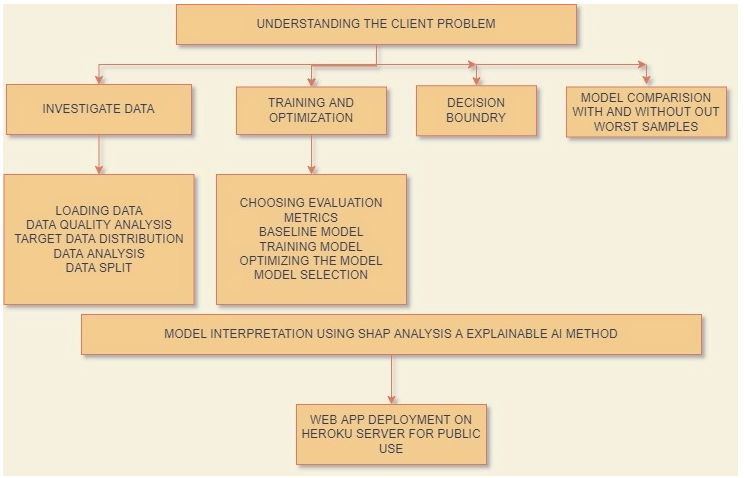

## <font color="purple"> Understanding client problem</font>


**<font color="darkgreen">Our task is to identify whether given data is Benign or Malignant cancer using Machine Learning. In order to identify the Benign and Malignant we have been provided with the dataset by the client.</font>**


**The Dataset contains following feature types:**

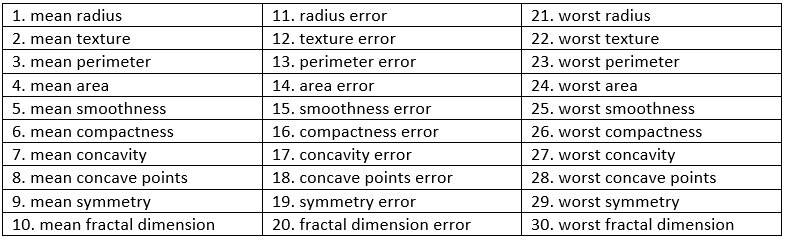

By looking at the data, we can observe that;

* The dataset has statistical property of the cancer cells
* These data are taken by the images of the cancer cells
* The property of cancer cells are combined together as the mean, standard error, and the worst or largest (mean of the three largest values). 
* However, we can observe that mean, standard error, and the worst of the features shares common statistical properties of the cancer cells and they are as follows:

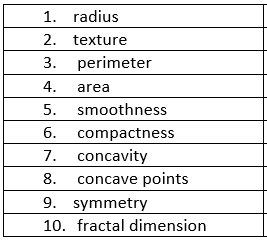

* Therefore we could say that these 10 property are the most important property to classify the Benign and Malignant. Since, we are using the images to identify these statistical property of the cancer cells we cannot identify the exact values because of noise, therefore we have to include features such mean to filter the noise by including some standard error in the features.

* Hence, our task is to identify the Benign and Malignant using the given dataset by the client.



## <font color="purple"> Literature Review </font>

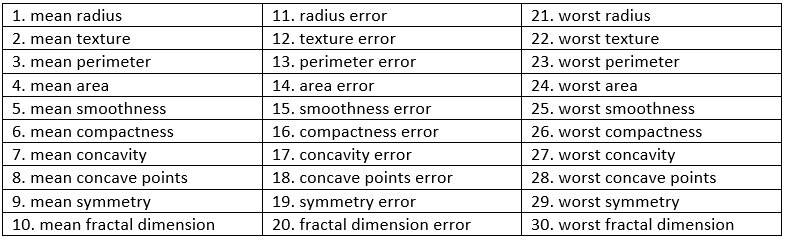

* Therefore we could say that these 10 property are the most important property to classify the Benign and Malignant. Since, we are using the images to identify these statistical property of the cancer cells we cannot identify the exact values because of noise, therefore we have to include features such mean to filter the noise by including some standard error in the features.

* Hence, our task is to identify the Benign and Malignant using the given dataset by the client.

## <font color="purple"> Understanding problem</font>

Cancer can result from abnormal proliferation of any of the different types of cells in the body, so there are more than a hundred different types of cancer, which can vary significantly in their behavior and response to treatment. The most important issue in cancer pathology is the distinction between **benign and malignant.**


**<font color="darkgreen">Benign and Malignant</font>**

Benign and Malignant are one of the type of cancers and they have distinct property in their appearance, behaviour and physical property.

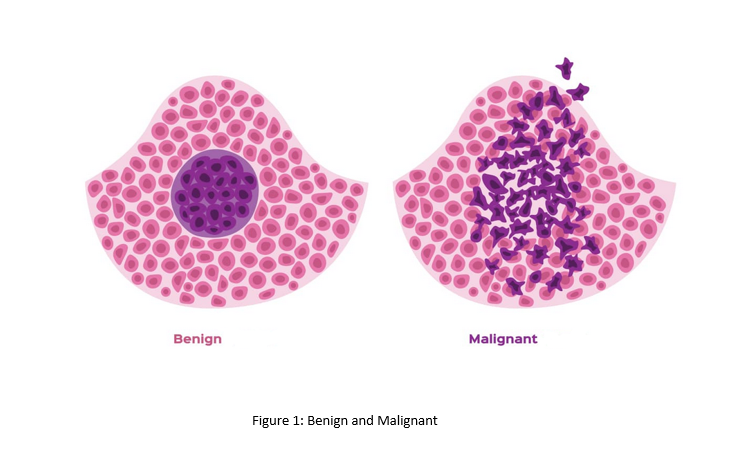

Beingn and Malignant describes the behaviour of cancer in the terms of noncancerous or cancerous. Here Cancerous is Malignant and Non cancerous is a Benign.

The behaviour of benign has important property that when the cancer has formed it stays at the sample place, however, Malignant cancer spreads and invades the other surroudning tissues to spread the cancer therefore Malignant cancers are cancerous and Benign cancer types are noncancerous.

From the above figure 1, we can observe that the Benign cancer have a smooth edge and they stay at the sample place without invading the surrounding tissues. However, Malignant cancer types are non-defined and we can observe that they are spreading across the surroundig tissues.

**<font color="darkgreen">Statistical property of Benign and Malignant</font>**

We will use the following statistical properties:

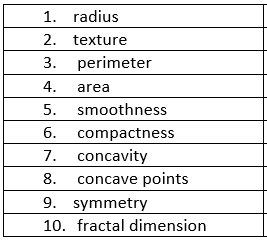




**<font color="red">Radius</font>**

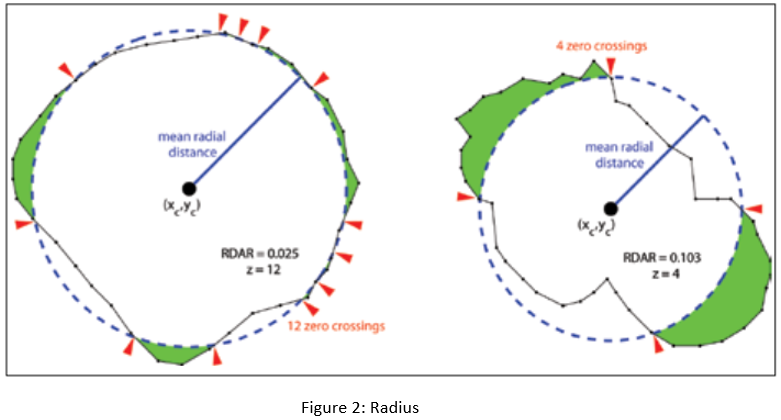

* From the figure 1 above we see that shape of the benign is similar to circular however, shape of Malignant is irregualr. 
* The radius is used to identify the irregularity in the shape of cancer cells. 
* From the figure 2, we can observe that radial distance defined from the center (xc, yc) is aprroximately equivalent, however, the cell in the right has varied radial distance. The RDAR in the figure 2 indicates the degree to which a cencer cell extends outside the equivalent circle centered at centroid (xc, yc).
* We can say that if there are lot of variation in the radius we could classify it as Malignant and if the shape is equivalent it is Benign.
* From the given data, the mean radius of the benign is 13.3 and mean radius of Malignant is 15.1




**<font color="red">Texture</font>**

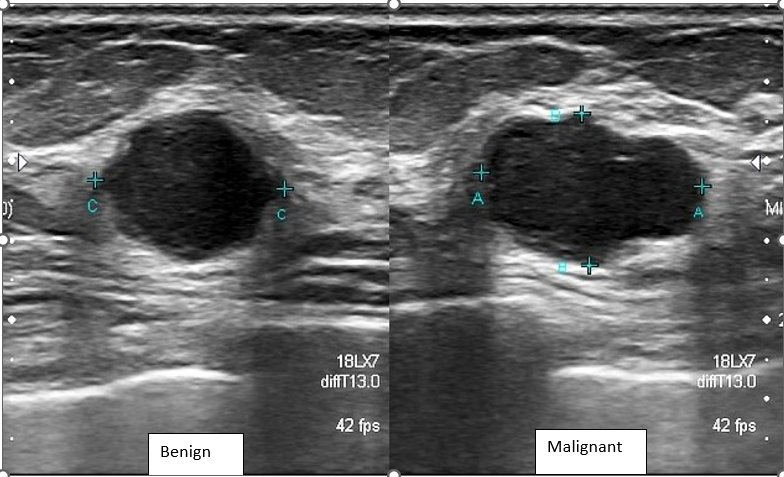

* Texture are the crucial representations of ultrasound breast tumor image because it helps inproving the classification of Benign and Malignant.
* The texture of benign is smooth and they are squishy form however, malignant causes swelling and redness.
* From the given data, the mean radius of the benign is {} and mean radius of Malignant is {}


**<font color="red">Perimeter</font>**

* From the figure 2 we can observe the radius of cancer cells for benign and malignant.
* We know that perimeter is related to the radius.
* Using parameter we can identify if the shape of the cells are irregular and by doing that we cab classify them as benign and malignant.
* From the given data, the mean perimeter of the benign is 86 and mean perimeter of Malignant is 99


**<font color="red">Area</font>**
* From the figure 2 we can observe the radius of cancer cells for benign and malignant.
* We know that area is related to the radius.
* Using parameter we can identify if the shape of the cells are irregular and by doing that we cab classify them as benign and malignant.


**<font color="red">Smoothness</font>**
* Benign cancer cells are smooth and they have defined regular smooth shape, however, Malignant cancer cells are irregular smooth in shape. 
* The values of smoothness in breast cancer ranges from 0.052630–0.163400


**<font color="red">Concavity and Concave points</font>**

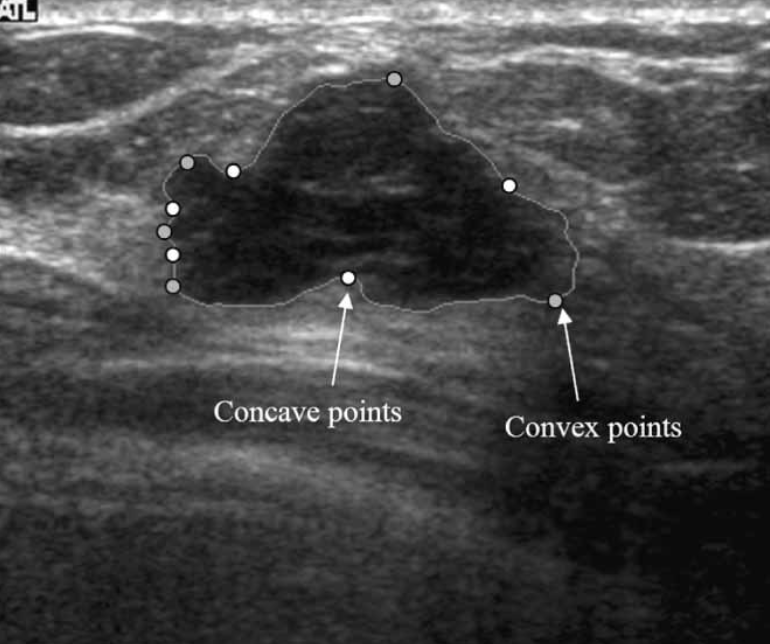

* The concavity can be used for equvilalency in the shape of cancer cells.
* From the given data, the mean concavity of the benign is 0.07 and mean concavity of Malignant is 0.11, whereas mean concave points of the benign is 0.04 and mean concave points of Malignant is 0.06.

**From the above measures, we can see that size of malignant and its physical property is larger than the Benign**

## 1. Investigate Dataset

In [2]:
# This code imports some libraries that you will need. 
# You should not need to modify it, though you are expected to make other imports later in your code.

# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Common imports
import numpy as np
import time

# Pandas for overview
import pandas as pd

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"
from sklearn import tree
from sklearn import svm
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix

# Plot setup
import matplotlib as mpl
import matplotlib.pyplot as plt
'''mpl.rc('axes', labelsize=7)
mpl.rc('xtick', labelsize=6)
mpl.rc('ytick', labelsize=6)
mpl.rc('figure', dpi=240)
plt.close('all')'''

import seaborn as sns




### <font color="purple">1.1 Load the dataset </font>

<font color="purple">**Print out some information (in text) about the data, to verify that the loading has worked and to get a feeling for what is present in the dataset and the range of the values.**</font>

<font color="purple">**Also, graphically show the proportions of the labels in the whole dataset.**</font>

<font color="darkgreen">**Answer for the 1.1 workflow**</font>
***
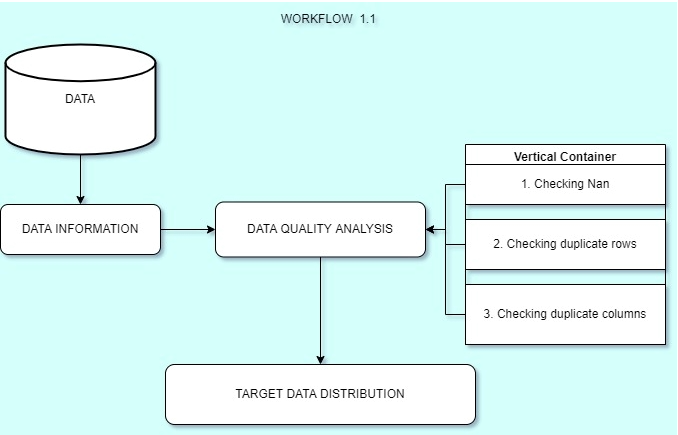
***
* **STEP 1: Loading the dataset**
* **STEP 2: Data Information**
* **STEP 3: Data Quality Analysis**
    * 3.1 *checking Nan in the data*
    * 3.2 *checking duplicate rows in the data* 
    * 3.3 *checking duplicate columns in teh data*
* **STEP 4: Target data distribution**
***

**<font color="purple">LOADING DATASET</font>**

In [3]:
# Load dataset

data = pd.read_csv("assignment2.csv")

# extracting feature names
feature_names = data.columns[1:]

# extracting the labels
labels = list(data["label"].unique())

**<font color="purple">DISPLAYING THE FEATURE NAMES AND TAREGT DATA</font>**

In [4]:
print("=================================Feature names=================================")
print(feature_names)
print("Total Features in the dataset: ", len(feature_names))
print("------------------------------------------------------------------------------")
print() 
print("====================================Labels=====================================")
print(labels)
print("Total labels in the dataset: ", len(labels))
print("------------------------------------------------------------------------------")

=================================Feature names=================================
Index(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error', 'fractal dimension error',
       'worst radius', 'worst texture', 'worst perimeter', 'worst area',
       'worst smoothness', 'worst compactness', 'worst concavity',
       'worst concave points', 'worst symmetry', 'worst fractal dimension'],
      dtype='object')
Total Features in the dataset:  30
------------------------------------------------------------------------------

====================================Labels=====================================
['malignant', 'benign']
Total labels in the dataset:  2
--------

**<font color="darkgreen">Observation</font>**
***
* In the dataset, we have total of 30 independent features and 2 target labels.
* From the feature names, we can see that these features are related to the statistical property of the cancer cells.
* We have target labels as: Malignant and Benign. 
* For classification, we will consider the Malignant target as positive class, whereas, Benign as negative class.
* Since, Our target labels are in category form with non-numerical type and Computer require numerical values to do the calculatuions we will encode Malignant as + 1 and Benign as 0.
*  We have used 1 and 0 convention because we are using sklearn library for modeling and in the binary classification the positive class is labelled as 1 and negative class is labelled as 0
***

**<font color="purple">DATA INFORMATION</font>**

* <u>For describing the data, we will use following two methods:</u>
    * **data describe:** This method will give us the information of statistical property of the data
    * **data info:** This method will give us the information of type of data 

***
**<font color="darkgreen">Data describe method</font>**
***

In [5]:
# Describing the data 
data.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
count,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,...,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000
mean,14.231808,19.312619,92.727687,664.367372,0.096937,0.106615,0.092591,0.050820,0.182546,0.062841,...,16.460566,25.772128,108.563914,900.644633,0.133424,0.261732,0.282075,0.118146,0.293620,0.084556
std,1.297393,1.572224,8.949937,129.515717,0.005067,0.020819,0.030312,0.014350,0.010754,0.002736,...,1.798202,2.346310,12.500033,209.738842,0.008678,0.063535,0.079831,0.024552,0.025620,0.007427
min,11.560025,15.349270,74.690886,477.371592,0.084651,0.075184,0.050771,0.028701,0.157059,0.057830,...,13.279265,20.144214,87.110184,633.771881,0.110342,0.167098,0.152272,0.066927,0.240341,0.072745
25%,13.356676,18.194791,86.659535,580.383274,0.093305,0.091105,0.069071,0.039507,0.175353,0.060950,...,15.148044,24.058893,99.229249,752.124790,0.127682,0.215767,0.219671,0.098389,0.277676,0.079636
50%,13.976933,19.220652,90.896982,628.004851,0.096722,0.102401,0.084829,0.046744,0.181685,0.062477,...,16.007171,25.689861,105.540619,828.667704,0.133064,0.247022,0.267894,0.115679,0.288994,0.082610
75%,15.103078,20.245660,99.093762,737.444716,0.099995,0.117334,0.107994,0.060606,0.187789,0.064149,...,17.656889,27.333610,116.274995,1011.628413,0.138650,0.298732,0.325278,0.136687,0.305227,0.087645
max,19.090091,26.836291,126.168030,1300.788708,0.114500,0.192880,0.212704,0.105212,0.226448,0.076091,...,22.676185,34.614459,150.353232,1796.820974,0.164583,0.543118,0.635074,0.179794,0.432297,0.128288


***
**<font color="darkgreen">Observation</font>**
***
* By observing the data we can see that, there are 300 samples and each each 30 features and we need to classify the sample into Malignant or Benign.
***
* From the dataset we can see that, The **mean radius has values in the range of 11.56 to 19.09 where as the mean of the feature is 14.232. However, the deviation between comparing the other sample is 1.297.**
***
* The **mean texture has values in the range of 15.349 to 26.836 where as the mean of the feature is 19.313. However, the deviation between comparing the other sample is 1.572.**
***
* The **mean perimeter has values in the range of 74.691 to 126.168 where as the mean of the feature is 92.728. However, the deviation between comparing the other sample is 8.95.**
***
* The **mean area has values in the range of 477.372 to 1300.789 where as the mean of the feature is 664.367. However, the deviation between comparing the other sample is 129.516.**
***
* The **mean smoothness has values in the range of 0.085 to 0.114 where as the mean of the feature is 0.097. However, the deviation between comparing the other sample is 0.005.**
***
* The **mean smoothness has values in the range of 0.085 to 0.114 where as the mean of the feature is 0.097. However, the deviation between comparing the other sample is 0.005.**
***
* The **mean compactness has values in the range of 0.075 to 0.193 where as the mean of the feature is 0.107. However, the deviation between comparing the other sample is 0.021.**
***
* The **mean concavity has values in the range of 0.051 to 0.213 where as the mean of the feature is 0.093. However, the deviation between comparing the other sample is 0.03.**
***
* The **mean concave points has values in the range of 0.029 to 0.105 where as the mean of the feature is 0.051. However, the deviation between comparing the other sample is 0.014.**
***
* The **mean symmetry has values in the range of 0.157 to 0.226 where as the mean of the feature is 0.183. However, the deviation between comparing the other sample is 0.011.**
***
* The **mean fractal dimension has values in the range of 0.058 to 0.076 where as the mean of the feature is 0.063. However, the deviation between comparing the other sample is 0.003.**
***
* The **radius error has values in the range of 0.298 to 1.287 where as the mean of the feature is 0.416. However, the deviation between comparing the other sample is 0.105.**
***
* The **texture error has values in the range of 0.898 to 2.561 where as the mean of the feature is 1.217. However, the deviation between comparing the other sample is 0.2.**
***
* The **perimeter error has values in the range of 2.059 to 9.708 where as the mean of the feature is 2.939. However, the deviation between comparing the other sample is 0.784.**
***
* The **area error has values in the range of 27.694 to 214.346 where as the mean of the feature is 41.668. However, the deviation between comparing the other sample is 16.513.**
***
* The **smoothness error has values in the range of 0.005 to 0.016 where as the mean of the feature is 0.007. However, the deviation between comparing the other sample is 0.001.**
***
* The **compactness error has values in the range of 0.017 to 0.065 where as the mean of the feature is 0.026. However, the deviation between comparing the other sample is 0.007.**
***
* The **concavity error has values in the range of 0.019 to 0.164 where as the mean of the feature is 0.033. However, the deviation between comparing the other sample is 0.013.**
***
* The **concave points error has values in the range of 0.007 to 0.027 where as the mean of the feature is 0.012. However, the deviation between comparing the other sample is 0.002.**
***
* The **symmetry error has values in the range of 0.016 to 0.042 where as the mean of the feature is 0.021. However, the deviation between comparing the other sample is 0.003.**
***
* The **fractal dimension error has values in the range of 0.003 to 0.013 where as the mean of the feature is 0.004. However, the deviation between comparing the other sample is 0.001.**
***
* The **worst radius has values in the range of 13.279 to 22.676 where as the mean of the feature is 16.461. However, the deviation between comparing the other sample is 1.798.**
***
* The **worst texture has values in the range of 20.144 to 34.614 where as the mean of the feature is 25.772. However, the deviation between comparing the other sample is 2.346.**
***
* The **worst perimeter has values in the range of 87.11 to 150.353 where as the mean of the feature is 108.564. However, the deviation between comparing the other sample is 12.5.**
***
* The **worst area has values in the range of 633.772 to 1796.821 where as the mean of the feature is 900.645. However, the deviation between comparing the other sample is 209.739.**
***
* The **worst smoothness has values in the range of 0.11 to 0.165 where as the mean of the feature is 0.133. However, the deviation between comparing the other sample is 0.009.**
***
* The **worst compactness has values in the range of 0.167 to 0.543 where as the mean of the feature is 0.262. However, the deviation between comparing the other sample is 0.064.**
***
* The **worst concavity has values in the range of 0.152 to 0.635 where as the mean of the feature is 0.282. However, the deviation between comparing the other sample is 0.08.**
***
* The **worst concave points has values in the range of 0.067 to 0.18 where as the mean of the feature is 0.118. However, the deviation between comparing the other sample is 0.025.**
***
* The **worst symmetry has values in the range of 0.24 to 0.432 where as the mean of the feature is 0.294. However, the deviation between comparing the other sample is 0.026.**
***
* The **worst fractal dimension has values in the range of 0.073 to 0.128 where as the mean of the feature is 0.085. However, the deviation between comparing the other sample is 0.007.**
***

**<font color="darkgreen">Dataset information</font>**

In [6]:
# data information
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   label                    300 non-null    object 
 1   mean radius              300 non-null    float64
 2   mean texture             300 non-null    float64
 3   mean perimeter           300 non-null    float64
 4   mean area                300 non-null    float64
 5   mean smoothness          300 non-null    float64
 6   mean compactness         300 non-null    float64
 7   mean concavity           300 non-null    float64
 8   mean concave points      300 non-null    float64
 9   mean symmetry            300 non-null    float64
 10  mean fractal dimension   300 non-null    float64
 11  radius error             300 non-null    float64
 12  texture error            300 non-null    float64
 13  perimeter error          300 non-null    float64
 14  area error               3

***
**<font color="darkgreen">Observation</font>**
***
* From the data information we can see that, all the independent features has float64 data type where label are object type because, the values are categories that is Malignant or Benign.
* The overall data takes 72.8Kb storage
***

**<font color="purple">DATA QUALITY ANALYSIS</font>**

* Quality of the data need to be check because, there are cases when there is wrong data is present.
* Every organisation has a workflow where they check quality of the data to overcome any issues during the modelling.
* Here, in the data quality analysis, we will do the following analysis to check the quality of the data:
    * **Checking the total Nan in the data:** If there are any Nan, we will either drop the nan values or use the impuation methods.
    * **Checking the duplicate rows:** If there are any duplicate rows present, we can remove them while training the model. Because, two samples are same and has same information hence we can use any one sample from those duplicate data. If we do not remove it, the complexity of compuation increases.
    * **Checking the duplicate coloumns** If there are duplicate columns, then, we are introducing the dependency in between the feature which causes the multicollinearity. Because, our parameteric models in the experiment has assumptions that features are independent hence we should avoid having any features that are same or very much related to each other.

In [7]:
class DataValidator:
    
    def __init__(self, dataset, taregtlabel):
        
        '''
        datset: dataset in the dataframe format
        targetlabel: label in the form of string format
        '''
        
        self.df = dataset
        self.label = taregtlabel
        
    def checknan(self):
        print("--------------------------Checking Nan in the data--------------------------")
        print()
        nan_chcek = self.df.isna().sum(axis=0)
        nan_df = pd.DataFrame(data=nan_chcek.values, columns=["Total Nan"], 
                              index=nan_chcek.index)
        if nan_df["Total Nan"].sum()==0:
            print("Result: There no Nan values in the dataset")
            print()
            print("Printing report...")
            print(tabulate(nan_df, headers=["Features", "Total Nan"], tablefmt='psql'))
        else:
            print(tabulate(nan_df, headers=["Features", "Total Nan"], tablefmt='psql'))
        print()
    
    def chceksameinstance(self):
        print("--------------------------Checking duplicate rows--------------------------")
        print()
        duplicate_row = self.df.duplicated().sum()
        if duplicate_row==0:
            print("Result: There are no duplciate values in the dataset")
            print()
            dup_df = pd.DataFrame(columns=["Total Duplicate"], 
                                  index=["Rows"], data=[duplicate_row])
            print("Printing report...")
            print(tabulate(dup_df, headers=["Type", "Total Duplicate"], tablefmt='psql'))
        else:
            print("Duplicate rows are found")
            print()
            dup_df = pd.DataFrame(columns=["Total Duplicate"], 
                                  index=["Rows"], data=[duplicate_row])
            print("Printing report...")
            print(tabulate(dup_df, headers=["Type", "Total Duplicate"], tablefmt='psql'))
        print()
            
    def checksamefeature(self):
        dup_sum = 0
        print("--------------------------Checking duplicate columns--------------------------")
        print()
        cols = self.df.columns
        for c in cols:
            for f in cols:
                if c!=self.label or f!=self.label:
                    if c!=f:
                        if self.df[c].equals(self.df[f]):
                            print(c,f)
                            dup_sum+=1
        if dup_sum==0:
            print("Result: There are no duplicate columns/features in the dataset")
            print()
            dup_df = pd.DataFrame(data=[dup_sum], columns=["Total Duplicate"], index=["Columns"])
            print("Printing report...")
            print(tabulate(dup_df, headers=["Type", "Total Duplicate"], tablefmt='psql'))
        else:
            print("Duplicate features are found")
            print()
            dup_df = pd.DataFrame(data=[dup_sum], columns=["Total Duplicate"], index=["Columns"])
            print("Printing report...")
            print(tabulate(dup_df, headers=["Type", "Total Duplicate"], tablefmt='psql'))
        print() 
            
    def run(self):
        self.checknan()
        self.chceksameinstance()
        self.checksamefeature()

In [8]:
from tabulate import tabulate

In [9]:
# data quality analysis 

data_quality = DataValidator(dataset=data, taregtlabel="label")

# run method will run all the methods
data_quality.run()

--------------------------Checking Nan in the data--------------------------

Result: There no Nan values in the dataset

Printing report...
+-------------------------+-------------+
| Features                |   Total Nan |
|-------------------------+-------------|
| label                   |           0 |
| mean radius             |           0 |
| mean texture            |           0 |
| mean perimeter          |           0 |
| mean area               |           0 |
| mean smoothness         |           0 |
| mean compactness        |           0 |
| mean concavity          |           0 |
| mean concave points     |           0 |
| mean symmetry           |           0 |
| mean fractal dimension  |           0 |
| radius error            |           0 |
| texture error           |           0 |
| perimeter error         |           0 |
| area error              |           0 |
| smoothness error        |           0 |
| compactness error       |           0 |
| concavity error  

***
**<font color="darkgreen">Observation</font>**
* From the above data quality analysis, we can observe that:
    * **There are no Nan values present in the dataset**, hence we do not have to do the dropping Nan or any impuation methods.
    * **There are no duplicate rows is present in the dataset**, hence we do not have to remove the rows.
    * **There are no duplicate coloumns present in the dataset**, hence we do not have to remove any coloumns in the dataset


* **Overall, our data is clean**
***

**<font color="purple">TARGET DISTRIBUTION IN THE DATASET</font>**

Total benign in the dataset is: 154 
Total malignant in the dataset is: 146 




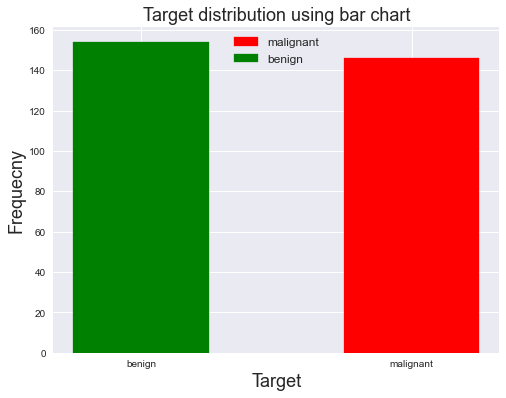

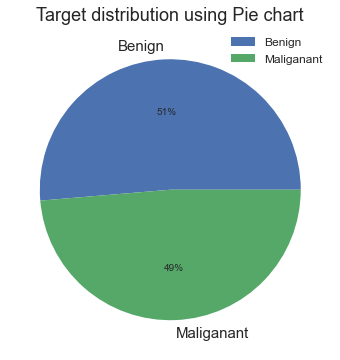

In [10]:
# bar plot
classes, frequency = np.unique(data["label"], return_counts=True)
print("Total {} in the dataset is: {} ".format(classes[0], frequency[0]))
print("Total {} in the dataset is: {} ".format(classes[1], frequency[1]))
print()
print()
plt.style.use("seaborn")
colorsbar = {"benign":'red', "malignant":"green"}
labelsbar = list(colorsbar.keys())
handles = [plt.Rectangle((0,0),1,1, color=colorsbar[label_]) for label_ in labelsbar]
plt.figure(figsize=(8,6))
bar_ = plt.bar(x=classes, height=frequency, width=0.5)
bar_[0].set_color('green')
bar_[1].set_color("red")
plt.title("Target distribution using bar chart", fontsize=18)
plt.xlabel("Target",fontsize=18)
plt.ylabel("Frequecny", fontsize=18)
plt.legend(handles, labels, loc="upper center", fontsize=12)
plt.show()
print()
print()
print()
# pie chart
plt.figure(figsize=(8, 6))
patches, texts, autotext = plt.pie(frequency, labels=["Benign", "Maliganant"], autopct='%.0f%%')
plt.title("Target distribution using Pie chart", fontsize=18)
texts[0].set_fontsize(15)
texts[1].set_fontsize(15)
plt.legend(fontsize=12)
plt.show();

* From the above analysis, we can see that,
    - There are 300 samples and out of 300 we have 154 sample are Benign and 146 samples are Malignant.
    - Total of 51% of data is belongs to the Benign and only 49% of the labels are assigned for Malignant.
    - The dataset does not have equal propotion of the labels, but we cannot consider this propotion as imbalanced because the imbalance ratio is quite very less hence it us mild-imbalance dataset.

### <font color="purple">DATA VISUALIZATION & ANALYSIS</font>

**Data analysis workflow**

* <u>In this section, we will visualize and analyse the data according to below workflow:</u>

* **Step 1: Mean, Standard error, Worst group data distribution**
* **Step 2: Rank features**
* **Step 3: In depth top 10 ranking feature analysis**

**The worksflow is shown below**
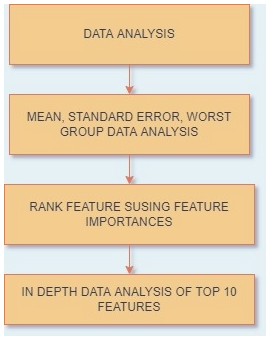

**STEP 1:  Mean, Standard error, Worst group data distribution**

### <font color="purple">1.2 Visualise the dataset</font>

<font color="purple">As this data is well curated by the client already, you do not need to worry about outliers, missing values or imputation in this case, but be aware that this is the exception, not the rule.</font>

<font color="purple">To familiarise yourself with the nature and information contained in the data, display histograms for the data according to the following instructions:</font>

* <font color="purple">**display histograms** for each feature in the _mean_ group, but on _each_ histogram **have the two classes displayed together in one plot** (see example plot below and a code fragment to help you) - and note that your plot does not need to look exactly the example here;</font>
* <font color="purple">**repeat this** for the _standard error_ and _worst_ groups;</font>
* <font color="purple">make sure that in all cases you clearly label the plots and the classes in histograms.</font>

<center><img src="Example_Hist_Plot.png" width="300" alt="Example plot of histogram"></center>

In [11]:
def _histograms_grpby(data, requiredfeatures):
    '''
    data: the dataset used for plotting
    requiredfeatures: feature name
    '''
    malignant = data[data["label"]=="malignant"]
    benign = data[data["label"]=="benign"]
    fig, ax = plt.subplots(4, 3, figsize=(15,10), sharex=True, squeeze=False)
    for ix, col in enumerate(requiredfeatures):
        ax = fig.add_subplot(4, 3, ix+1)
        ax1=sns.histplot(data=malignant, x=col, hue="label", kde=True,facecolor=(1,0,0,0.35),label="Malignant", ax=ax)
        ax2=sns.histplot(data=benign, x=col, hue="label", kde=True,facecolor=(0,0,1,0.35),label="Benign", ax=ax)
        ax1.lines[0].set_color((0,0,1,0.35))
        ax2.lines[0].set_color((1,0,0,0.35))
        ax.set_title(col+" "+"Distribution")
        plt.ylabel("Frequency")
        ax.legend()
        fig.tight_layout() 
    plt.close(11)
    plt.close(12)
    plt.show()

**Mean group features data distribution**

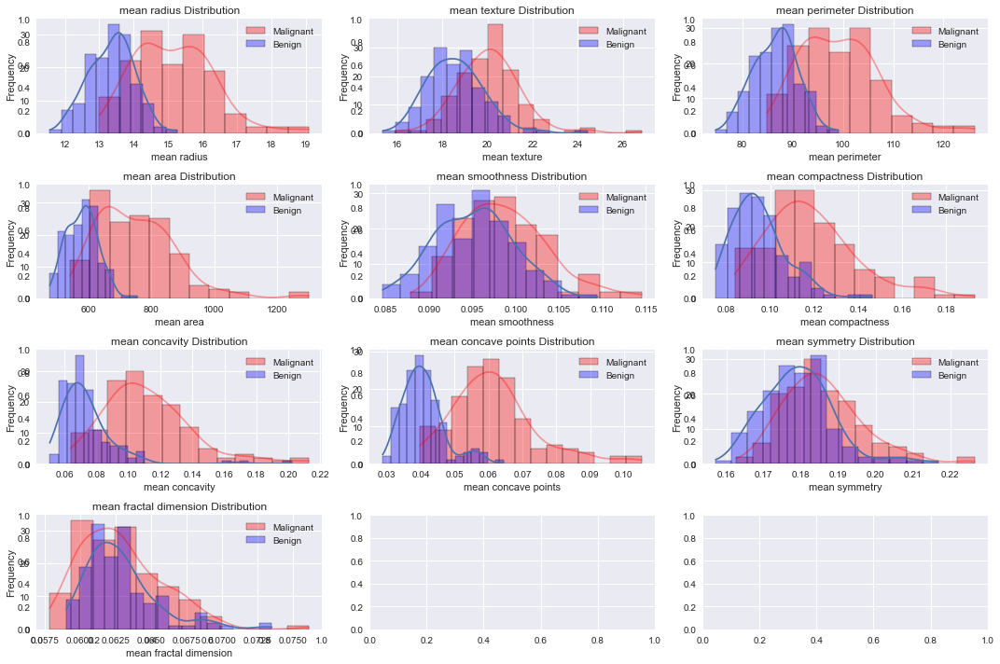

In [12]:
# mean group 
mean_ft = data.iloc[:, 1:11]
_histograms_grpby(data, mean_ft)

### <font color="purple">Observation</font>


* From the earlier analysis, we saw that **mean radius** has mean value of 13.35 for benign and 15.16 for malignant. However, from the above plot we can see that when the radius of malignant has maximum radius of 19 whereas, benign has maximum of value of 15.3. The distribution of mean radius is much stretched towards the Malignant because large radius, but the distribution looks much more similar to the bell curve.
***
* From the earlier analysis, we saw that **mean texture** has mean value of 18.58 for benign and 20.08 for malignant. However, from the above plot we can see that benign has maximum of value of 24.43 and malignant has maximum value of 26.83. The distribution of mean texture is not much stretched towards the Malignant because maximum values for both benign and malignant are much similar and the distribution looks much more similar to the bell curve.
***
* From the earlier analysis, we saw that **mean area** has mean value of 580.68 for benign and 752.6 for malignant. However, from the above plot we can see that when the area of malignant has maximum perimeter of 1300 whereas, benign has maximum of value of 756. The distribution of mean area is much stretched towards the Malignant because large area, but the distribution looks much more similar to the **positive skew that right skew distribution.**
***
* From the earlier analysis, we saw that **mean perimeter** has mean value of 86.54 for benign and 99.25 for malignant. However, from the above plot we can see that when the perimeter of malignant has maximum perimeter of 126 whereas, benign has maximum of value of 99. The distribution of mean perimeter is much stretched towards the Malignant because large perimeter, but the distribution looks much more similar to the **positive skew that right skew distribution.**
***
* From the earlier analysis, we saw that **mean smoothness** has mean value of 0.095 for benign and 0.098 for malignant. However, from the above plot we can see that benign has maximum of value of 0.109 and malignant has maximum value of 0.11. The distribution of mean smoothness is not much stretched towards the Malignant because maximum values for both benign and malignant are much similar and the distribution looks much more similar to the bell curve.
***
* From the earlier analysis, we saw that **mean compactness** has mean value of 0.095 for benign and 0.118 for malignant. However, from the above plot we can see that when the compactness of malignant has maximum compactness of 0.192 whereas, benign has maximum of value of 0.146. The distribution of mean compactness is much stretched towards the Malignant because large compactness, but the distribution looks much more similar to the **positive skew that right skew distribution.**
***
* From the earlier analysis, we saw that **mean concavity** has mean value of 0.074 for benign and 0.111 for malignant. However, from the above plot we can see that when the concavity = of malignant has maximum compactness of 0.21 whereas, benign has maximum of value of 0.2. The distribution of mean concavity is much stretched towards the Malignant because of large compactness. however, we could also see that benign has very few values near the maximum value of malignant, but they look more like outlier while comparing the mean values. but the distribution looks much more similar to the **positive skew that right skew distribution.**
***
* From the earlier analysis, we saw that **mean concave points** has mean value of 0.04 for benign and 0.06 for malignant. However, from the above plot we can see that when the concave points of malignant has maximum concave points of 0.105 whereas, benign has maximum of value of 0.06. The distribution of mean concave points is much stretched towards the Malignant because large concave points, but the distribution looks much more similar to the **positive skew that right skew distribution.**
***
* From the earlier analysis, we saw that **mean symmetry** has mean value of 0.179 for benign and 0.18 for malignant. However, from the above plot we can see that benign has maximum of value of 0.21 and malignant has maximum value of 0.22. The distribution of mean symmetry is not much stretched towards the Malignant because maximum values for both benign and malignant are much similar and the distribution looks much more similar to the bell curve.
***
* From the earlier analysis, we saw that **mean fractal dimension** has mean value of 0.06 for benign and 0.06 for malignant. However, from the above plot we can see that benign has maximum of value of 0.07 and malignant has maximum value of 0.07. The distribution of mean fractal dimension is not much stretched towards the Malignant because maximum values for both benign and malignant are much similar and the distribution looks much more similar to the bell curve.

**Standard Error group features data distribution**

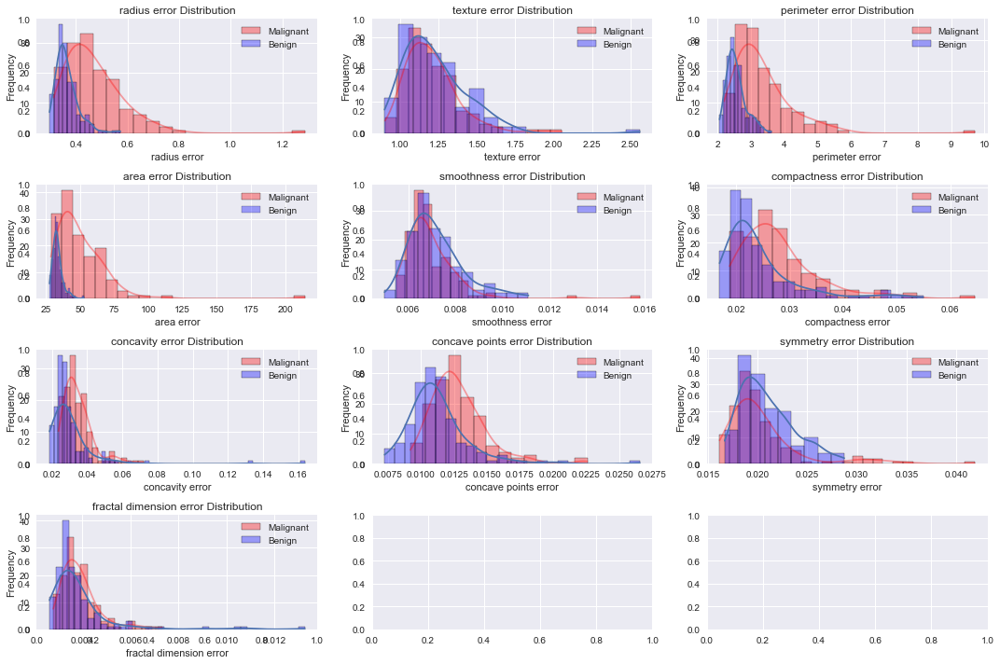

In [13]:
# standard error group
err_ft = data.iloc[:, 11:21]
_histograms_grpby(data, err_ft)

### <font color="purple">Observation</font>


* From the analysis, we can see that, **radius error** has the mean value of 0.364 for benign and malignant has 0.47. However, the maximum value for malignant is 1.287 whereas benign has 0.57 as the maximum values. Hence, we can say that the values are more strectched towards the malignant and the distribution looks much more similar to the **positively skewed right skew distribution**
***
* From the analysis, we can see that, **texture error** has the mean value of 1.22 for benign and malignant has 1.20. However, the maximum value for malignant is 2.05 whereas benign has 2.56 as the maximum values. Hence, we can say that the values are more strectched towards the benign and the distribution looks much more similar to the **positively skewed right skew distribution**
***
* From the analysis, we can see that, **perimeter error** has the mean value of 2.55 for benign and malignant has 3.34. However, the maximum value for malignant is 9.7 whereas benign has 3.6 as the maximum values. Hence, we can say that the values are more strectched towards the malignant and the distribution looks much more similar to the **positively skewed right skew distribution**
***
* From the analysis, we can see that, **area error** has the mean value of 33.51 for benign and malignant has 50.27. However, the maximum value for malignant is 214 whereas benign has 52 as the maximum values. Hence, we can say that the values are more strectched towards the malignant and the distribution looks much more similar to the **positively skewed right skew distribution**
***
* From the analysis, we can see that, **smoothness error** has the mean value of 0.007 for benign and malignant has 0.007. However, the maximum value for malignant is 0.015 whereas benign has 0.011 as the maximum values. However, the values looks more similar and **distribution is much similar to the bell curve**
***
* From the analysis, we can see that, **compactness error** has the mean value of 0.02 for benign and malignant has 0.02. However, the maximum value for malignant is 0.064 whereas benign has 0.054 as the maximum values. Hence, we can say that the values are more strectched towards the malignant and the distribution looks much more similar to the **positively skewed right skew distribution**
***
* From the analysis, we can see that, **concavity error** has the mean value of 0.03 for benign and malignant has 0.03. However, the maximum value for malignant is 0.07 whereas benign has 0.16 as the maximum values. Hence, we can say that the values are more strectched towards the benign and the distribution looks much more similar to the **positively skewed right skew distribution**
***
* From the analysis, we can see that, **concave points error** has the mean value of 0.01 for benign and malignant has 0.01. However, the maximum value for malignant is 0.022 whereas benign has 0.026 as the maximum values. Hence, we can say that the values are more strectched towards the benign and the distribution looks much more similar to the **positively skewed right skew distribution**
***
* From the analysis, we can see that, **symmetry error** has the mean value of 0.02 for benign and malignant has 0.02. However, the maximum value for malignant is 0.04 whereas benign has 0.02 as the maximum values. Hence, we can say that the values are more strectched towards the malignant and the distribution looks much more similar to the **positively skewed right skew distribution**
***
* From the analysis, we can see that, **fractal dimension error** has the mean value of 0.003 for benign and malignant has 0.003. However, the maximum value for malignant is 0.007 whereas benign has 0.013 as the maximum values. Hence, we can say that the values are more strectched towards the benign and the distribution looks much more similar to the **positively skewed right skew distribution**


**Worst group feature data distribution**

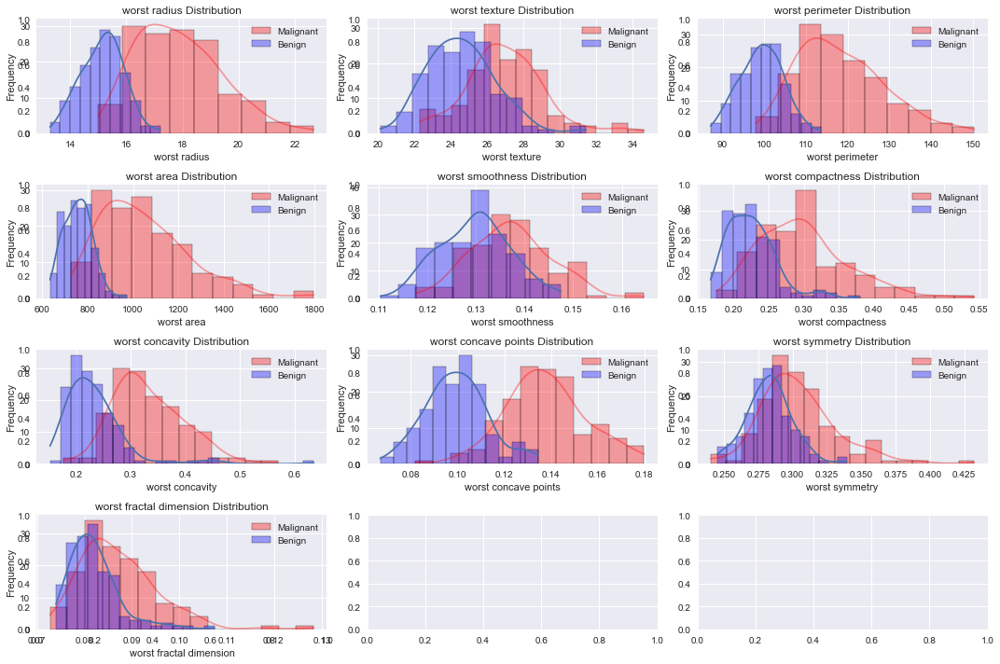

In [14]:
# worst group
wrst_ft = data.iloc[:, 21:]
_histograms_grpby(data, wrst_ft)

### <font color="purple">Observation</font>

* From the analysis, we can see that **worst radus** has mean value of 15.13 for benign and 17.85 for malignant. The maximum value of malignant is 22.67 whereas benign is 17.21. Hence, we can say that the values are more strectched towards the malignant and the distribution looks much more similar to the **positively skewed right skew distribution**
***
* From the analysis, we can see that **worst radus** has mean value of 24 for benign and 27 for malignant. The maximum value of malignant is 34 whereas benign is 31. Hence, we can say that the values are more strectched towards the malignant and the distribution looks much more similar to the **positively skewed right skew distribution**
***
* From the analysis, we can see that **worst perimeter** has mean value of 99.2 for benign and 118.3 for malignant. The maximum value of malignant is 150 whereas benign is 113. Hence, we can say that the values are more strectched towards the malignant and the distribution looks much more similar to the **positively skewed right skew distribution**
***
* From the analysis, we can see that **worst area** has mean value of 756 for benign and 1052 for malignant. The maximum value of malignant is 1796 whereas benign is 972. Hence, we can say that the values are more strectched towards the malignant and the distribution looks much more similar to the **positively skewed right skew distribution**
***
* From the analysis, we can see that **worst smoothness** has mean value of 0.12 for benign and 0.13 for malignant. The maximum value of malignant is 0.16 whereas benign is 0.14. However, the values looks much more similar and they have a **distribution similar to the bell curve**
***
* From the analysis, we can see that **worst compactness** has mean value of 0.22 for benign and 0.3 for malignant. The maximum value of malignant is 0.54 whereas benign is 0.37. Hence, we can say that the values are more strectched towards the malignant and the distribution looks much more similar to the **positively skewed right skew distribution**
***
* From the analysis, we can see that **worst concavity** has mean value of 0.23 for benign and 0.33 for malignant. The maximum value of malignant is 0.56 whereas benign is 0.63. Hence, we can say that the values are more strectched towards the benign and the distribution looks much more similar to the **positively skewed right skew distribution**
***
* From the analysis, we can see that **worst concave points** has mean value of 0.09 for benign and 0.13 for malignant. The maximum value of malignant is 0.17 whereas benign is 0.13. However, the values looks much more similar and they have a **distribution similar to the bell curve**
***
* From the analysis, we can see that **worst symmetry** has mean value of 0.28 for benign and 0.3 for malignant. The maximum value of malignant is 0.43 whereas benign is 0.33. Hence, we can say that the values are more strectched towards the malignant and the distribution looks much more similar to the **positively skewed right skew distribution**
***
* From the analysis, we can see that **worst fractal dimesnion** has mean value of 0.08 for benign and 0.08 for malignant. The maximum value of malignant is 0.12 whereas benign is 0.10. Hence, we can say that the values are more strectched towards the malignant and the distribution looks much more similar to the **positively skewed right skew distribution**

### <font color="purple">Feature analysis</font>

**STEP 2: Rank features using Histogram**

**In this section, we will use the following methods for feature ranking. These methods are mix of univariate and bivariate analysis**

* **Histogram method** (looking at the data distribution. Univariate analysis)
* **Correlation method** (Bi variate analysis with the target)
* **normality** (looking at the data distribution normality. Univariate analysis)
* **mutual info** (Bi variate analysis with the target)
* **roc auc** (Bi variate analysis with the target)

**HISTOGRAM METHOD**

### <font color="purple">1.3 Ranking the features [0.5 marks]</font>

**<font color="purple">Based on the histograms, which do you think are the 3 strongest features for discriminating between the classes?</font>**


* Analysing the histogram alone to identify strongest features is a **univariate feature selection.**
* In order to use only histogram for feature selection through the **shape of distribution**, we can only identify the strong features, however, to rank them we need to **rank each features numerically and we need to use statistical analysis**.

* **Identifying the features using shape of distribution**
    - We should look for features that normally distributed with good bell-curve
    - The data should not have stretch in the tail of the distribution
    - The **Intersection in the distribution should not cover overall distribution**, because this will lead to confusion during the classification. Hence, good seperation in the two classes are more apprectiate. **Example: The Intersection in the plot are as below:** 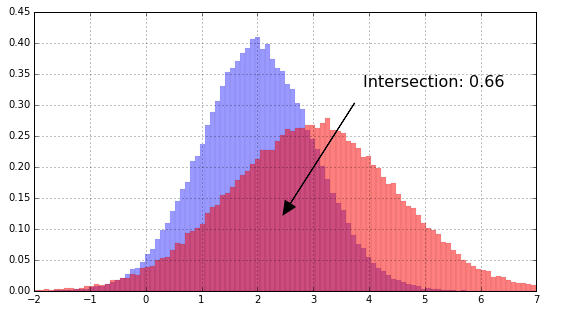

* **Identifying the features using ranking by Shapiro-Wilk normality**
* In order to identify and rank features using statistically we use features histogram distribution and here we use **normality of the distribution of the feature.**
* https://www.scikit-yb.org/en/latest/api/features/rankd.html has a package Rank1D which uses the Shapiro-Wilk algorithm to rank features using the statistic value of shapiro-wilk.
* We will write the algortihm as a function below
* **Here we will use the statistic value of Shapiro-Wilk to rank the features**. Care must be taken that this method does not take into cinsideration of **Intersection**. Hence this method is just used for extra checking purpose.


**Identifying the features using shape of distribution**

**THE RANK FEATURES ARE IN THE GROUP FORMAT**

**MEAN GROUP**
*    **Mean radius**
*    **Mean perimeter**
*    **Mean area**
*    **Mean concave points**
*    **Mean concavity**
*    **Mean compactness** 
    
**STANDARD ERROR GROUP**
*    **Radius error** 
*    **Perimeter error** 
*    **Area error** 
    
**WORST GROUP**
*    **Worst radius** 
*    **Worst perimeter** 
*    **Worst area** 
*    **Worst concavity** 
*    **Worst Concave points** 
*    **Worst compactness** 

**CORRELATION METHOD**

In [15]:
from plotly import graph_objects as go

In [17]:
# correlation
corr_df = data.copy()
corr_df["label"] = np.where(corr_df["label"]=="malignant", 1, 0)
corr_df_corr = corr_df.corr()
corr_df_label = corr_df_corr["label"]
corr_df_label = corr_df_label.sort_values(ascending=False)
corr_best_feat = list(corr_df_label.index)[1:]
corr_best_score = list(corr_df_label.values)[1:]

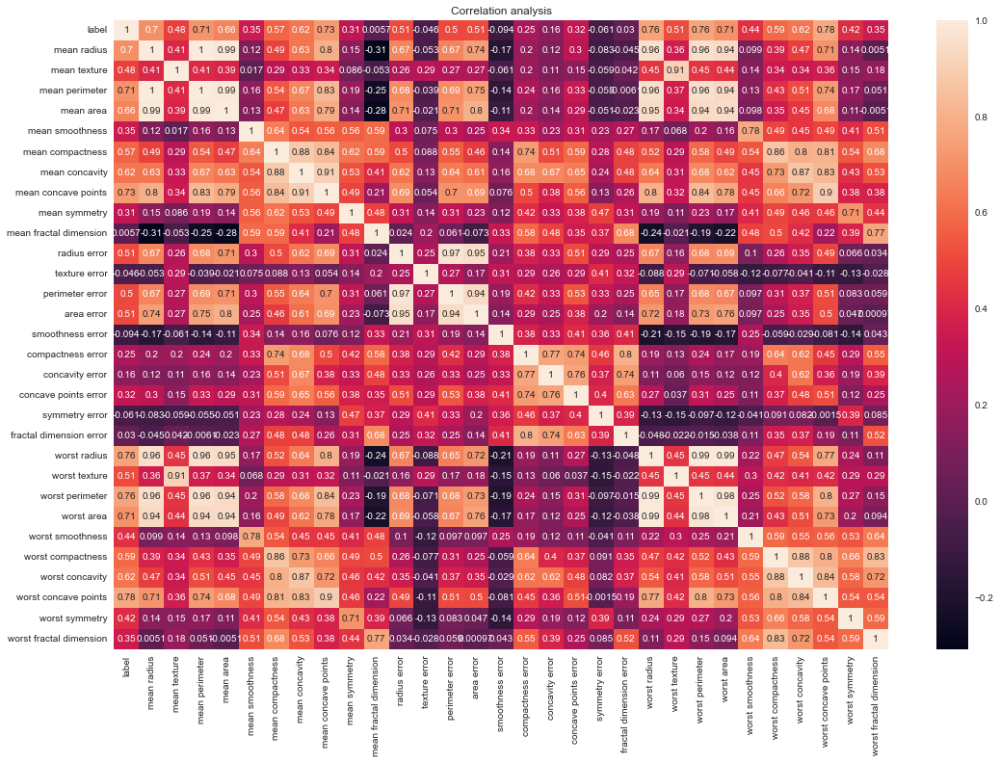

In [18]:
# plotting
plt.figure(figsize=(18,12))
sns.heatmap(corr_df_corr, annot=True)
plt.title("Correlation analysis")
plt.show()

figcorr = go.Figure()
figcorr.add_traces(data=go.Bar(x=corr_best_feat, 
                               y=corr_best_score, name="Features"))
figcorr.update_layout(title="Feature ranking using correlation", title_x=0.5,
                     xaxis_title="Features", yaxis_title="Score", showlegend=True)
figcorr.show()

**Identifying the features using ranking by Shapiro-Wilk normality**

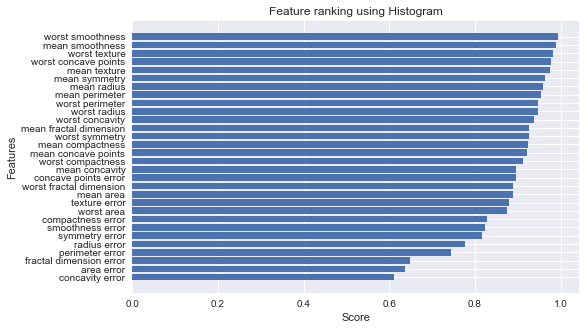

In [19]:
from scipy.stats import shapiro

def shapirowalk(df):
    cols = df.columns
    ranks = {}
    for c in cols:
        xi = df[c].values 
        ranks[c] = shapiro(xi)[0]
    return ranks

# ranking based on normality

ranks_ = shapirowalk(data.iloc[:, 1:])
sort_rank_df = pd.DataFrame(data=list(ranks_.values()), index=list(ranks_.keys()), 
                            columns=["Features"]).sort_values(by="Features", ascending=False)
plt.figure(figsize=(8,5))
plt.barh(y=list(sort_rank_df.index)[::-1], width=list(sort_rank_df["Features"])[::-1])
plt.title("Feature ranking using Histogram")
plt.xlabel("Score")
plt.ylabel("Features")
plt.show()

**ROC-AUC feature selection**

In [20]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_auc_score

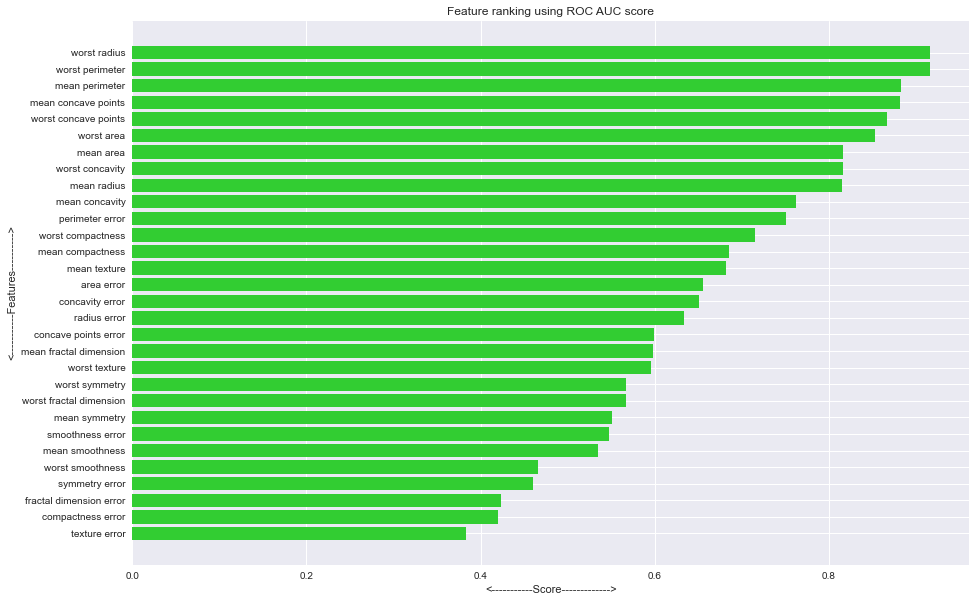

In [21]:
# analysing roc
roc_df = data.copy()
roc_df["label"] = np.where(roc_df["label"]=="malignant", 1, 0)
Xroc = roc_df.iloc[:, 1:].values 
Yroc = roc_df.iloc[:, 0].values
cols_ = roc_df.columns[1:]


# splitting the data
xtrainroc, xtestroc, ytrainroc, ytestroc = train_test_split(Xroc, Yroc, test_size=0.2, shuffle=True, 
                                                            random_state=53, stratify=Yroc)


# ranking
featurerank = {}
for c in range(Xroc.shape[1]):
    x_ = xtrainroc[:, c].reshape(-1,1)
    y_ = ytrainroc.copy()
    clf = DecisionTreeClassifier().fit(x_, y_)
    pred = clf.predict(xtestroc[:, c].reshape(-1,1))
    rauc = roc_auc_score(ytestroc, pred) 
    featurerank[cols_[c]]=rauc

# rankingking report
roc_rank = pd.DataFrame(data=list(featurerank.values()), index=list(featurerank.keys()),
                       columns=["Feature score"]).sort_values(by="Feature score", 
                                                              ascending=False)
plt.figure(figsize=(15,10))
plt.barh(y=list(roc_rank.index)[::-1], width=list(roc_rank["Feature score"])[::-1],
        color="limegreen")
plt.title("Feature ranking using ROC AUC score")
plt.xlabel("<-----------Score------------->")
plt.ylabel("<-----------Features---------->")
plt.show()

**MUTUAL INFORMATION FEATURE SELECTION**

In [22]:
from plotly import graph_objects as go 
from plotly.subplots import make_subplots
from sklearn.feature_selection import mutual_info_classif

In [23]:
def mutualinformation(data, features, target):
    x = np.array(data[features])
    y = data[target].values 
    ranks = mutual_info_classif(x, y, random_state=56, n_neighbors=3)
    df_ranks = pd.DataFrame(data=ranks, columns=["Ranks"], 
                            index=features).sort_values(by="Ranks", ascending=False)
    plt.figure(figsize=(15,10))
    plt.barh(y=list(df_ranks.index)[::-1], width=list(df_ranks["Ranks"])[::-1],
            color="darkgreen")
    plt.title("Feature ranking using Mutual information")
    plt.xlabel("<-----------Score------------->")
    plt.ylabel("<-----------Features---------->")
    plt.show()
    plt.figure(figsize=(15,10))
    sns.heatmap(df_ranks, annot=True)
    plt.title("Heat map foor Feature ranking using Mutual information")
    plt.ylabel("<----------Features---------->")
    plt.show()
    return df_ranks

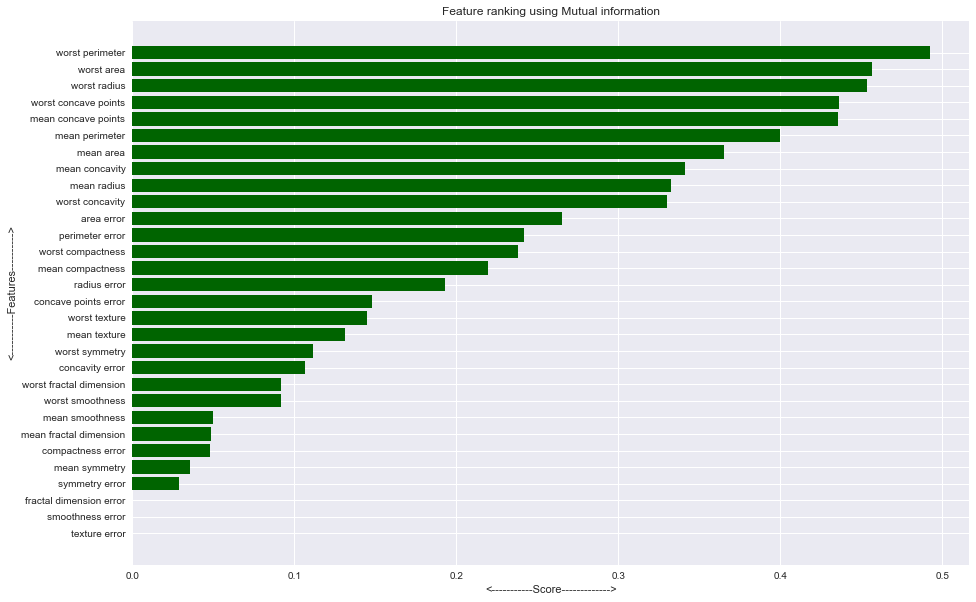

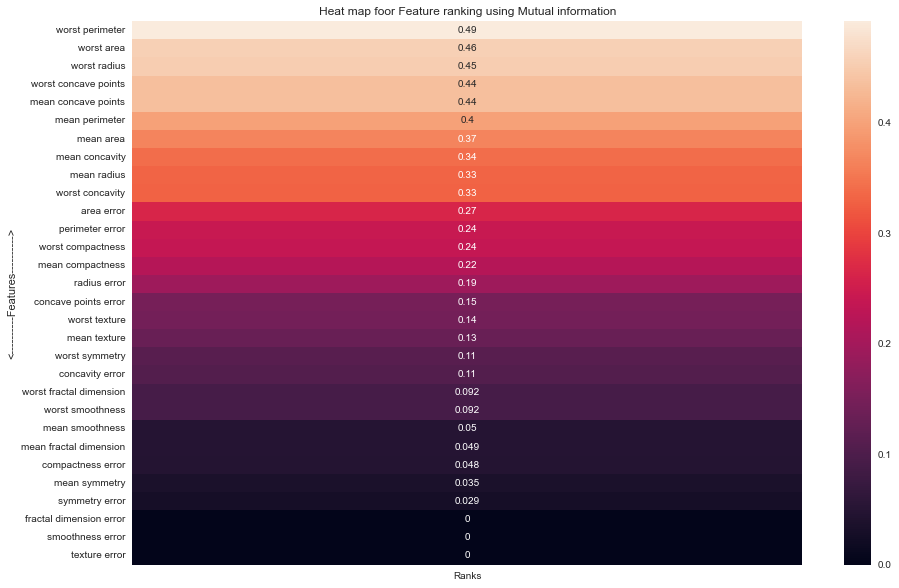

In [24]:
df_feat_rank_mutual = mutualinformation(data, data.iloc[:, 1:].columns, "label")

In [25]:
# combining the all the features importances

df_feature_rank_method = pd.DataFrame()
df_feature_rank_method["Correlation"] = corr_df_label.index[1:]
df_feature_rank_method["Normality"] = sort_rank_df.index
df_feature_rank_method["ROC-AUC"] = roc_rank.index
df_feature_rank_method["MutualInformation"] = df_feat_rank_mutual.index

In [26]:
df_feature_rank_method

,Correlation,Normality,ROC-AUC,MutualInformation
0,worst concave points,worst smoothness,worst radius,worst perimeter
1,worst perimeter,mean smoothness,worst perimeter,worst area
2,worst radius,worst texture,mean perimeter,worst radius
3,mean concave points,worst concave points,mean concave points,worst concave points
4,mean perimeter,mean texture,worst concave points,mean concave points
5,worst area,mean symmetry,worst area,mean perimeter
6,mean radius,mean radius,mean area,mean area
7,mean area,mean perimeter,worst concavity,mean concavity
8,mean concavity,worst perimeter,mean radius,mean radius
9,worst concavity,worst radius,mean concavity,worst concavity


* In order to to find the best feature we will do following steps:
    - Since these features sorted, we will select top 10 in each method
    - Next, we find the frequency of occurence of these features in all method
    - Remove features that are lesser than or equal to one <=1.
    - Left out features are the best.

In [27]:
# step 1: Since these features sorted, we will select top 10 in each method
top_10 = df_feature_rank_method.iloc[:10]

# step 2: Next, we find the frequency of occurence of these features in all method
cls, freq = np.unique(top_10.values.ravel(), return_counts=True)

# step 3: Remove features that are lesser than or equal to one <=1.
bestft=pd.DataFrame()
bestft["Features"] = cls
bestft["Frequency"] = freq 
bestft = bestft[bestft["Frequency"]>1]
bestft = bestft.sort_values(by="Frequency", ascending=False).reset_index(drop=True)
getbest = pd.DataFrame(bestft["Features"].values, columns=["Best Features"])
print(tabulate(getbest, headers=["Best Features"], tablefmt='psql'))

+----+----------------------+
|    | Best Features        |
|----+----------------------|
|  0 | mean perimeter       |
|  1 | mean radius          |
|  2 | worst concave points |
|  3 | worst perimeter      |
|  4 | worst radius         |
|  5 | mean area            |
|  6 | mean concave points  |
|  7 | mean concavity       |
|  8 | worst area           |
|  9 | worst concavity      |
+----+----------------------+


Therefore from the above analysis features, we can see that above are the best features:

Grouping them accordingly according to the ranks from the above output:

**Best mean features (by ranks)**
- mean concave points
- mean concavity 
- Mean Perimeter
- Mean radius
- Mean area


**Best Worst features (by ranks)**

- worst concave points
- worst perimeter
- worst radius
- worst area
- worst concavity

**TOP 3 FEATURES**

* Finding top 3 features from the methods
- Worst Radius
- Worst Perimeter
- Worst concave points

### <font color="purple">Overall top -10 in depth feature analysis</font>

In [28]:
from tabulate import tabulate

In [29]:
def violinsbox(df, feature):
    malig = df[df["label"]=="malignant"]
    benig = df[df["label"]=="benign"]
    fig = make_subplots(rows=1, cols=2)
    fig.add_trace(go.Violin(y=malig[feature].values, name="Malignant - "+feature, box_visible=True,
                           meanline_visible=True,line_color='lightseagreen',
                           showlegend=True),row=1, col=1)
    fig.add_trace(go.Violin(y=benig[feature].values, name="Benign - "+feature, box_visible=True,
                           meanline_visible=True,line_color='mediumpurple',
                           showlegend=True),row=1, col=2)
    fig.update_layout(title="Distribution of "+feature, title_x=0.5, yaxis_title="Frequency")
    fig.show()
    
    plt.figure(figsize=(15,5))
    sns.boxplot(x=feature, data=df, whis=np.inf)
    sns.swarmplot(x=feature, data=df, color=".2", label=feature)
    plt.title("Data distribution of "+feature)
    plt.xlabel(feature)
    plt.ylabel("Count")
    plt.legend()
    plt.show()

In [30]:
def datarange(df, feature):
    
    df_ = pd.DataFrame(index= ["Malignant", "Benign"], columns=["Mean", "Minimum", "Maximum"])
    
    malig = df[df["label"]=="malignant"]
    benig = df[df["label"]=="benign"]
    
    mu_malig = malig[feature].mean() 
    mu_benig = benig[feature].mean() 
    
    min_malig, max_malig = malig[feature].min(), malig[feature].max() 
    min_benig, max_benig = benig[feature].min(), benig[feature].max() 
    
    df_.loc["Malignant"]["Mean"] = mu_malig
    df_.loc["Malignant"]["Minimum"] = min_malig
    df_.loc["Malignant"]["Maximum"] = max_malig
    
    df_.loc["Benign"]["Mean"] = mu_benig
    df_.loc["Benign"]["Minimum"] = min_benig
    df_.loc["Benign"]["Maximum"] = max_benig
    
    print(tabulate(df_, headers='keys', tablefmt='psql'))
    
    return df_

**Mean radius**

+-----------+---------+-----------+-----------+
|           |    Mean |   Minimum |   Maximum |
|-----------+---------+-----------+-----------|
| Malignant | 15.1607 |    13.001 |   19.0901 |
| Benign    | 13.3511 |    11.56  |   15.273  |
+-----------+---------+-----------+-----------+


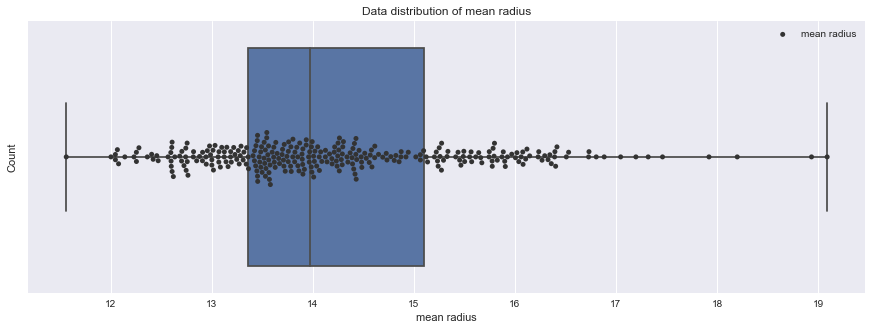

In [31]:
# range of the data per class
df_mrad = datarange(data, "mean radius")

# distribution using violin plot 
violinsbox(data, "mean radius")

* The Radius is one of the statistical property of cancer cell. From the above feature analysis we can observe that, **mean value radius for malignant is higher compared to the mean radius of benign and the values of radius for malignant ranges from 13 to 19.09 whereas, benign it ranges from 11.56 to 15.27. From the analysis we can say that values of radius for malignant is higher compared because of irregular shape while compared to the benign which as defined smooth shape.**

* From the distribution plot we can observe that, **most of the values for malignant is within the 14.28 to 15.90 whereas, for benign the most of the values are in the range of 12.87 to 13.82.**

* However, **we also observe some outliers, that is when the benign has radius above 15 and malignant above 18**. Furthermore, from swarm plot we can see that most of the values of the radius are in the range of 13.5 to 15.3.

* However, from the previous observation we know that the **mean radius is one of the important feature and it has correlation of 75.5% with the target, whereas the distribution of malignant and benign has the normality statistics of 0.95. Furthermore, we found that using mean radius has good information content score of 0.33. Hence this shows that mean radius is a good and important feature for analysing the maligant and benign in the cancer cells**

**Mean perimeter**

+-----------+---------+-----------+-----------+
|           |    Mean |   Minimum |   Maximum |
|-----------+---------+-----------+-----------|
| Malignant | 99.2519 |   84.8977 |  126.168  |
| Benign    | 86.5424 |   74.6909 |   99.0565 |
+-----------+---------+-----------+-----------+


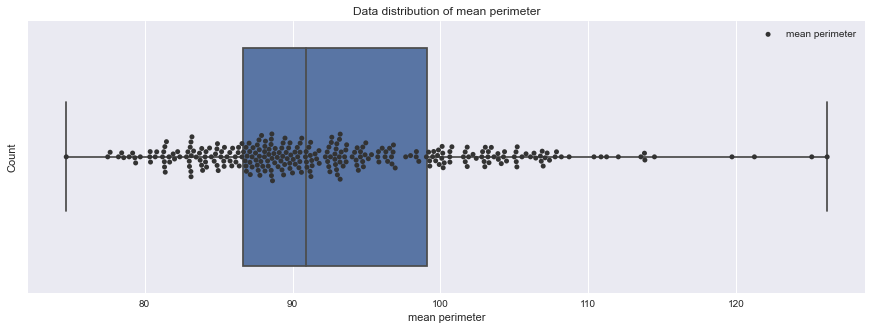

In [32]:
# range of the data per class
df_mper = datarange(data, "mean perimeter")

# distribution using violin plot 
violinsbox(data, "mean perimeter")

* The perimeter is one of the statistical property of the cancer cells. From the above feature analysis we can observe that, **mean value perimeter for malignant is higher compared to the mean perimeter of benign and the values of perimeter for malignant ranges from 84.89 to 126.16 whereas, benign it ranges from 74.69 to 99.05. From the analysis we can say that values of perimeter for malignant is higehr because of irregular shape while compared to the benign which as defined shape.**

* From the distribution plot we can observe that, **most of the values for malignant is within the 93.16 to 104.12 whereas, for benign the most of the values are in the range of 83.19 to 89.39.**

* However, **we also observe some outliers, that is when the benign has radius above 95 and malignant above 120**. Furthermore, from swarm plot we can see that most of the values of the radius are in the range of 85 to 100.

* However, from the previous observation we know that the **mean perimeter is one of the important feature and it has correlation of 71% with the target, whereas the distribution of malignant and benign has the normality statistics of 0.94. Furthermore, we found that using mean perimeter has good information content score of 0.39. Hence this shows that mean perimeter is a good and important feature for analysing the maligant and benign in the cancer cells**

**Mean area**

+-----------+---------+-----------+-----------+
|           |    Mean |   Minimum |   Maximum |
|-----------+---------+-----------+-----------|
| Malignant | 752.639 |   541.281 |   1300.79 |
| Benign    | 580.682 |   477.372 |    756.66 |
+-----------+---------+-----------+-----------+


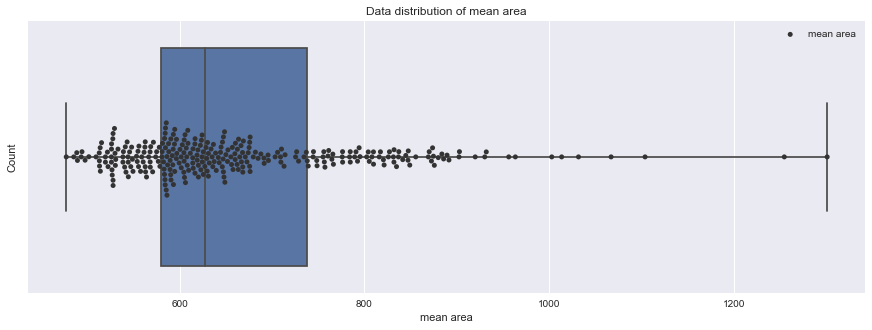

In [33]:
# range of the data per class
df_mar = datarange(data, "mean area")

# distribution using violin plot 
violinsbox(data, "mean area")

* The area is one of the statistical property of the cancer cells. From the above feature analysis we can observe that, **mean value area for malignant is higher compared to the mean area of benign and the values of area for malignant ranges from 541.28 to 1300.79 whereas, benign it ranges from 477.37 to 756.66. From the analysis we can say that values of area for malignant is higher because of irregular shape while compared to the benign which as defined shape.**

* From the distribution plot we can observe that, **most of the values for malignant is within the 655.95 to 831.37 whereas, for benign the most of the values are in the range of 542.01 to 614.56.**

* However, **we also observe some outliers, that is when the benign has area above 700 and malignant above 1200**. Furthermore, from swarm plot we can see that most of the values of the area are in the range of 550 to 780.

* However, from the previous observation we know that the **mean area is one of the important feature and it has correlation of 64% with the target, whereas the distribution of malignant and benign has the normality statistics of 0.88. Furthermore, we found that using mean area has good information content score of 0.365. Hence this shows that mean area is a good and important feature for analysing the maligant and benign in the cancer cells**

**Mean concavity**

+-----------+-----------+-----------+-----------+
|           |      Mean |   Minimum |   Maximum |
|-----------+-----------+-----------+-----------|
| Malignant | 0.111971  | 0.063747  |  0.212704 |
| Benign    | 0.0742185 | 0.0507708 |  0.201971 |
+-----------+-----------+-----------+-----------+


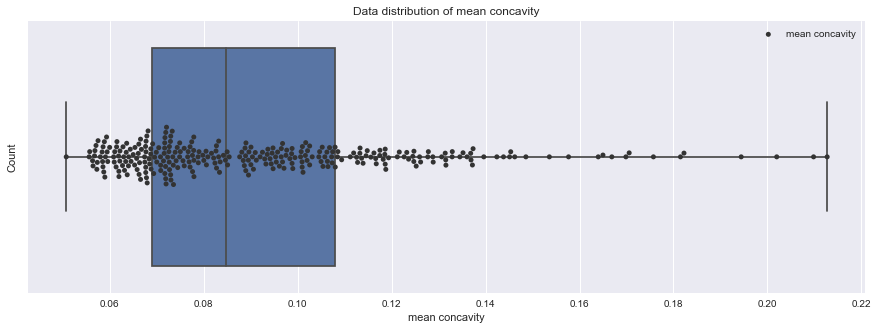

In [34]:
# range of the data per class
df_mar = datarange(data, "mean concavity")

# distribution using violin plot 
violinsbox(data, "mean concavity")

* The concavity is one of the statistical property of the cancer cells. From the above feature analysis we can observe that, **mean value concavity for malignant is higher compared to the mean concavity of benign and the values of concavity  for malignant ranges from 0.06 to 0.21 whereas, benign it ranges from 0.05 to 0.20. From the analysis we can say that values of concavity  for malignant is higehr because of irregular shape while compared to the benign which as defined shape.**

* From the distribution plot we can observe that, **most of the values for malignant is within the 0.09 to 0.12 whereas, for benign the most of the values are in the range of 0.06 to 0.07.**

* However, **we also observe some outliers, that is when the benign has concavity above 0.1 and malignant above 0.17**. Furthermore, from swarm plot we can see that most of the values of the concavity are in the range of 0.07 to 0.11.

* However, from the previous observation we know that the **mean concavity is one of the important feature and it has correlation of 62% with the target, whereas the distribution of malignant and benign has the normality statistics of 0.89. Furthermore, we found that using mean perimeter has good information content score of 0.34. Hence this shows that mean concavity is a good and important feature for analysing the maligant and benign in the cancer cells**

**Mean concave points**

+-----------+-----------+-----------+-----------+
|           |      Mean |   Minimum |   Maximum |
|-----------+-----------+-----------+-----------|
| Malignant | 0.0615585 | 0.0396802 | 0.105212  |
| Benign    | 0.0406384 | 0.0287013 | 0.0644974 |
+-----------+-----------+-----------+-----------+


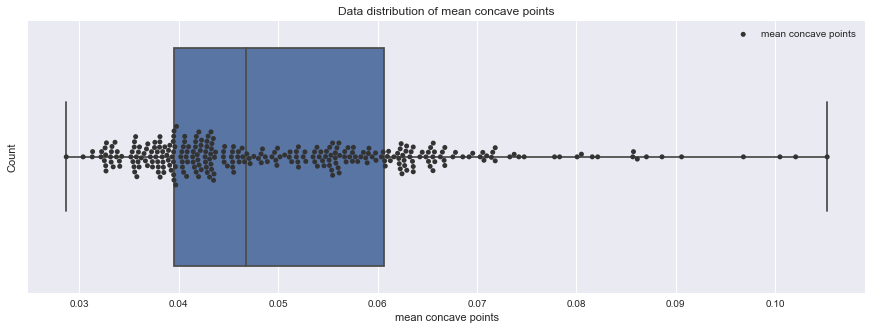

In [35]:
# range of the data per class
df_mar = datarange(data, "mean concave points")

# distribution using violin plot 
violinsbox(data, "mean concave points")

* The concave point is one of the statistical property of the cancer cells. From the above feature analysis we can observe that, **mean value concave points for malignant is higher compared to the mean concave points of benign and the values of concave points  for malignant ranges from 0.03 to 0.1 whereas, benign it ranges from 0.02 to 0.06. From the analysis we can say that values of concave points  for malignant is higehr because of irregular shape while compared to the benign which as defined shape.**

* From the distribution plot we can observe that, **most of the values for malignant is within the 0.05 to 0.06 whereas, for benign the most of the values are in the range of 0.03 to 0.04.**

* However, **we also observe some outliers, that is when the benign has concave points above 0.05 and malignant above 0.08**. Furthermore, from swarm plot we can see that most of the values of the concave points are in the range of 0.04 to 0.06.

* However, from the previous observation we know that the **mean concave points is one of the important feature and it has correlation of 72% with the target, whereas the distribution of malignant and benign has the normality statistics of 0.92. Furthermore, we found that using mean concave point has good information content score of 0.43. Hence this shows that mean concave points is a good and important feature for analysing the maligant and benign in the cancer cells**

**Worst radius**

+-----------+---------+-----------+-----------+
|           |    Mean |   Minimum |   Maximum |
|-----------+---------+-----------+-----------|
| Malignant | 17.8539 |   14.9916 |   22.6762 |
| Benign    | 15.1396 |   13.2793 |   17.2181 |
+-----------+---------+-----------+-----------+


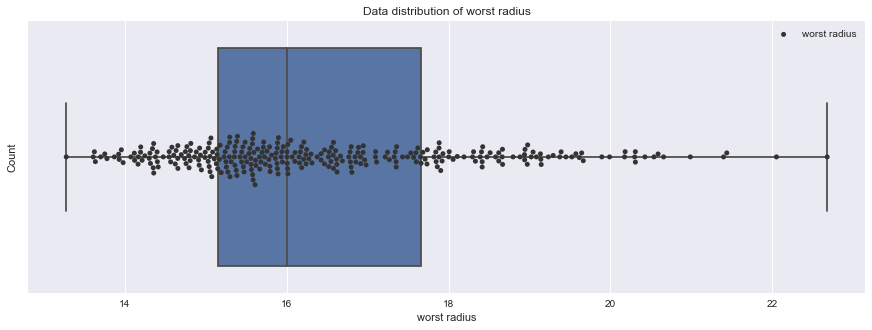

In [36]:
# range of the data per class
df_mar = datarange(data, "worst radius")

# distribution using violin plot 
violinsbox(data, "worst radius")

* The worst radius is one of the statistical property of the cancer cells. From the above feature analysis we can observe that, **worst radius for malignant is higher compared to the worst radius of benign and the values of worst radius  for malignant ranges from 14.99 to 22.67 whereas, benign it ranges from 13.27 to 17.21. From the analysis we can say that values of worst radius  for malignant is higehr because of irregular shape while compared to the benign which as defined shape.**

* From the distribution plot we can observe that, **most of the values for malignant is within the 16.6 to 18.93 whereas, for benign the most of the values are in the range of 14.52 to 15.52.**

* However, **we also observe some outliers, that is when the benign has worst radius above 17 and malignant above 22**. Furthermore, from swarm plot we can see that most of the values of the worst radius are in the range of 15 to 17.5.

* However, from the previous observation we know that the **worst radius is one of the important feature and it has correlation of 75% with the target, whereas the distribution of malignant and benign has the normality statistics of 0.94. Furthermore, we found that using worst radius has good information content score of 0.45. Hence this shows that worst radius is a good and important feature for analysing the maligant and benign in the cancer cells**

**Worst perimeter**

+-----------+----------+-----------+-----------+
|           |     Mean |   Minimum |   Maximum |
|-----------+----------+-----------+-----------|
| Malignant | 118.356  |   97.9331 |   150.353 |
| Benign    |  99.2804 |   87.1102 |   113.673 |
+-----------+----------+-----------+-----------+


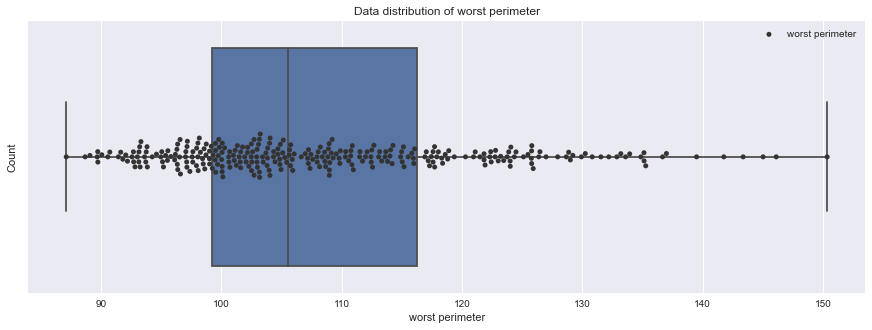

In [37]:
# range of the data per class
df_mar = datarange(data, "worst perimeter")

# distribution using violin plot 
violinsbox(data, "worst perimeter")

* The worst perimeter is one of the statistical property of the cancer cells. From the above feature analysis we can observe that, **worst perimeter for malignant is higher compared to the worst perimeter of benign and the values of worst perimeter  for malignant ranges from 97.9 to 150.3 whereas, benign it ranges from 87.11 to 113.6. From the analysis we can say that values of worst perimeter  for malignant is higehr because of irregular shape while compared to the benign which as defined shape.**

* From the distribution plot we can observe that, **most of the values for malignant is within the 110 to 124 whereas, for benign the most of the values are in the range of 95 to 102.**

* However, **we also observe some outliers, that is when the benign has worst perimeter above 110 and malignant above 140**. Furthermore, from swarm plot we can see that most of the values of the worst perimeter are in the range of 100 to 117.

* However, from the previous observation we know that the **worst perimeter is one of the important feature and it has correlation of 71% with the target, whereas the distribution of malignant and benign has the normality statistics of 0.94. Furthermore, we found that using worst perimeter has good information content score of 0.39. Hence this shows that worst perimeter is a good and important feature for analysing the maligant and benign in the cancer cells**

**Worst area**

+-----------+---------+-----------+-----------+
|           |    Mean |   Minimum |   Maximum |
|-----------+---------+-----------+-----------|
| Malignant | 1052.47 |   726.695 |  1796.82  |
| Benign    |  756.71 |   633.772 |   972.111 |
+-----------+---------+-----------+-----------+


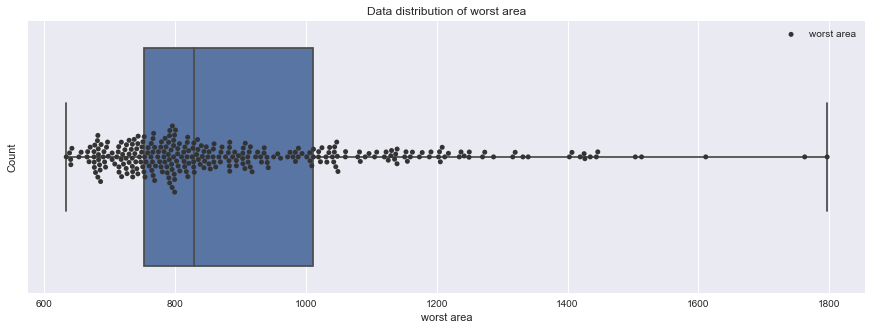

In [38]:
# range of the data per class
df_mar = datarange(data, "worst area")

# distribution using violin plot 
violinsbox(data, "worst area")

* The worst area is one of the statistical property of the cancer cells. From the above feature analysis we can observe that, **worst area for malignant is higher compared to the worst area of benign and the values of worst area  for malignant ranges from 726 to 1796 whereas, benign it ranges from 633 to 972. From the analysis we can say that values of worst area  for malignant is higehr because of irregular shape while compared to the benign which as defined shape.**

* From the distribution plot we can observe that, **most of the values for malignant is within the 903 to 1159 whereas, for benign the most of the values are in the range of 713 to 893.

* However, **we also observe some outliers, that is when the benign has worst area above 900 and malignant above 1400**. Furthermore, from swarm plot we can see that most of the values of the worst area are in the range of 750 to 1000.

* However, from the previous observation we know that the **worst area is one of the important feature and it has correlation of 70% with the target, whereas the distribution of malignant and benign has the normality statistics of 0.87. Furthermore, we found that using worst area has good information content score of 0.45. Hence this shows that worst area is a good and important feature for analysing the maligant and benign in the cancer cells**

**Worst concave points**

+-----------+-----------+-----------+-----------+
|           |      Mean |   Minimum |   Maximum |
|-----------+-----------+-----------+-----------|
| Malignant | 0.137746  | 0.0817706 |  0.179794 |
| Benign    | 0.0995649 | 0.0669266 |  0.134551 |
+-----------+-----------+-----------+-----------+


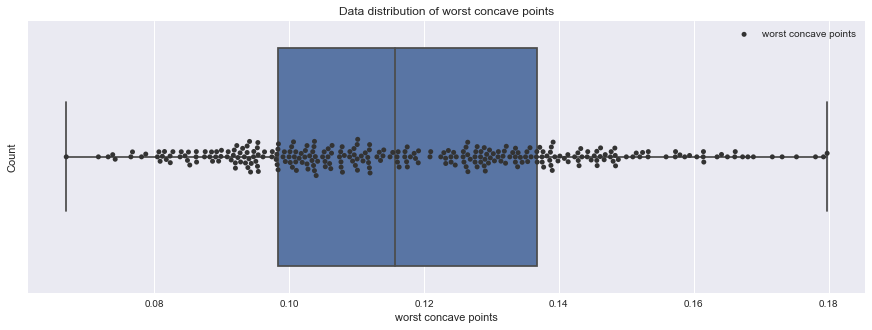

In [39]:
# range of the data per class
df_mar = datarange(data, "worst concave points")

# distribution using violin plot 
violinsbox(data, "worst concave points")

* The worst concave points is one of the statistical property of the cancer cells. From the above feature analysis we can observe that, **worst concave points for malignant is higher compared to the worst concave points of benign and the values of worst concave points  for malignant ranges from 0.08 to 0.17 whereas, benign it ranges from 0.06 to 0.13. From the analysis we can say that values of worst concave points  for malignant is higehr because of irregular shape while compared to the benign which as defined shape.**

* From the distribution plot we can observe that, **most of the values for malignant is within the 0.12 to 0.14 whereas, for benign the most of the values are in the range of0.09 to 0.107

* However, **we also observe some outliers, that is when the benign has worst concave points above 0.13 and malignant above 0.18**. Furthermore, from swarm plot we can see that most of the values of the worst concave points are in the range of 0.1 to 0.137.

* However, from the previous observation we know that the **worst concave points is one of the important feature and it has correlation of 77% with the target, whereas the distribution of malignant and benign has the normality statistics of 0.97. Furthermore, we found that using worst concave points has good information content score of 0.43. Hence this shows that worst concave points is a good and important feature for analysing the maligant and benign in the cancer cells**

**Worst concavity**

+-----------+----------+-----------+-----------+
|           |     Mean |   Minimum |   Maximum |
|-----------+----------+-----------+-----------|
| Malignant | 0.333031 |  0.17637  |  0.569733 |
| Benign    | 0.233767 |  0.152272 |  0.635074 |
+-----------+----------+-----------+-----------+


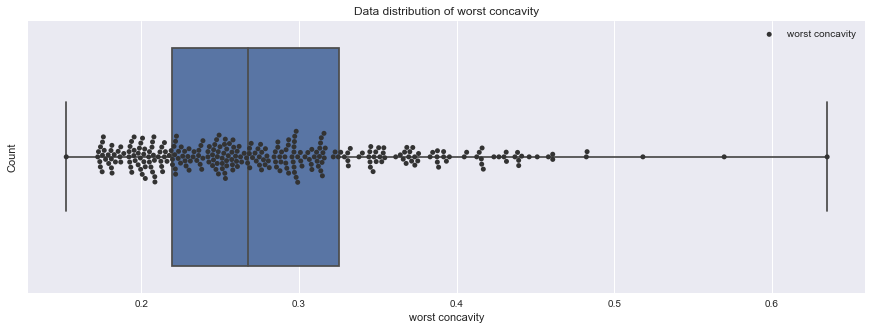

In [40]:
# range of the data per class
df_mar = datarange(data, "worst concavity")

# distribution using violin plot 
violinsbox(data, "worst concavity")

* The worst concavity is one of the statistical property of the cancer cells. From the above feature analysis we can observe that, **worst concavity for malignant is higher compared to the worst concavity of benign and the values of worst concavity  for malignant ranges from 0.17 to 0.56 whereas, benign it ranges from 0.15 to 0.63. From the analysis we can say that values of worst concavity  for malignant is higehr because of irregular shape while compared to the benign which as defined shape.**

* From the distribution plot we can observe that, **most of the values for malignant is within the 0.28 to 0.37 whereas, for benign the most of the values are in the range of 0.19 to 0.25.

* However, **we also observe some outliers, that is when the benign has worst concavity above 0.3 and malignant above 0.5**. Furthermore, from swarm plot we can see that most of the values of the worst concavity are in the range of 0.22 to 0.32.

* However, from the previous observation we know that the **worst concavity is one of the important feature and it has correlation of 62% with the target, whereas the distribution of malignant and benign has the normality statistics of 0.93. Furthermore, we found that using worst concavity has good information content score of 0.33. Hence this shows that worst concavity is a good and important feature for analysing the maligant and benign in the cancer cells**

**Encoding the target data**

* In scikit-learn for binary classification, the positive class is denoted by 1 and negative class as 0
* Since, our requirement is to consider Malignant as positive, we will consider Malignant as 1 and benign as 0

In [41]:
# positive ->1 ->malignant and benign -> 0 ->negative
df = data.copy()
df["label"] = np.where(df["label"]=="malignant", 1, 0)

In [42]:
X = df.iloc[:, 1:].values
y = df.iloc[:, 0].values

### <font color="purple">1.4 Splitting the dataset [0.5 marks]</font>

<font color="purple">Split the dataset into appropriate subsets. You must choose what the subsets are and how big they are. However, we want to make sure the proportion of the two classes is consistent across all datasets, so use the _stratify_ option, as used in workshops 5 and 6. Verify the size and label distribution in each dataset.</font>

**<font color="green">we will divide the data into 80% train and 20% test data, with stratify</font>**

Steps to solve:

* We use the X and Y value data and divid the data using train test split method with startify option to make the class propotion similar.

* we are dividing the data into 80% train data and 20% test data

In [48]:
from sklearn.model_selection import train_test_split

In [49]:
# we will divid the data into 80% train and 20% test data, with strify
train_ratio =0.8
test_ratio = 0.2 
xtrain, xtest, ytrain, ytest = train_test_split(X, y, test_size=test_ratio, shuffle=True, random_state=56, stratify=y)

**<font color="green">Class distributuion in train and test data</font>**

-----------------------------------------------------------------------------------------------
======================Total class labels for train===================
Total class 1 (Malignant) are:   117
Total class 0 (Benign) are:   123
-----------------------------------------------------------------------------------------------

-----------------------------------------------------------------------------------------------
======================Total class labels for test===================
Total class 1 (Malignant) are:   29
Total class 0 (Benign) are:   31
-----------------------------------------------------------------------------------------------


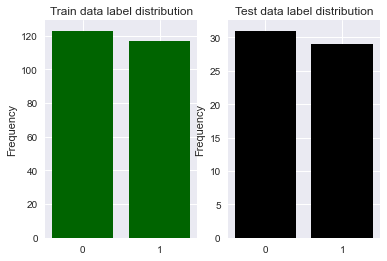

In [50]:
traincls, trainfreq = np.unique(ytrain, return_counts=True)
testcls, testfreq = np.unique(ytest, return_counts=True)
print("-----------------------------------------------------------------------------------------------")
print("======================Total class labels for train===================")
print("Total class 1 (Malignant) are:  ", trainfreq[1])
print("Total class 0 (Benign) are:  ", trainfreq[0])
print("-----------------------------------------------------------------------------------------------")
print()
print("-----------------------------------------------------------------------------------------------")
print("======================Total class labels for test===================")
print("Total class 1 (Malignant) are:  ", testfreq[1])
print("Total class 0 (Benign) are:  ", testfreq[0])
print("-----------------------------------------------------------------------------------------------")
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.bar(x=[str(x) for x in traincls], height=trainfreq, label="Train", color="darkgreen")
ax2.bar(x=[str(x) for x in testcls], height=testfreq, label="Test", color="black")
ax1.set_title("Train data label distribution")
ax2.set_title("Test data label distribution")
ax1.set_ylabel("Frequency")
ax2.set_ylabel("Frequency")
plt.show()

## <font color="purple">2. Build, Train and Optimise Classifiers</font>

### <font color="purple">2.1 Pipeline [0.5 marks]</font>
<font color="purple">**Build a pre-processing pipeline** that includes imputation (as even though we don't strictly need it here it is a good habit to always include it) and other appropriate pre-processing.</font>

In [51]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler 
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer 

In [52]:
# creating the pipeline for pre-processing 
# the pipeline contains following methods, impuatation, scaling

preprocess_pipeline = Pipeline(steps=[('simpleimputer', SimpleImputer(strategy="median")), ('knnimputer', KNNImputer()),
                               ('standardscaler', StandardScaler()), ('minmaxscaler', MinMaxScaler()),
                               ('robustscaler', RobustScaler())])

In [54]:
print(preprocess_pipeline)

Pipeline(steps=[('simpleimputer', SimpleImputer(strategy='median')),
                ('knnimputer', KNNImputer()),
                ('standardscaler', StandardScaler()),
                ('minmaxscaler', MinMaxScaler()),
                ('robustscaler', RobustScaler())])


Here, we have create the pipelines for preprocessing the data. We have used Imputationa and scaling methods.

*  Impuatation we have following method:
    * Simple Imputer
    * KNN impuatation
    
* In scaling method we have following method:
    * Standard scaler
    * Robust scaler
    * Minmax scaler

### EVALAUATION METRIC

In [55]:
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

### <font color="purple">2.2 Baseline measurements</font>

<font color="purple">For our classification task we will consider **three simple baseline cases**:</font>

1) predicting all samples to be negative (class 1)
2) predicting all samples to be positive (class 2)
3) making a random prediction for each sample with equal probability for each class

**<font color="green">For each case measure and display the following metrics:</font>**
 - balanced accuracy
 - recall
 - precision
 - auc
 - f1score
 - fbeta_score with beta=0.1
 - fbeta_score with beta=10

Code is given below for the latter metrics (all metrics are discussed in lecture 4 and many are in workshop 4).

Also **calculate and display the confusion matrix** for each baseline case, using a heatmap and numbers (as in workshop 4). 

**<font color="purple">BEFORE, SELECTING THE PERFORMANCE METRICS THROUGH BASELINE MODEL IT IS IMPORTANT TO UNDERSTAND WHY DO WE NEED PERFORMANCE METRICS, WHY NOT USE ACCURACY AND ACCEPT ANY MODEL THAT HAS 100% OR 100% POSITIVE PREDICTION USING RECALL SCORE</font>**



**Understanding the evalaution metric**

* In classification, the classification metric has following four important component
    - True Positive
    - False Positive
    - True Negative
    - False Negative
    
Consider a scenario, a patient is reporting the doctor for cancer diagnosis. The doctors diagnosis will have following results:

- True Positive: True positive is when the patient has cancer and the doctor reports it as positive. 
- False Positive: False Positive is when the patient does not have cancer, but the doctor reports it as positive.
- True Negative: True negative is when the patient does not have cancer and doctor reports it as negative.
- False Negative: False negative is when the patient has cancer, but the doctor reports it as negative. 

The correct prediction is when True positive and True negative. Whereas, False negative will lead the patient thinking they do not have cancer but they do have cancer which will cause serious health issue because false diagnosis. Whereas, False positive will make the patient to undergo false medication.


Accuracy: It is the ratio of total Correct predictions
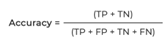

Recall: It is the ratio of Total correct positive predictions over all the positive cases
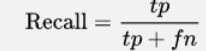

Precision: It is the ratio of Correct positive prediction from all the positive predcitions
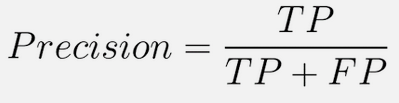

**Facts on Accuracy metric**

**Case 1: Consider a case, there are 130 data, and out of 130, 65 data is non-cancerous and 65 data is cancerous. Therefore we can see that there is a balance in the data.**

During the analysis, if we predict all the non-cancerous data then we end up having 50% accuracy, because all the cancerious predictions are wrong.

**Case 2: Consider a case, there are 130 data, and out of 130, 110 data is non-cancerous and 20 data is cancerous. Therefore we cans ee that there is a imbalance in the data.**

During the analysis, if we predeict all the non cancerous data then we end up having 84.16% accuracy in prediction, even though we failed in predicting the cancerous data, we ended up having really good accuracy. Which is very bad.

**Therefore, it is important to know that if we are using Accuracy metric, then we should use the balanced data for correct analysis during the modelling.**

***

**Facts on Recall and Precision tradeoff**

Here Recall is the ratio of total correct positive prediction over all the positive cases. The value of recall increases, when the model predicts many positive cases. Whereas, precision focuses only one the precise correct positive predictions over all the positive prediction.

Here we use threshold value to seperate the probablity of positive class into malignant and benign class. That is, when the probablity is greater than or equal to threshold we say it is malignant otherwise, benign.

As the value of threshold decreases, we are telling the model probablity that it belongs to posiitve class, hence it tries to predict many positive cases, which in turn increases the recall of the model, however, when the threshold value increases, we are trying to predict more of correct positive prediction and hence recall decreases.

Similarly, when the value of threshold decreseas, total of false positive rate increases, whereas, when the threshold value increases, total false positive rate decreseas and sometimes the false negative increases. 

The optimal value is when there is divergence. 

Below I have shown the results of above explanation using the experiment on various threshold values.

**Experiment on recall and precision**

- requirement: Predict the Malignant (positive case)
- model: Logistic regression
- Threshold values are list of values

In [57]:
from sklearn.linear_model import LogisticRegression

**Experiment on recall and precision**

Optimal recall and precision is at threshold 0.3 and recall score is 93.0% and precision 93.0%



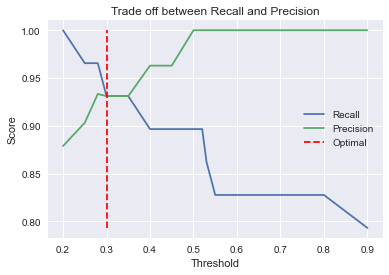

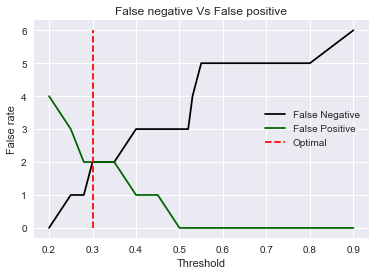

In [58]:
# experiemnt on recall and threshold tradeoff 

clf_logreg = LogisticRegression(solver='liblinear').fit(xtrain, ytrain)
pred_prob = clf_logreg.predict_proba(xtest)
# select the positive probablity
pred_pos_prob = pred_prob[:, 1]
# greater than the threshold >= we say maliganant else not malignant
threshold_ = [0.2, 0.25, 0.28, 0.3, 0.32, 0.33, 0.35, 0.4, 0.42, 0.43, 0.45, 0.5, 0.52, 0.53, 0.55, 0.6, 0.7, 0.8, 0.9]
recall_score_list = []
precision_score_list = []
optimal_recprec = []
optimal_rec, optim_prec = [], []
fps, fns = [], []
for t in threshold_:
    threshold_pred = np.where(pred_pos_prob>=t, 1, 0)
    recall_score_list.append(recall_score(ytest, threshold_pred))
    precision_score_list.append(precision_score(ytest, threshold_pred))
    tn, fp, fn, tp = confusion_matrix(ytest, threshold_pred).ravel()
    fns.append(fn)
    fps.append(fp)
    if recall_score(ytest, threshold_pred)==precision_score(ytest, threshold_pred):
        optimal_recprec.append(t)
        optimal_rec.append(recall_score(ytest, threshold_pred))
        optim_prec.append(precision_score(ytest, threshold_pred))

# optimal
print("Optimal recall and precision is at threshold {} and recall score is {}% and precision {}%".format(optimal_recprec[0],
                                                                                                       round(optimal_rec[0],2)*100,
                                                                                                       round(optim_prec[0],2)*100))
print()
# plotting and report
plt.plot(threshold_, recall_score_list, label="Recall")
plt.plot(threshold_, precision_score_list, label="Precision")
plt.vlines(x=optimal_recprec[0], ymin=min(recall_score_list+precision_score_list), 
           ymax=1.0, colors="red", label="Optimal", linestyle="dashed")
plt.title("Trade off between Recall and Precision")
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.legend(loc='center right')
plt.show()

plt.plot(threshold_, fns, label="False Negative", color="black")
plt.plot(threshold_, fps, label="False Positive", color="darkgreen")
plt.vlines(x=optimal_recprec[0], ymin=min(fps+fns), 
           ymax=max(fps+fns), colors="red", label="Optimal", linestyle="dashed")
plt.title("False negative Vs False positive")
plt.xlabel("Threshold")
plt.ylabel("False rate")
plt.legend(loc="center right")
plt.show()

**Here we can see that, when the threshold is 0.3 we have same recall and precision which means that we have precited all the positive classes precisely at the rate 93%**

**<font color="purple">Overall observation</font>**

* Use the accuracy metrics, when the data is balanced or mild -imbalance
* Choose the optimal threshold value for classifying the positive class probablity in order to get the beter performance when recall and precision is almost similar.

**<font color="purple">Baseline models</font>**

In [59]:
from sklearn.metrics import top_k_accuracy_score
from sklearn.metrics import average_precision_score

In [60]:
# function for reporting all the metrics

def getallmetric(ytrue, ypred):
    # performance metrics
    a = accuracy_score(ytrue, ypred)*100
    ba = balanced_accuracy_score(ytrue, ypred)*100
    rs = recall_score(ytrue, ypred)*100
    ps = precision_score(ytrue, ypred, zero_division=0)*100
    auc_ = roc_auc_score(ytrue, ypred)*100
    f1s = f1_score(ytrue, ypred)*100
    fbeta_10 = f10_score(ytrue, ypred)*100
    fbeta_01 = f01_score(ytrue, ypred)*100
    f1_micros_ = f1_score(ytrue, ypred, average="micro")*100
    f1_macro_ = f1_score(ytrue, ypred, average="macro")*100 
    # dataframe for performance metrics
    df_metric = pd.DataFrame(data=[a, ba, rs, ps, auc_, f1s, 
                                  fbeta_10, fbeta_01,f1_micros_,
                                  f1_macro_], index=["Accuracy score", "Balanced Accuracy", "Recall", "Precision",
                                                              "AUC", "F1 score", "F-beta score - 10", 
                                                              "F-beta score -01",
                                                             "F1 micro", "F1 macro"], columns=["Score"])
    # heatmap for confusion matrix
    sns.heatmap(confusion_matrix(ytrue, ypred), annot=True,cmap="YlGnBu")
    plt.title("Confusion matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show() 
    
    # heatmap for confusion matrix - normalised
    sns.heatmap(confusion_matrix(ytrue, ypred, normalize='true'), annot=True,cmap="BuPu")
    plt.title("Normalised Confusion matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()
    return df_metric, a, ba, rs, ps, auc_, f1s, fbeta_10, fbeta_01, f1_micros_, f1_macro_

In [61]:
from sklearn.metrics import fbeta_score, make_scorer

f10_scorer = make_scorer(fbeta_score, beta=10)
f01_scorer = make_scorer(fbeta_score, beta=0.1)

def f10_score(yt,yp):
    return fbeta_score(yt, yp, beta=10)

def f01_score(yt,yp):
    return fbeta_score(yt, yp, beta=0.1)

### <font color="purple">Case 1: predicting all samples to be negative (class 1) ->Benign values is 0</font>


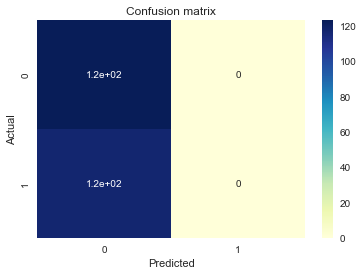

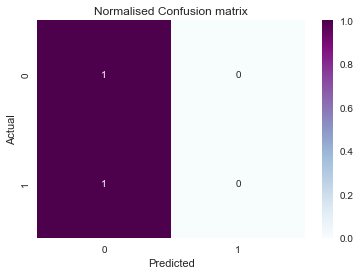

Accuracy score for predicting the all negative class is: 51.24999999999999%
Balanced  Accuracy score for predicting the all negative class is: 50.0%
Recall score for predicting the all negative class is: 0.0%
precision score for predicting the all negative class is: 0.0%
AUC score for predicting the all negative class is: 50.0%
F1 score for predicting the all negative class is: 0.0%
F-beta score for predicting all negative class with beta = 10 is: 0.0%
F-beta score for predicting all negative class with beta = 0.1 is: 0.0%
F1 micro score for predicting the all negative class is: 51.24999999999999%
F1 macro score for predicting the all negative class is: 33.88429752066116%


,Score
Accuracy score,51.250000
Balanced Accuracy,50.000000
Recall,0.000000
Precision,0.000000
AUC,50.000000
F1 score,0.000000
F-beta score - 10,0.000000
F-beta score -01,0.000000
F1 micro,51.250000
F1 macro,33.884298


In [62]:
yall_neg = [0]*len(ytrain)
df_allneg_metric, a, ba, rs, ps, auc_, f1s, fbeta_10, fbeta_01, f1micro, f1macro = getallmetric(ytrain, yall_neg)
print("Accuracy score for predicting the all negative class is: {}%".format(a))
print("Balanced  Accuracy score for predicting the all negative class is: {}%".format(ba))
print("Recall score for predicting the all negative class is: {}%".format(rs))
print("precision score for predicting the all negative class is: {}%".format(ps))
print("AUC score for predicting the all negative class is: {}%".format(auc_))
print("F1 score for predicting the all negative class is: {}%".format(f1s))
print("F-beta score for predicting all negative class with beta = 10 is: {}%".format(fbeta_10))
print("F-beta score for predicting all negative class with beta = 0.1 is: {}%".format(fbeta_01))
print("F1 micro score for predicting the all negative class is: {}%".format(f1micro))
print("F1 macro score for predicting the all negative class is: {}%".format(f1macro))
df_allneg_metric

**<font color="purple">Observation</font>**
* We can see that when all the negative classes are predicted the accuracy score is 51.24%. Here accuracy is not exact 50% is because, total benign classes are little higher than the maligant. Hence there is little chnage in values.

* The value of recall and precision is 0, because we know that these metrics predicts used for positive class since there is no positive class, we have 0% score for these metrics. Because if this reason, recall and precision is not a good metric for overall performance of the model.

* F1 score is harmonic mean of recall and precision, since recall is 0% we have F1 score as 0%.

* But we can see that metrics like AUC, Balanced score are good in measuring proper metric when there is one type of class is wrong. Even the data is mild imbalanced, we have good 50% metric, instead of accuracy score which is 51.25%. Hence, when there is imbalance, it is good to use metrics like AUC, Balanced accuracy which mitigates the issues of biasness.

### <font color="purple">Case 2: predicting all samples to be positive (class 2) ->Malignant values is 1</font>

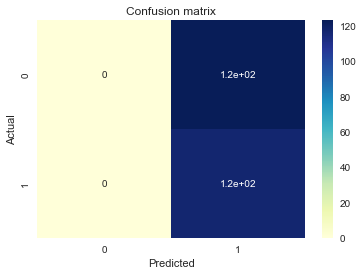

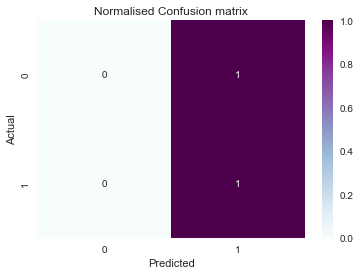

Accuracy score for predicting the all positive class is: 48.75%
Balanced  Accuracy score for predicting the all positive class is: 50.0%
Recall score for predicting the all positive class is: 100.0%
precision score for predicting the all positive class is: 48.75%
AUC score for predicting the all positive class is: 50.0%
F1 score for predicting the all positive class is: 65.54621848739495%
F-beta score for predictingh all positive class with beta = 10 is: 98.96984924623115%
F-beta score for predictingh all positive class with beta = 0.1 is: 48.998631670605796%
F1 macro score for predicting the all positive class is: 48.75%
F1 macro score for predicting the all positive class is: 32.773109243697476%


,Score
Accuracy score,48.750000
Balanced Accuracy,50.000000
Recall,100.000000
Precision,48.750000
AUC,50.000000
F1 score,65.546218
F-beta score - 10,98.969849
F-beta score -01,48.998632
F1 micro,48.750000
F1 macro,32.773109


In [63]:
yall_pos = [1]*len(ytrain)
df_allpos_metric, a, ba, rs, ps, auc_, f1s, fbeta_10, fbeta_01, f1micro, f1macro = getallmetric(ytrain, yall_pos)
print("Accuracy score for predicting the all positive class is: {}%".format(a))
print("Balanced  Accuracy score for predicting the all positive class is: {}%".format(ba))
print("Recall score for predicting the all positive class is: {}%".format(rs))
print("precision score for predicting the all positive class is: {}%".format(ps))
print("AUC score for predicting the all positive class is: {}%".format(auc_))
print("F1 score for predicting the all positive class is: {}%".format(f1s))
print("F-beta score for predictingh all positive class with beta = 10 is: {}%".format(fbeta_10))
print("F-beta score for predictingh all positive class with beta = 0.1 is: {}%".format(fbeta_01))
print("F1 macro score for predicting the all positive class is: {}%".format(f1micro))
print("F1 macro score for predicting the all positive class is: {}%".format(f1macro))

df_allpos_metric

**<font color="purple">Observation</font>**

* We can see that when all the positive classes are predicted the accuracy score is 48.75%. Here accuracy is not exact 50% is because, total benign classes are little higher than the maligant. Hence there is little chnage in values.

* The value of recall is 100%, because we know that recall metrics used for positive class since there is all positive class predicted, we have 100% score for these metrics. Because of this reason, recall and is not a good metric for overall performance of the model since it's ignores negative class.

* The value of precision is 48.75% because we know that, all the positive predictions are not correct and precision requires correct positive prediction, hence the precision is not 100%.

* But we can see that metrics like AUC, Balanced score are good in measuring proper metric when there is one type of class is wrong. Even the data is mild imbalanced, we have good 50% metric, instead of accuracy score which is 48.75%. Hence, when there is imbalance, it is good to use metrics like AUC, Balanced accuracy which mitigates the issues of biasness.

###  <font color="purple">Case 3: random prediction for each sample with equal probability for each class</font>

* To get the uniform equal random predictions we are using the SKLEARN's DummyClassifier with strategy as uniform. which distributes equal distribution of malignant and benign classes as prediction.

* For pure random equal distribution, we have accuracy score, AUC as 50% [Page no. 100, Geron's book][reference book for subject]
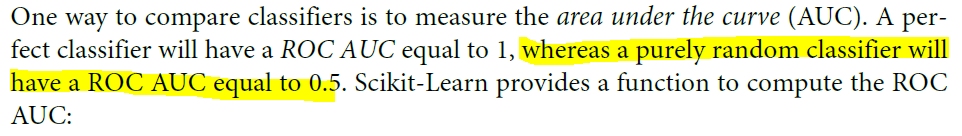

In [64]:
from sklearn.dummy import DummyClassifier #41

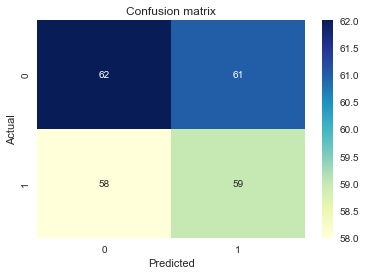

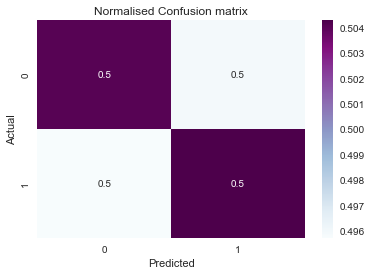

Accuracy score for predicting the all class is: 50.416666666666664%
Balanced  Accuracy score for predicting the all class is: 50.41692724619553%
Recall score for predicting the all class is: 50.427350427350426%
precision score for predicting the all class is: 49.166666666666664%
AUC score for predicting the all class is: 50.41692724619554%
F1 score for predicting the all class is: 49.78902953586497%
F-beta score for predictingh all class with beta = 10 is: 50.414551607445%
F-beta score for predictingh all class with beta = 0.1 is: 49.17883964677725%
F1 macro score for predicting the all class is: 50.416666666666664%
F1 macro score for predicting the all class is: 50.408918060113564%


,Score
Accuracy score,50.416667
Balanced Accuracy,50.416927
Recall,50.427350
Precision,49.166667
AUC,50.416927
F1 score,49.789030
F-beta score - 10,50.414552
F-beta score -01,49.178840
F1 micro,50.416667
F1 macro,50.408918


In [65]:
randm_clf = DummyClassifier(strategy="uniform", random_state=56).fit(xtrain, ytrain)
pred_randm = randm_clf.predict(xtrain)
df_allrand_metric, a, ba, rs, ps, auc_, f1s, fbeta_10, fbeta_01, f1micro, f1macro = getallmetric(ytrain, pred_randm)
print("Accuracy score for predicting the all class is: {}%".format(a))
print("Balanced  Accuracy score for predicting the all class is: {}%".format(ba))
print("Recall score for predicting the all class is: {}%".format(rs))
print("precision score for predicting the all class is: {}%".format(ps))
print("AUC score for predicting the all class is: {}%".format(auc_))
print("F1 score for predicting the all class is: {}%".format(f1s))
print("F-beta score for predictingh all class with beta = 10 is: {}%".format(fbeta_10))
print("F-beta score for predictingh all class with beta = 0.1 is: {}%".format(fbeta_01))
print("F1 macro score for predicting the all class is: {}%".format(f1micro))
print("F1 macro score for predicting the all class is: {}%".format(f1macro))

df_allrand_metric

**<font color="purple">Observation</font>**

* We can see that we have accuracy score as 50% because we have equal random prediction distribution for both the classes

* The value of recall is 48.27%, because we know that recall metrics used for positive class since there is only half of the positive class predicted, we have 48.27% score for these metrics. 

* The value of precision is 48.27% because we know that, all the half of the positive predictions are not correct and precision requires correct positive prediction, hence the precision is not 100%.

* But we can see that when there is equal prediction distribution randomly we have approximate value of 50%, while comapring with the earlier cases when all the values were either negative or positive classes.

### <font color="purple">2.3 Choose a performance metric [0.5 marks]</font>

<font color="purple">Based on the above baseline tests and the client's requirements, **choose a performance metric** to use for evaluating/driving your machine learning methods.  **Give a reason for your choice.**</font>

Their requirements are:
 1) have at least a 95% probability of detecting malignant cancer when it is present;
 
 2) have no more than 1 in 10 healthy cases (those with benign tumours) labelled as positive (malignant).

**<font color="purple">STEPS TO SOLVE THE QUESTION<font>**

Aim: Choose the performance metric by considering the client's requirement

* Step 1: Create functions for client requirements for testing
* Step 2: Pass the client requirements for above baseline tests

**Client requirement 1**

* Detect the 95% probabality of malignant cases from all the maligant cases

In [66]:
# client requirement 1
def clientcriteria_1(ytrue, ypred):
    # dataframe true and predcited data
    df_pred = pd.DataFrame(columns=["True data", "Predicted data"])
    df_pred["True data"] = ytrue
    df_pred["Predicted data"] = ypred
    # selecting only malignant that is = 1
    df_pred = df_pred[df_pred["True data"]==1].reset_index(drop=True)
    # calaculating the probablity of malignant cases when malignant is present
    # total actual malignant
    total_malig_actual = df_pred.shape[0]
    # total predicted malignant
    total_malig_pred = df_pred[df_pred["Predicted data"]==1].shape[0]
    # probablity
    prob_malig = (total_malig_pred/total_malig_actual)*100
    #accuracuy_malig = accuracy_score(df_pred["True data"].values, df_pred["Predicted data"].values)*100
    #total_actual_malignant = df_pred.shape[0]
    #total_predicted_malignant = df_pred[df_pred["Predicted data"]==1].shape[0]
    print("=================================CLIENT CRITERIA 1==============================================")
    print("Out of {} malignant data total of {} data are predicted as Malignant".format(total_malig_actual, total_malig_pred))
    print("Total probablity of predicting malignant when the malignant is present is: {}%".format(prob_malig))
    return df_pred, prob_malig, total_malig_actual, total_malig_pred 

**Client requirement 2**

* Out of 10 benign cases, there should not be more than one mlaigant mismatch

In [67]:
def clientcriteria_2(ytrue, ypred):
    # dataframe true and predcited data
    df_pred = pd.DataFrame(columns=["True data", "Predicted data"])
    df_pred["True data"] = ytrue
    df_pred["Predicted data"] = ypred
    # selecting only benign = 0 and later checking how many benign are classified as malignant
    df_pred = df_pred[df_pred["True data"]==0].reset_index(drop=True)
    total_malignant_propotion = df_pred[df_pred["Predicted data"]==1].shape[0]
    tota_benign = df_pred.shape[0]
    print("=================================CLIENT CRITERIA 2==============================================")
    print("Out of {} data total of {} data are misclassified as Malignant instead of Benign".format(tota_benign, total_malignant_propotion))
    return df_pred, total_malignant_propotion, tota_benign 

**Analysing the performance metrics for each of the baseline cases with respect to the client requirements**

**<font color="purple">Case 1: predicting all samples to be negative (class 1) ->Benign values is 0</font>**

In [68]:
# the performance metrics for the all negative prediction are as follows:

print("===============================PERFORMANCE METRICS FROM BASELINE=================================")
print(tabulate(df_allneg_metric, headers='keys', tablefmt='psql'))

# checking the client requirement 1
c1_df_neg, c1_neg_acc, c1_neg_actualmalig, c1_pred_malig_neg = clientcriteria_1(ytrain, yall_neg)

# checking the client requirement 2
c2_df_neg, c2_malig_neg, c2_benig_neg = clientcriteria_2(ytrain, yall_neg) 

===============================PERFORMANCE METRICS FROM BASELINE=================================
+-------------------+---------+
|                   |   Score |
|-------------------+---------|
| Accuracy score    | 51.25   |
| Balanced Accuracy | 50      |
| Recall            |  0      |
| Precision         |  0      |
| AUC               | 50      |
| F1 score          |  0      |
| F-beta score - 10 |  0      |
| F-beta score -01  |  0      |
| F1 micro          | 51.25   |
| F1 macro          | 33.8843 |
+-------------------+---------+
=================================CLIENT CRITERIA 1==============================================
Out of 117 malignant data total of 0 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 0.0%
=================================CLIENT CRITERIA 2==============================================
Out of 123 data total of 0 data are misclassified as Malignant instead of Benign


**Performance metrics observation**

* In this baseline case, we tried to predict all the class label as negative that is "benign" or "0" therefore, we are not predicting any on positive class hence, the accuracy is approximately equal to 50. The accuracy is approximately equal to 50 is only when the classes are balanced.  For example, if we have total 50 data, and out of 50 45 data is classified as negatived 5 data are classifed as positive then while using the above the model on following data we predict 45 datasets are negative while 5 positive classes are still misclassified. But we can observe that accuracy is 45/50 that is 90% which is wrong because we have not predicted anything on positive class, therefore having class balanced is important when we use performance metrics as accuracy to avoid any biasness of larger class data.

* Here **Rceall is, propotion of positvely class predicted out of all positive classes. Hence, here Recall is 0% because nothing on positive class is predicted.**

* **here Precision is, propotion of correctly positve prediction out of all positive prediction, Hence, here Precision is 0% because nothing on positive class is predicted**. 

* **Here, AUC score is 50% because the only one type of class is predicted**

* **Balanced accuracy is a propotion of average of recall obtained or each class, since we have predicted all negative class and not positive class we have obtained 50% accuracy**

* Since F1 score is a harmonic mean of precision and recall, we obtain F1 score as 0% because,both precision and recall is 0%.

* Fbeta score is a weighted harmonic mean of precision and recall, since our recall and precision is 0% we obtain Fbeta score with beta 10 and 0.1 as 0%.

* **Accuracy, Balanced accuracy, and AUC follows the client requirement because, we have not predicted correctly all the class for 95% since, we have only predicted one type of class we should get around 50%. And there is no misclassification of malignant as benign Hence these chnaged are shown in the accuracy and balance accuracy.**

**Comparing the performance metrics for the case: 1 baseline, we can say that Accuracy score, Balanced accuracy, and AUC scores are the good performance metrics according to the client requirement.**

**<font color="purple">Case 2: predicting all samples to be positive (class 2) ->Malignant values is 1</font>**

In [69]:
# the performance metrics for the all positive prediction are as follows:

print("===============================PERFORMANCE METRICS FROM BASELINE==============================")
print(tabulate(df_allpos_metric, headers='keys', tablefmt='psql'))

# checking the client requirement 1
c1_df_pos, c1_pos_acc, c1_pos_actualmalig, c1_pred_malig_pos = clientcriteria_1(ytrain,  yall_pos)

# checking the client requirement 2
c2_df_pos, c2_malig_pos, c2_benig_pos = clientcriteria_2(ytrain, yall_pos) 

===============================PERFORMANCE METRICS FROM BASELINE==============================
+-------------------+----------+
|                   |    Score |
|-------------------+----------|
| Accuracy score    |  48.75   |
| Balanced Accuracy |  50      |
| Recall            | 100      |
| Precision         |  48.75   |
| AUC               |  50      |
| F1 score          |  65.5462 |
| F-beta score - 10 |  98.9698 |
| F-beta score -01  |  48.9986 |
| F1 micro          |  48.75   |
| F1 macro          |  32.7731 |
+-------------------+----------+
=================================CLIENT CRITERIA 1==============================================
Out of 117 malignant data total of 117 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 100.0%
=================================CLIENT CRITERIA 2==============================================
Out of 123 data total of 123 data are misclassified as Malignant instead of Benign


**Performance metrics observation**

* In this baseline case, we tried to predict all the class label as positive that is "malignant" or "1" therefore, we are not predicting any on negative class hence, the accuracy is approximately equal to 50 if the class labels are balanced. From the performance tabel we can see that we have obtained 48.75% accuracy, This is because, we are predicting only positive class and not negative class, hence all negative classes are predicted as positive class therefore half of the predictions are correct. 

* We know that Recall is propotion of correctly positive classes predicted to the overall correct positive prediction, hence we are only predicting positive class we have 100% score. But we can also observe that having only recall as our performance metric is not good because it does not include anything for the negatively class predicted. Plus there is no penalization misclassification on negative class.

* here Precision is, propotion of correctly positve prediction out of all positive prediction, since all the values are positively predicted and our class labels are balanced we can expect atleast of half of the valuea are correctly predicted. Hence we have scores only for the positive prediction that is 48.3%.

* Here, AUC score is 50% because the only one type of class is predicted. We can see there is 50% of penalization when all negative classes are not predicted.

* Balanced accuracy is a propotion of average of recall obtained or each class, since we have predicted all positive class and not negative class we have obtained 50% accuracy. We can see there is 50% of penalization when all negative classes are not predicted.

* Fbeta score is a weighted harmonic mean of precision and recall, however, we can observe that weighting parameters play important role because when the beta is 10 we have performance as 98.96% where as, beta is 0.1 the performance metric is 48.99. Hence choosing performance metric with low beta when classes are imbalanced is good.

* **Accuracy, Balanced accuracy, and AUC follows the client requirement because, we have not predicted correctly all the class for 95% since, we have only predicted one type of class we should get around 50%. and we have misclassified 123 data as maligant instead of benign  Hence these chnaged are shown in the accuracy, AUC and balance accuracy.**


**Comparing the performance metrics for the case: 2 baseline, we can say that Accuracy score, Balanced accuracy, and AUC scores are the good performance metrics because these metrics follows clients reuqirement**

**<font color="purple">Case 3: random prediction for each sample with equal probability for each class</font>**

In [70]:
# the performance metrics for the random prediction are as follows:

print("===============================PERFORMANCE METRICS FROM BASELINE==============================")
print(tabulate(df_allrand_metric, headers='keys', tablefmt='psql'))

# checking the client requirement 1
c1_df_rand, c1_rand_acc, c1_rand_actualmalig, c1_pred_malig_rand = clientcriteria_1(ytrain,  pred_randm)

# checking the client requirement 2
c2_df_rand, c2_malig_rand, c2_benig_rand = clientcriteria_2(ytrain, pred_randm) 

===============================PERFORMANCE METRICS FROM BASELINE==============================
+-------------------+---------+
|                   |   Score |
|-------------------+---------|
| Accuracy score    | 50.4167 |
| Balanced Accuracy | 50.4169 |
| Recall            | 50.4274 |
| Precision         | 49.1667 |
| AUC               | 50.4169 |
| F1 score          | 49.789  |
| F-beta score - 10 | 50.4146 |
| F-beta score -01  | 49.1788 |
| F1 micro          | 50.4167 |
| F1 macro          | 50.4089 |
+-------------------+---------+
=================================CLIENT CRITERIA 1==============================================
Out of 117 malignant data total of 59 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 50.427350427350426%
=================================CLIENT CRITERIA 2==============================================
Out of 123 data total of 61 data are misclassified as Malignant instead of Benign


**Performance metrics observation**

* In this baseline case, we tried to predict all the class label through random in equal probabality, for the pure eaual random classification with balanced data the accuracy is equal to 50. From the performance tabel we can see that we have obtained 50.41% accuracy, This is because, we are predicting in random manner with equal propotion.

* We know that Recall is propotion of correctly positive classes predicted to the overall correct positive prediction, hence we are predicting positive class and negative class in randomly but with equal propotion we have 50.42% score. 

* here Precision is, propotion of correctly positve prediction out of all positive prediction, since we are predicting positive class and negative class in randomly but with equal propotion we have approximately 49.16% score.

* Here, AUC score is aproximately 50% because we are predicting positive class and negative class in randomly but with equal propotion we have approximately 50% score.

* Balanced accuracy is a propotion of average of recall obtained or each class, since we are predicting positive class and negative class in randomly but with equal propotion we have approximately 50% score.

* Since F1 score is a harmonic mean of precision and recall, and we are predicting positive class and negative class in randomly but with equal propotion we have score similar as recall and precision.

* Fbeta score is a weighted harmonic mean of precision and recall, and our score is similar as recall and precision.

* **All the metrics follows the client requirement because, we have not predicted correctly all the class for 95% since, we have only predicted in equal propotion for each class we should get around 50%. and we have misclassified 61 data as maligant instead of benign  Hence these chnaged are shown in all the metrics.**

**Overall observation and selecting best performance metric**

* Our main aim is to predict correctly and it is important that we have our class labels balanced. Based on the given data and it's balance propotion we can say that **Recall, Precision, Fbeta score with beta = 10 and 0.1 are not good. The reason is, recall and precision metric focuses only on the positvely labelled class and it's correct predictions ignoring negative class labels and Fbeta scores had 0% when all the classes are predicted as negative but when the all the classes are predicted as postive the Fbeta score with beta = 10 had 98% score where Fbeta score with beta =0.1 had 48.5%, therefore we can see that it has similar effect as of recall hence we are not using these performance metrics**.
* Therefore, we need metric that it will penalizes when there is wrong prediction and it is not biass towards one type of class and due to this we can see that **Accuracy score, balanced accuracy, AUC are the good performance metric which focuses on both positve class and negative class**
* **To choose one out of these 3 metrics, I would choose AUC, because this metrics handles imbalance and gives unbiass result whereas metrics like recall and precision depends upon the positive class, and accuracy metric focuses on balanced data for proper result**

### <font color="purple">2.4 SGD baseline [1 mark]</font>

<font color="purple">For a stronger baseline, **train and evaluate** the Stochastic Gradient Descent classifier (as seen in workshop 5). For this baseline case use the default settings for all the hyperparameters.</font>

In this section we will use the Stochastic gradient descent classifier as the baseline model. Earlier, we had used following baseline models:
*    - All negative class
*    - All positive class 
*    - Equal random distribution prediction

and we found that following are the best evalaution metrics:
*    - Accuracy score
*     - Balanced Accuracy score
*     - AUC score

Now we will build the stronger baseline using above performance metrics for creating the baseline measure for later models. 

**For strong baseline performance metric we will use both validation data using split method and cross validation using KFOLD method and datasets are scaled**

In [71]:
from sklearn.pipeline import Pipeline
from sklearn.linear_model import SGDClassifier

**Pipeline for SGD baseline**

In [73]:
model_pipeline = Pipeline([('SGD_default', SGDClassifier())]) 
print(model_pipeline)

Pipeline(steps=[('SGD_default', SGDClassifier())])


**<font color="purple">CASE 1: Dividing the train data into validation data with stratified split</font>**

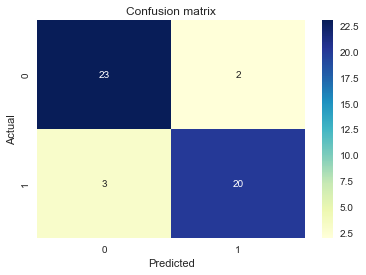

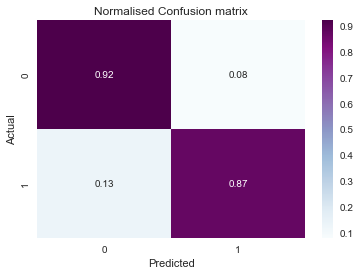

+-------------------+---------+
|                   |   Score |
|-------------------+---------|
| Accuracy score    | 89.5833 |
| Balanced Accuracy | 89.4783 |
| Recall            | 86.9565 |
| Precision         | 90.9091 |
| AUC               | 89.4783 |
| F1 score          | 88.8889 |
| F-beta score - 10 | 86.994  |
| F-beta score -01  | 90.8682 |
| F1 micro          | 89.5833 |
| F1 macro          | 89.5425 |
+-------------------+---------+


In [74]:
# dividing the data into validation
trainx, validx, trainy, validy = train_test_split(xtrain, ytrain, test_size=0.2, 
                                                  shuffle=True, random_state=53, 
                                                  stratify=ytrain)

# scaling

# using trainx and trainy from the above split for validation
scale_base = preprocess_pipeline[2].fit(trainx)
trainx_base = scale_base.transform(trainx)
validx_base = scale_base.transform(validx)

# baseline model
clf = SGDClassifier(random_state=50).fit(trainx_base, trainy)
pred_sgd = clf.predict(validx_base)
df_sgd_deault_metric, a, ba, rs, ps, auc_, f1s, fbeta_10, fbeta_01, f1micro, f1macro  = getallmetric(validy, pred_sgd)
print(tabulate(df_sgd_deault_metric, headers='keys', tablefmt='psql'))

**HERE, PLEASE IGNORE OTHER PERFORMANCE METRICS OTHER THAN FOLLOWING:**
*    - Accuracy score
*     - Balanced Accuracy score
*     - AUC score

Because these are my selected metrics from the earlier analysis.

**<font color="purple">CASE 2: Cross validation as strong baseline, Kfold with K=7</font>**


In [75]:
from sklearn.model_selection import KFold

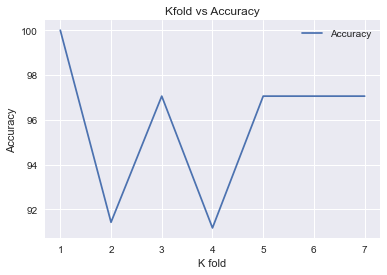

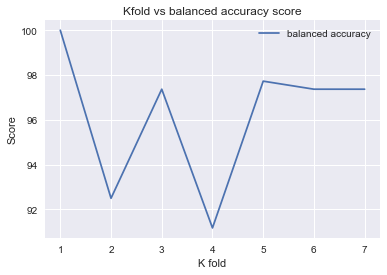

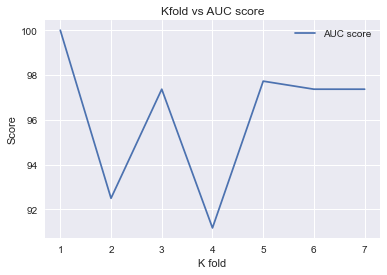

Average Accuracy after 5 Kfold for baseline is:  95.83
Average Balanced accuracy score after 5 Kfold for baseline is:  96.22
Average AUC score after 5 Kfold for baseline is:  96.22

+-------------------+-----------------+----------------------+
| Metrics           |   Average score |   Standard deviation |
|-------------------+-----------------+----------------------|
| Accuracy          |           95.83 |                 3.03 |
| Balanced Accuracy |           96.22 |                 2.92 |
| AUC               |           96.22 |                 2.92 |
+-------------------+-----------------+----------------------+


In [76]:
# kfold 
k = 7
avg_acc, avg_balanced_acc, avg_auc = [],  [], []
kf = KFold(n_splits=k, random_state=53, shuffle=True)
for train_ix, valid_ix in kf.split(xtrain):
    # data
    trainx_kf, validx_kf = xtrain[train_ix], xtrain[valid_ix]
    trainy_kf, validy_kf = ytrain[train_ix], ytrain[valid_ix]
    # scaling
    scale_base_kf = preprocess_pipeline[2].fit(trainx_kf)
    trainx_base_kf = scale_base_kf.transform(trainx_kf)
    validx_base_kf = scale_base_kf.transform(validx_kf)
    # cross validation model
    clf = SGDClassifier(random_state=53).fit(trainx_base_kf, trainy_kf)
    pred_sgd = clf.predict(validx_base_kf)
    avg_acc.append(accuracy_score(validy_kf, pred_sgd)*100)
    avg_auc.append(roc_auc_score(validy_kf, pred_sgd)*100)
    avg_balanced_acc.append(balanced_accuracy_score(validy_kf, pred_sgd)*100)
    
# plotting

plt.plot([x for x in range(1, k+1)], avg_acc, label="Accuracy")
plt.title("Kfold vs Accuracy")
plt.xlabel("K fold")
plt.ylabel("Accuracy")
plt.legend()
plt.show() 

plt.plot([x for x in range(1, k+1)], avg_auc, label="balanced accuracy")
plt.title("Kfold vs balanced accuracy score")
plt.xlabel("K fold")
plt.ylabel("Score")
plt.legend()
plt.show() 

plt.plot([x for x in range(1, k+1)], avg_auc, label="AUC score")
plt.title("Kfold vs AUC score")
plt.xlabel("K fold")
plt.ylabel("Score")
plt.legend()
plt.show() 


df_kfold = pd.DataFrame(index=["Accuracy", "Balanced Accuracy", "AUC"], 
                       columns=["Average score", "Standard deviation"])
df_kfold["Average score"].loc["Accuracy"] = round(np.mean(avg_acc),2)
df_kfold["Standard deviation"].loc["Accuracy"] = round(np.std(avg_acc),2)
df_kfold["Average score"].loc["Balanced Accuracy"] = round(np.mean(avg_balanced_acc),2)
df_kfold["Standard deviation"].loc["Balanced Accuracy"] = round(np.std(avg_balanced_acc),2)
df_kfold["Average score"].loc["AUC"] = round(np.mean(avg_auc),2)
df_kfold["Standard deviation"].loc["AUC"] = round(np.std(avg_auc),2)

# report
print("Average Accuracy after 5 Kfold for baseline is: ", round(np.mean(avg_acc),2))
print("Average Balanced accuracy score after 5 Kfold for baseline is: ", round(np.mean(avg_balanced_acc),2))
print("Average AUC score after 5 Kfold for baseline is: ", round(np.mean(avg_auc),2))
print()
# table
print(tabulate(df_kfold, headers=["Metrics", "Average score", "Standard deviation"],
              tablefmt='psql'))

* From the above analysis, we can observe that,
    - For validation data with fixed set, and performance metrics as accuracy, balanced accuracy and AUC score we have obtained score of 90%.
    - Whereas, using  cross validation approach and and performance metrics as accuracy, balanced accuracy and AUC score we have obtained score of 96%.
    - Here, we will average the baseline from both the model, therefore our baseline performance metric is 93% for ccuracy, balanced accuracy and AUC score.

### <font color="purple">2.5 Confusion matrix [1 mark]</font>

<font color="purple">Calculate and display the normalized version of the confusion matrix.  From this **calculate the _probability_ that a sample from a person with a malignant tumour is given a result that they do not have cancer.  Which of the client's two criteria does this relate to, and is this baseline satisfying this criterion or not?**</font>

* Here **person with a malignant tumour is given a result that they do not have cancer** means, person has malignant tumor but it is predicted as the person does not have cancer. which is a case of **False negative.**

**To identify the probablity of occurence of false negative we will do the below experiment, here we will use the scaled verison of train data with validation data**

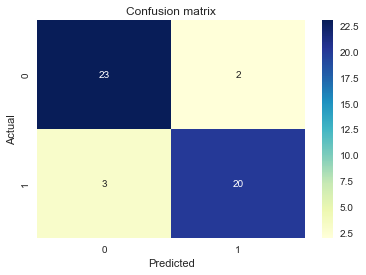

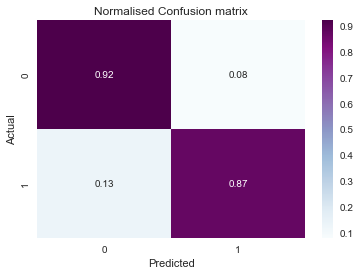

+-------------------+---------+
|                   |   Score |
|-------------------+---------|
| Accuracy score    | 89.5833 |
| Balanced Accuracy | 89.4783 |
| Recall            | 86.9565 |
| Precision         | 90.9091 |
| AUC               | 89.4783 |
| F1 score          | 88.8889 |
| F-beta score - 10 | 86.994  |
| F-beta score -01  | 90.8682 |
| F1 micro          | 89.5833 |
| F1 macro          | 89.5425 |
+-------------------+---------+


In [77]:
# using trainx and trainy from the above split for validation
scale_base = preprocess_pipeline[2].fit(trainx)
trainx_base = scale_base.transform(trainx)
validx_base = scale_base.transform(validx)


clf = SGDClassifier(random_state=1).fit(trainx_base, trainy)
pred_sgd = clf.predict(validx_base)
df_sgd_deault_metric, a, ba, rs, ps, auc_, f1s, fbeta_10, fbeta_01, f1micro, f1macro  = getallmetric(validy, pred_sgd)
print(tabulate(df_sgd_deault_metric, headers='keys', tablefmt='psql'))

**HERE, PLEASE IGNORE OTHER PERFORMANCE METRICS OTHER THAN FOLLOWING:**
*    - Accuracy score
*     - Balanced Accuracy score
*     - AUC score

Because these are my selected metrics from the earlier analysis.

**Analysing the client requirements from the baseline performance**

In [78]:
# checking the client requirement 1
c1_sgd_df, c1_sgd_acc, c1_sgd_actualmalig, c1_pred_malig_rand = clientcriteria_1(validy, pred_sgd)

# checking the client requirement 2
c2_df_sgd, c2_malig_sgd, c2_benig_sgd= clientcriteria_2(validy, pred_sgd) 

# probabality of false negative
tn, fp, fn, tp = confusion_matrix(validy, pred_sgd, normalize='true').ravel()
print()
print("Probabality of False diagnosis of Malignant cancer is: ", fn)

=================================CLIENT CRITERIA 1==============================================
Out of 23 malignant data total of 20 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 86.95652173913044%
=================================CLIENT CRITERIA 2==============================================
Out of 25 data total of 2 data are misclassified as Malignant instead of Benign

Probabality of False diagnosis of Malignant cancer is:  0.13043478260869565


* From the analysis, we can observe that, this is the False negative case, and we can see that there is a chance of 0.134 probablity that can occur. 

* However, the baseline does not follow with clients first requiremnt that is achieving 95% prediction accuracy for maliganant cancer. because, we have 23 malignant cases and we have preeicted correctly 20 which gives us the accuracy of 86.95%. Hence the baseline model was not able to follow the first client requirement.

* However, the model is able to follow with the second requirement for having only 2 misclassification as malignant out of 25 data. because, we can only have 1 misclassification out of 10 data, hence we have only 2 misclassification we can say that we are following the clients second requirement using the baseline model.

### <font color="purple">2.6 Main classifier [11 marks]</font>

<font color="purple">**Train and optimise the hyperparameters** to give the best performance for **each of the following classifiers</font>**:
 - KNN (K-Nearest Neighbour) classifier
 - Decision tree classifier
 - Support vector machine classifier
 - SGD classifier
 
Follow best practice as much as possible here. You must make all the choices and decisions yourself, and strike a balance between computation time and performance.

You can use any of the sci-kit learn functions in sklearn.model_selection.cross* and anything used in workshops 3, 4, 5 and 6. Other hyper-parameter optimisation functions apart from these cannot be used (even if they are good and can be part of best practice in other situations - for this assignment everyone should assume they only have very limited computation resources and limit themselves to these functions).

**Display the performance of the different classifiers and the optimised hyperparameters.**

**Based on these results, list the best 3 classifiers and indicate if you think any perform equivalently.**

**<font color="purple">In this analysis, we will use the following process:</font>**

* We will use the cross validation to evaluate the performance of the models
* However, we need to use the preprocessing, so in order to minimise complexity we will preprocess the data here, and we will pass the scaled data to the cross validation instead of scaling everytime inside the loop.

In [79]:
# preproceessing values


class preprocesser:
    def __init__(self, Xtrain, pipelines):
        self.Xtrain = Xtrain 
        self.pipelines = pipelines
        
    def fit_scaling(self):
        self.scaler = self.pipelines[2].fit(self.Xtrain)
        return self.scaler 
    
    def tranform_scaling(self, X):
        transform = self.scaler.transform(X)
        return transform 
    
    def inverse_scaling(self, X):
        transform = self.scaler.inverse_transform(X)
        return transform 

**To avoid any data confusion , we will do the split again**

In [80]:
# original data
df_ = data.copy()
df_.head(4)

,label,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,malignant,15.494654,15.902542,103.008265,776.437239,0.104239,0.168660,0.170572,0.085668,0.205053,...,19.522957,22.427276,135.128520,1286.903131,0.142725,0.407483,0.445992,0.171662,0.353211,0.097731
1,malignant,16.229871,18.785613,105.176755,874.712003,0.091843,0.092548,0.081681,0.053670,0.180435,...,19.140235,24.905156,123.886045,1234.499997,0.129135,0.223918,0.248846,0.136735,0.284427,0.085758
2,malignant,16.345671,20.114076,107.083804,872.563251,0.099924,0.123799,0.128788,0.078310,0.189756,...,19.144816,25.601433,125.113036,1202.749973,0.135017,0.314402,0.332505,0.161497,0.313038,0.084340
3,malignant,13.001009,19.876997,85.889775,541.281012,0.113423,0.173069,0.146214,0.069574,0.212078,...,15.565911,26.145119,102.958265,737.655082,0.161390,0.485912,0.430007,0.167254,0.432297,0.117705


In [81]:
# transform labels 0 as negative - benign and 1 as positive for malignant
df_["label"] = np.where(df_["label"]=="malignant", 1, 0)
df_.head(4)

,label,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,1,15.494654,15.902542,103.008265,776.437239,0.104239,0.168660,0.170572,0.085668,0.205053,...,19.522957,22.427276,135.128520,1286.903131,0.142725,0.407483,0.445992,0.171662,0.353211,0.097731
1,1,16.229871,18.785613,105.176755,874.712003,0.091843,0.092548,0.081681,0.053670,0.180435,...,19.140235,24.905156,123.886045,1234.499997,0.129135,0.223918,0.248846,0.136735,0.284427,0.085758
2,1,16.345671,20.114076,107.083804,872.563251,0.099924,0.123799,0.128788,0.078310,0.189756,...,19.144816,25.601433,125.113036,1202.749973,0.135017,0.314402,0.332505,0.161497,0.313038,0.084340
3,1,13.001009,19.876997,85.889775,541.281012,0.113423,0.173069,0.146214,0.069574,0.212078,...,15.565911,26.145119,102.958265,737.655082,0.161390,0.485912,0.430007,0.167254,0.432297,0.117705


In [82]:
X = np.array(df_.iloc[:, 1:])
Y = np.array(df_.iloc[:, 0])

In [83]:
# divide the data into train and test 80/20 using stratify

xtrain, xtest, ytrain, ytest = train_test_split(X, Y, test_size=0.2, shuffle=True, stratify=Y, random_state=33)

-----------------------------------------------------------------------------------------------
======================Total class labels for train===================
Total class 1 (Malignant) are:   117
Total class 0 (Benign) are:   123
-----------------------------------------------------------------------------------------------

-----------------------------------------------------------------------------------------------
======================Total class labels for test===================
Total class 1 (Malignant) are:   29
Total class 0 (Benign) are:   31
-----------------------------------------------------------------------------------------------


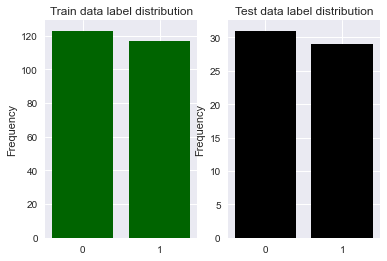

In [84]:
traincls, trainfreq = np.unique(ytrain, return_counts=True)
testcls, testfreq = np.unique(ytest, return_counts=True)
print("-----------------------------------------------------------------------------------------------")
print("======================Total class labels for train===================")
print("Total class 1 (Malignant) are:  ", trainfreq[1])
print("Total class 0 (Benign) are:  ", trainfreq[0])
print("-----------------------------------------------------------------------------------------------")
print()
print("-----------------------------------------------------------------------------------------------")
print("======================Total class labels for test===================")
print("Total class 1 (Malignant) are:  ", testfreq[1])
print("Total class 0 (Benign) are:  ", testfreq[0])
print("-----------------------------------------------------------------------------------------------")
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.bar(x=[str(x) for x in traincls], height=trainfreq, label="Train", color="darkgreen")
ax2.bar(x=[str(x) for x in testcls], height=testfreq, label="Test", color="black")
ax1.set_title("Train data label distribution")
ax2.set_title("Test data label distribution")
ax1.set_ylabel("Frequency")
ax2.set_ylabel("Frequency")
plt.show()

### <font color="purple">TRAINING</font>

* In the training we will use follow the following workflow for training the model using startified k fold cross validation:

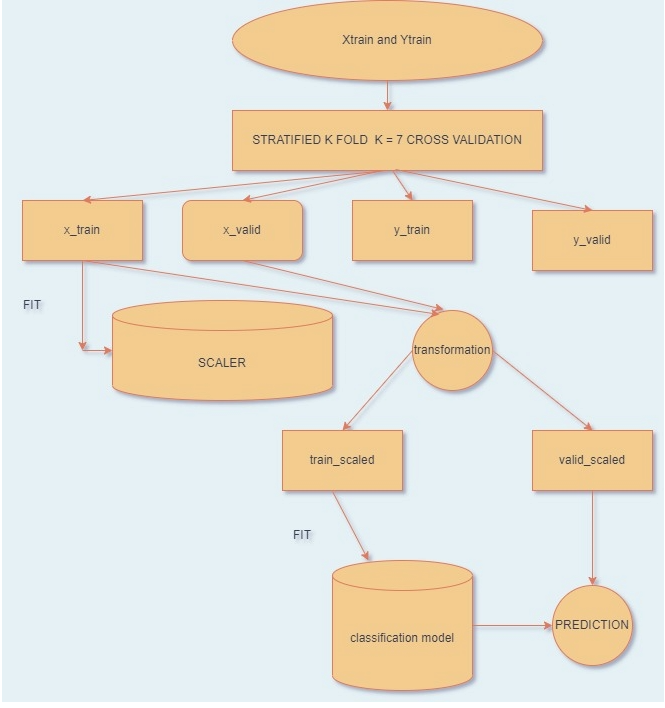

**We will never use test data in the training and optimization**

In [85]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import StratifiedKFold

In [86]:
# pipeline for each model

# knn
knn_pipeline = Pipeline([('KNN', KNeighborsClassifier())]) 
# decision tree
dtree_pipeline = Pipeline([('DTREE', DecisionTreeClassifier())]) 
# svm
svc_pipeline = Pipeline([('SVM', SVC())]) 
# sgd
sgd_pipeline = Pipeline([('SGD_default', SGDClassifier())]) 

In [87]:
def plotmetric(df, caption=""):
    xlabels = df.index
    plt.barh(y=xlabels, width=df["Score"].values)
    plt.title("Performance metrics for "+caption)
    plt.ylabel("Performance metics")
    plt.xlabel("Performace score")
    plt.show()

In [88]:
def kfoldvalidation(modelpipeline, preprocess_pipeline, Xtrain, Ytrain, k):
    
    # model from pipeline
    model = modelpipeline[0]
    
    # storing all the metrics at every iteration
    avg_acc, avg_balanced_acc, avg_auc_= [], [], []
    
    # stratified k fold split
    skf_ = StratifiedKFold(n_splits=k, shuffle=True)
    
    # iteration for kfold
    for train_ix, test_ix in skf_.split(Xtrain, Ytrain):
        # extracting all the x values for train and validation using train and valid index from the loop
        x_train, x_valid = Xtrain[train_ix], Xtrain[test_ix]
        # extracting all the y values for train and validation using train and valid index from the loop
        y_train, y_valid = Ytrain[train_ix], Ytrain[test_ix]
        # scaling the train x and valid x values
        scaler = preprocesser(x_train, preprocess_pipeline)
        scaler_fit = scaler.fit_scaling()
        # transform x train using sclaer transformation obtained from x train
        train_scaled = scaler.tranform_scaling(x_train)
        # transform x valid using sclaer transformation obtained from x train
        valid_scaled = scaler.tranform_scaling(x_valid)
        # using the extracted values in the model
        clf = model.fit(train_scaled, y_train)
        # predeiction
        pred = clf.predict(valid_scaled)
        # appending the performance metrics
        avg_acc.append(accuracy_score(y_valid, pred)*100)
        avg_balanced_acc.append(balanced_accuracy_score(y_valid, pred)*100)
        avg_auc_.append(roc_auc_score(y_valid, pred)*100)
    avg_metric = [np.mean(z) for z in [avg_acc, avg_balanced_acc, avg_auc_]]     
    df_metric = pd.DataFrame(index=["Accuracy score", "Balanced accuracy score", 
                                   "AUC score"], data = avg_metric, columns=["Score"])
    print(tabulate(df_metric,headers=["Performanc metrics", "Score"], tablefmt='psql'))
    return df_metric

**Analaysing the each models**

+-------------------------+---------+
| Performanc metrics      |   Score |
|-------------------------+---------|
| Accuracy score          | 95.006  |
| Balanced accuracy score | 94.9201 |
| AUC score               | 94.9201 |
+-------------------------+---------+


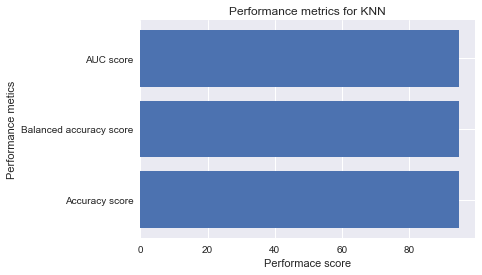

In [89]:
# knn

knn_df_metric = kfoldvalidation(knn_pipeline, preprocess_pipeline, xtrain, ytrain, 7)
plotmetric(knn_df_metric, "KNN")

- From teh above training using KNN, We have used starified Kfold with 7 iterations, and using scaling we have obtained 94.56% Accuracy score, 94.47% balanced accuracy score and 94.47% of AUC score. 
- These scores are obtained using the deafault parameter

+-------------------------+---------+
| Performanc metrics      |   Score |
|-------------------------+---------|
| Accuracy score          | 87.1669 |
| Balanced accuracy score | 87.252  |
| AUC score               | 87.252  |
+-------------------------+---------+


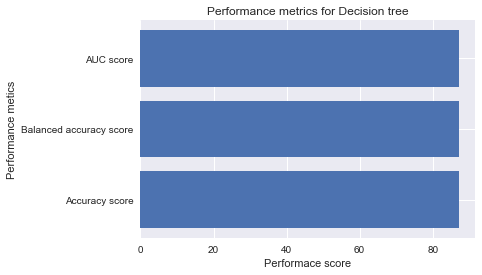

In [90]:
# decision tree

dtree_df_metric = kfoldvalidation(dtree_pipeline, preprocess_pipeline, xtrain, ytrain, 7)
plotmetric(dtree_df_metric, "Decision tree")

- From the above training using Decision tree classifier, We have used starified Kfold with 7 iterations, and using scaling we have obtained 90.40% Accuracy score, 90.39% balanced accuracy score and 90.39% of AUC score. 
- These scores are obtained using the deafault parameter

+-------------------------+---------+
| Performanc metrics      |   Score |
|-------------------------+---------|
| Accuracy score          | 94.1537 |
| Balanced accuracy score | 94.2314 |
| AUC score               | 94.2314 |
+-------------------------+---------+


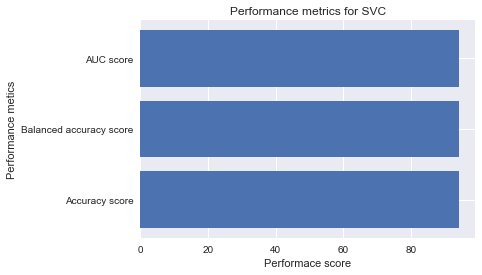

In [91]:
# svm 

svm_df_metric = kfoldvalidation(svc_pipeline, preprocess_pipeline, xtrain, ytrain, 7)
plotmetric(svm_df_metric, "SVC")

- From the above training using Support vector classifier, We have used starified Kfold with 7 iterations, and using scaling we have obtained 94.97% Accuracy score, 94.98% balanced accuracy score and 94.98% of AUC score. 
- These scores are obtained using the deafault parameter

+-------------------------+---------+
| Performanc metrics      |   Score |
|-------------------------+---------|
| Accuracy score          | 94.1417 |
| Balanced accuracy score | 94.2752 |
| AUC score               | 94.2752 |
+-------------------------+---------+


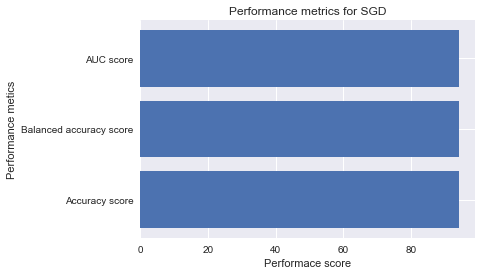

In [92]:
# sgd 

sgd_df_metric = kfoldvalidation(sgd_pipeline, preprocess_pipeline, xtrain, ytrain, 7)
plotmetric(sgd_df_metric, "SGD")

- From the above training using Staochastic Gradient classifier, We have used starified Kfold with 7 iterations, and using scaling we have obtained 92.95% Accuracy score, 92.92% balanced accuracy score and 92.92% of AUC score. 
- These scores are obtained using the deafault parameter

**Overall observation from training**

**From the above training the model, we can observe that:**
- **WE have obtained 90%+ score in all the models**
- **These performance are using the default parameter settings of the model**
- **The best score was obtained using Support vector classifier with the score 94.97%. However, while comparing the other performance metrics we still see that SVM has predicted very well.**
- **In order to obtain the better score we will optimize the parameter using the hyperparameter methods**

**<font color="purple">OPTIMIZATION</font>**

**For optimimzation we will use following workflow**

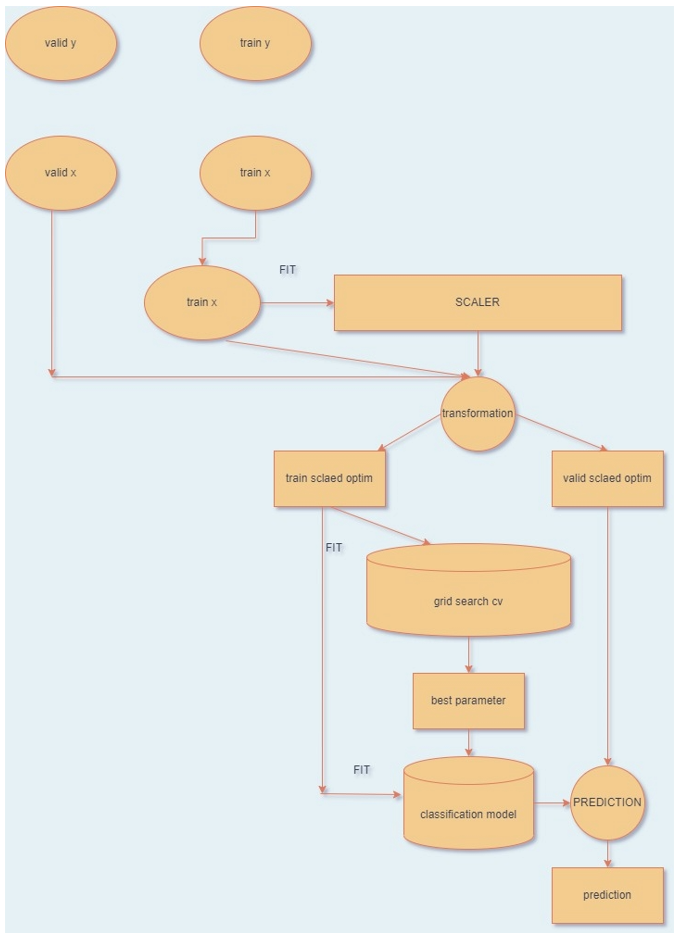

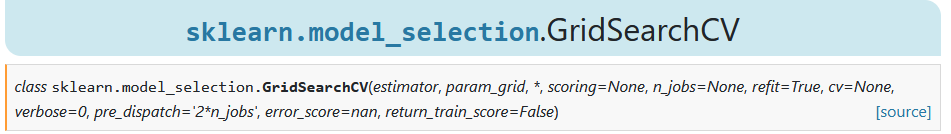

**The best way to use tge grid seach cv is to use it's methods***

Here we will use estimator, param_grid, scoring, cv, n_jobs = 1

In [93]:
from sklearn.model_selection import GridSearchCV

**List of all parameters for the hyper parameter tuning**

In [94]:
knn_parameters = {'n_neighbors':(2, 15), 'algorithm':("ball_tree", "kd_tree"), 
                                         'leaf_size':(30, 50)}
svm_parameters = {"C": (1.0, 50.0), 'kernel':('linear', 'rbf', 'poly'),
                 'degree':(3, 5)}
sgd_parameters = {"loss": ["log_loss"], "penalty": ("l2", "l1", "elasticnet"),
                          "alpha": [2**(x) for x in range(-4, 4)], 
                          "learning_rate": ["optimal"], "random_state":[x for x in range(10, 20)]}
dtree_parameters = {"criterion":("gini", "entropy"), "max_depth":(2, 50), "min_samples_split":(2, 50), 
                  "min_samples_leaf":(2, 50), "max_leaf_nodes":(2, 50)}

**Scoring metrics for the Grid seach CV**

In [95]:
scoringmetrics = ["accuracy", "balanced_accuracy", "roc_auc"]

**Model names**

In [96]:
modelnames_ = ["knn", "svm", "sgd", "dtree"]

In [97]:
def models_(modelname, modelparameter, Xtrain, Ytrain, Xvalid):
    '''Function for prediction
    modelname: name of the model
    modelparamter: model best parameter 
    Xtrain: X train data
    Ytrain: Ytrain data
    Xvalid: Xvalidation data
    '''
    if modelname=="knn":
        clf = KNeighborsClassifier(**modelparameter).fit(Xtrain, Ytrain)
        pred_ = clf.predict(Xvalid)
        return pred_ 
    if modelname=="svm":
        clf = SVC(**modelparameter).fit(Xtrain, Ytrain)
        pred_ = clf.predict(Xvalid)
        return pred_ 
    if modelname=="sgd":
        clf = SGDClassifier(**modelparameter).fit(Xtrain, Ytrain)
        pred_ = clf.predict(Xvalid)
        return pred_ 
    if modelname=="dtree":
        clf = DecisionTreeClassifier(**modelparameter).fit(Xtrain, Ytrain)
        pred_ = clf.predict(Xvalid)
        return pred_ 

In [100]:
def metrics_(metricname, ytrue, ypred):
    '''Performance metrics
    
    metricname: name of the performance metrics
    ytrue: true values
    ypred: predicted values
    '''
    if metricname=="accuracy":
        score = accuracy_score(ytrue, ypred)
        return score 
    if metricname == "balanced_accuracy":
        score = balanced_accuracy_score(ytrue, ypred)
        return score  
    if metricname =="roc_auc":
        score = roc_auc_score(ytrue, ypred)
        return score 

In [101]:
from tqdm.notebook import tqdm 

In [102]:
def confusionmatrix_heatmap(ytrue, ypred):
    '''Function for plotting confusion matrix heat map
        ytrue: true values
    ypred: predicted values
    '''
    plt.figure(figsize=(4,5))
    sns.heatmap(confusion_matrix(ytrue, ypred), annot=True,cmap="YlGnBu")
    plt.title("Confusion matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show() 

    plt.figure(figsize=(4,5))
    sns.heatmap(confusion_matrix(ytrue, ypred, normalize='true'), annot=True,cmap="BuPu")
    plt.title("Normalised Confusion matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

**<font color="purple">WE WILL DIVIDE THE TRAIN DATA INTO TRAIN AND VALIDATION WITH SCALING</font>**

In [109]:
# dividing the train data into validation data 
train_x, valid_x, train_y, valid_y = train_test_split(xtrain, ytrain, test_size=0.2, stratify=ytrain, 
                                                     shuffle=True, random_state=53)

In [110]:
# scaled data

scaler_optim = preprocesser(train_x, preprocess_pipeline)
scaler_fit_optim = scaler_optim.fit_scaling()
train_x_scaled_optim = scaler_optim.tranform_scaling(train_x)
valid_x_scaled_optim = scaler_optim.tranform_scaling(valid_x)

Model name =  knn
Metric:  accuracy
Validation score: 95.83%
=================================CLIENT CRITERIA 1==============================================
Out of 23 malignant data total of 22 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 95.65217391304348%
=================================CLIENT CRITERIA 2==============================================
Out of 25 data total of 1 data are misclassified as Malignant instead of Benign


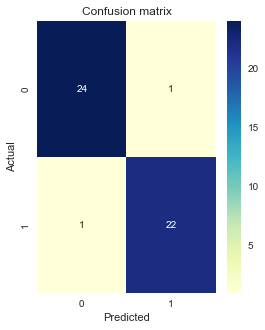

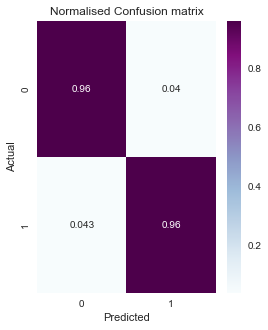

Best parameter:  {'algorithm': 'ball_tree', 'leaf_size': 30, 'n_neighbors': 15}
-------------------------------------------------------------------------------------
Model name =  knn
Metric:  balanced_accuracy
Validation score: 95.83%
=================================CLIENT CRITERIA 1==============================================
Out of 23 malignant data total of 22 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 95.65217391304348%
=================================CLIENT CRITERIA 2==============================================
Out of 25 data total of 1 data are misclassified as Malignant instead of Benign


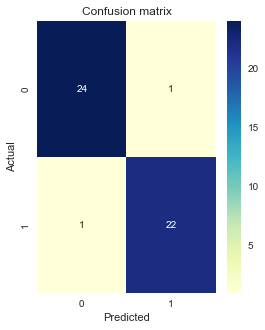

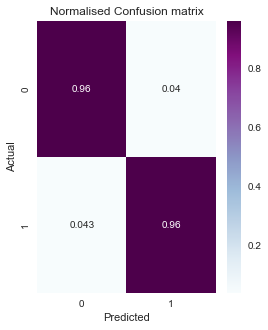

Best parameter:  {'algorithm': 'ball_tree', 'leaf_size': 30, 'n_neighbors': 15}
-------------------------------------------------------------------------------------
Model name =  knn
Metric:  roc_auc
Validation score: 95.83%
=================================CLIENT CRITERIA 1==============================================
Out of 23 malignant data total of 22 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 95.65217391304348%
=================================CLIENT CRITERIA 2==============================================
Out of 25 data total of 1 data are misclassified as Malignant instead of Benign


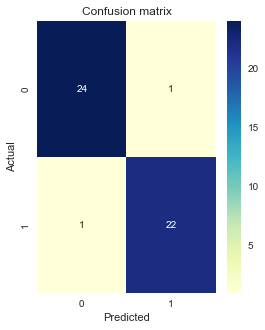

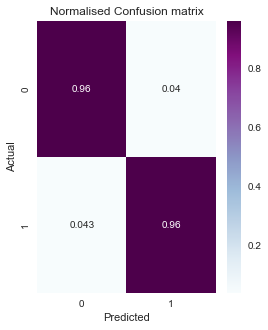

Best parameter:  {'algorithm': 'ball_tree', 'leaf_size': 30, 'n_neighbors': 15}
-------------------------------------------------------------------------------------
Model name =  svm
Metric:  accuracy
Validation score: 93.75%
=================================CLIENT CRITERIA 1==============================================
Out of 23 malignant data total of 22 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 95.65217391304348%
=================================CLIENT CRITERIA 2==============================================
Out of 25 data total of 2 data are misclassified as Malignant instead of Benign


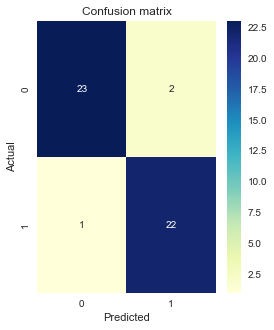

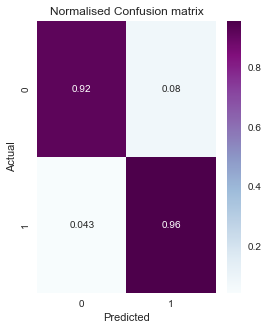

Best parameter:  {'C': 50.0, 'degree': 3, 'kernel': 'rbf'}
-------------------------------------------------------------------------------------
Model name =  svm
Metric:  balanced_accuracy
Validation score: 93.83%
=================================CLIENT CRITERIA 1==============================================
Out of 23 malignant data total of 22 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 95.65217391304348%
=================================CLIENT CRITERIA 2==============================================
Out of 25 data total of 2 data are misclassified as Malignant instead of Benign


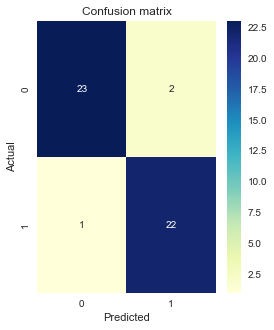

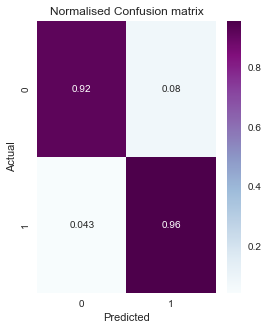

Best parameter:  {'C': 50.0, 'degree': 3, 'kernel': 'rbf'}
-------------------------------------------------------------------------------------
Model name =  svm
Metric:  roc_auc
Validation score: 91.83%
=================================CLIENT CRITERIA 1==============================================
Out of 23 malignant data total of 22 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 95.65217391304348%
=================================CLIENT CRITERIA 2==============================================
Out of 25 data total of 3 data are misclassified as Malignant instead of Benign


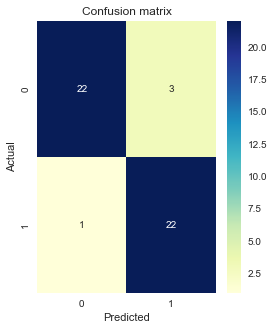

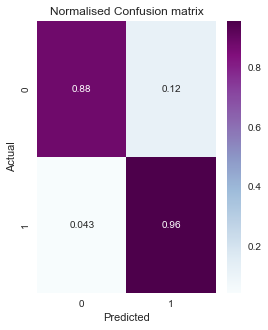

Best parameter:  {'C': 1.0, 'degree': 3, 'kernel': 'rbf'}
-------------------------------------------------------------------------------------
Model name =  dtree
Metric:  accuracy
Validation score: 81.25%
=================================CLIENT CRITERIA 1==============================================
Out of 23 malignant data total of 16 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 69.56521739130434%
=================================CLIENT CRITERIA 2==============================================
Out of 25 data total of 2 data are misclassified as Malignant instead of Benign


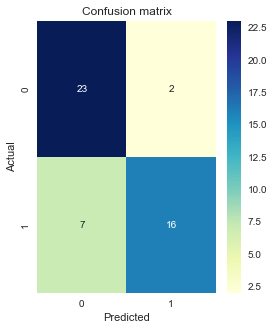

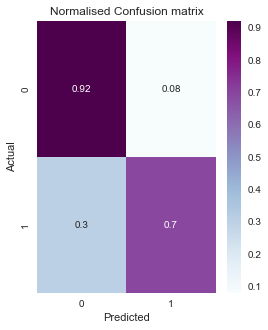

Best parameter:  {'criterion': 'gini', 'max_depth': 50, 'max_leaf_nodes': 50, 'min_samples_leaf': 2, 'min_samples_split': 50}
-------------------------------------------------------------------------------------
Model name =  dtree
Metric:  balanced_accuracy
Validation score: 85.13%
=================================CLIENT CRITERIA 1==============================================
Out of 23 malignant data total of 18 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 78.26086956521739%
=================================CLIENT CRITERIA 2==============================================
Out of 25 data total of 2 data are misclassified as Malignant instead of Benign


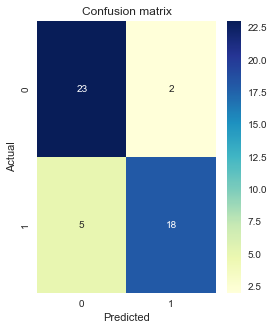

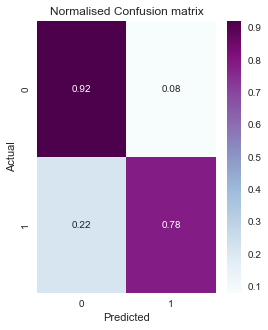

Best parameter:  {'criterion': 'gini', 'max_depth': 50, 'max_leaf_nodes': 50, 'min_samples_leaf': 2, 'min_samples_split': 50}
-------------------------------------------------------------------------------------
Model name =  dtree
Metric:  roc_auc
Validation score: 81.65%
=================================CLIENT CRITERIA 1==============================================
Out of 23 malignant data total of 21 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 91.30434782608695%
=================================CLIENT CRITERIA 2==============================================
Out of 25 data total of 7 data are misclassified as Malignant instead of Benign


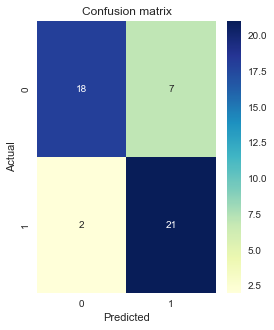

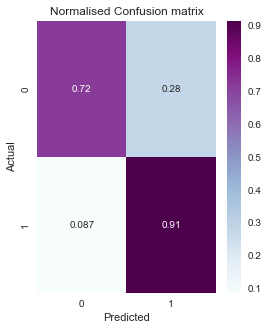

Best parameter:  {'criterion': 'entropy', 'max_depth': 50, 'max_leaf_nodes': 50, 'min_samples_leaf': 2, 'min_samples_split': 50}
-------------------------------------------------------------------------------------
Model name =  sgd
Metric:  accuracy
Validation score: 95.83%
=================================CLIENT CRITERIA 1==============================================
Out of 23 malignant data total of 22 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 95.65217391304348%
=================================CLIENT CRITERIA 2==============================================
Out of 25 data total of 1 data are misclassified as Malignant instead of Benign


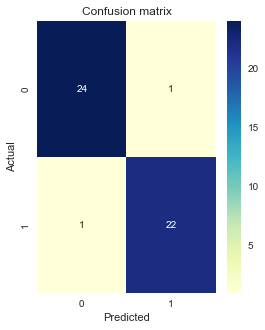

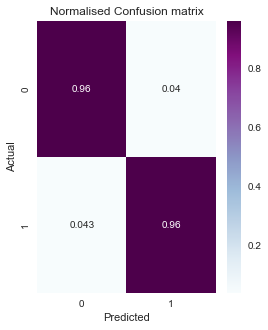

Best parameter:  {'alpha': 0.5, 'learning_rate': 'optimal', 'loss': 'log_loss', 'penalty': 'l2', 'random_state': 18}
-------------------------------------------------------------------------------------
Model name =  sgd
Metric:  balanced_accuracy
Validation score: 95.83%
=================================CLIENT CRITERIA 1==============================================
Out of 23 malignant data total of 22 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 95.65217391304348%
=================================CLIENT CRITERIA 2==============================================
Out of 25 data total of 1 data are misclassified as Malignant instead of Benign


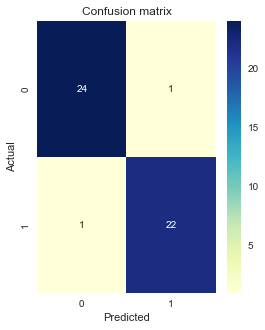

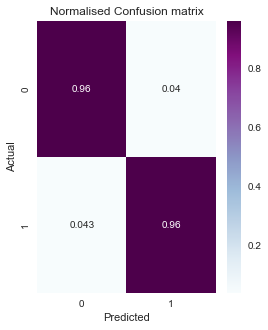

Best parameter:  {'alpha': 0.5, 'learning_rate': 'optimal', 'loss': 'log_loss', 'penalty': 'l2', 'random_state': 18}
-------------------------------------------------------------------------------------
Model name =  sgd
Metric:  roc_auc
Validation score: 98.0%
=================================CLIENT CRITERIA 1==============================================
Out of 23 malignant data total of 23 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 100.0%
=================================CLIENT CRITERIA 2==============================================
Out of 25 data total of 1 data are misclassified as Malignant instead of Benign


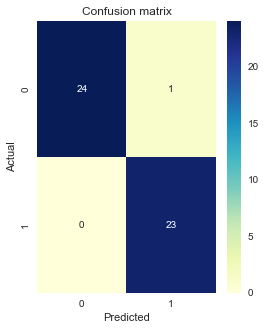

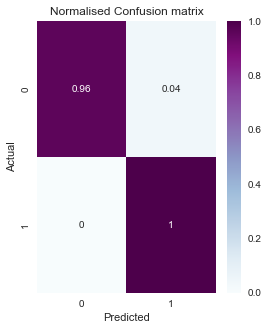

Best parameter:  {'alpha': 0.25, 'learning_rate': 'optimal', 'loss': 'log_loss', 'penalty': 'l2', 'random_state': 14}
-------------------------------------------------------------------------------------


,Model,Metric,Parameters,Validation Score,Client_req_1,Client_req_2
11,sgd,roc_auc,"{'alpha': 0.25, 'learning_rate': 'optimal', 'l...",98.000000,100.000000,1 of 25
0,knn,accuracy,"{'algorithm': 'ball_tree', 'leaf_size': 30, 'n...",95.833333,95.652174,1 of 25
9,sgd,accuracy,"{'alpha': 0.5, 'learning_rate': 'optimal', 'lo...",95.833333,95.652174,1 of 25
1,knn,balanced_accuracy,"{'algorithm': 'ball_tree', 'leaf_size': 30, 'n...",95.826087,95.652174,1 of 25
2,knn,roc_auc,"{'algorithm': 'ball_tree', 'leaf_size': 30, 'n...",95.826087,95.652174,1 of 25
10,sgd,balanced_accuracy,"{'alpha': 0.5, 'learning_rate': 'optimal', 'lo...",95.826087,95.652174,1 of 25
4,svm,balanced_accuracy,"{'C': 50.0, 'degree': 3, 'kernel': 'rbf'}",93.826087,95.652174,2 of 25
3,svm,accuracy,"{'C': 50.0, 'degree': 3, 'kernel': 'rbf'}",93.750000,95.652174,2 of 25
5,svm,roc_auc,"{'C': 1.0, 'degree': 3, 'kernel': 'rbf'}",91.826087,95.652174,3 of 25
7,dtree,balanced_accuracy,"{'criterion': 'gini', 'max_depth': 50, 'max_le...",85.130435,78.260870,2 of 25


In [111]:
# Optimisation method

# report of the optimisation for each model
report_ = []

# for loop for looping the data
for mname, modelpipeline, modelparameters in zip(["knn", "svm", "dtree", "sgd"],
                                                 [knn_pipeline, svc_pipeline, dtree_pipeline, sgd_pipeline],
                                                 [knn_parameters, svm_parameters, dtree_parameters, sgd_parameters]):
    # model 
    model = modelpipeline[0]
    
    # looping the performance metrics
    for perfmetric in scoringmetrics:
        
        # Grid search Cv hyper parameter tuning
        optim_ = GridSearchCV(model, modelparameters, scoring=perfmetric, n_jobs=1)
        optim_.fit(train_x_scaled_optim, train_y)
        # best parameter
        best_parameters = optim_.best_params_
        # prediction
        best_prediction = models_(mname, best_parameters, train_x_scaled_optim, train_y, valid_x_scaled_optim)
        # validation metric
        valid_metric = metrics_(perfmetric, valid_y, best_prediction)*100
        print("Model name = ", mname)
        print("Metric: ", perfmetric)
        print("Validation score: {}%".format(round(valid_metric,2)))
        # client requirements both 1 and 2
        c1_df, c1_acc_malig, c1_tot_act_malig, c1_tot_pred_malig = clientcriteria_1(valid_y, best_prediction)
        c2_df, c2_tot_malig, c2_tot_benign = clientcriteria_2(valid_y, best_prediction)
        c2_prop = str(c2_tot_malig)+" of "+str(c2_tot_benign)
        # confusion matrix in heatmap
        confusionmatrix_heatmap(valid_y, best_prediction)
        print("Best parameter: ", best_parameters)
        print("-------------------------------------------------------------------------------------")
        report_.append([mname, perfmetric, best_parameters, valid_metric, c1_acc_malig, c2_prop])
        
# optimization report        
df_report = pd.DataFrame(data=report_, columns=["Model", "Metric", "Parameters", "Validation Score",
                                               "Client_req_1", "Client_req_2"])

# sort the optimization using validation score
df_report = df_report.sort_values(by="Validation Score", ascending=False)
df_report

**<font color="purple">Top 3 best models</font>**

In [112]:
cols_ = df_report.columns
top_3 = df_report.iloc[:3]
for c in top_3.index:
    print("Model name: ", top_3["Model"].loc[c])
    print("Mode metric: ", top_3["Metric"].loc[c])
    print("Model validation score: ", top_3["Validation Score"].loc[c])
    print("Client requirement 1 satisifaction: ", top_3["Client_req_1"].loc[c])
    print("Client requirement 2 satisfaction: ", top_3["Client_req_2"].loc[c])
    print("Model best parameter: ")
    print(top_3["Parameters"].loc[c])
    print("----------------------------------------------------------------------------")
    print()

Model name:  sgd
Mode metric:  roc_auc
Model validation score:  98.0
Client requirement 1 satisifaction:  100.0
Client requirement 2 satisfaction:  1 of 25
Model best parameter: 
{'alpha': 0.25, 'learning_rate': 'optimal', 'loss': 'log_loss', 'penalty': 'l2', 'random_state': 14}
----------------------------------------------------------------------------

Model name:  knn
Mode metric:  accuracy
Model validation score:  95.83333333333334
Client requirement 1 satisifaction:  95.65217391304348
Client requirement 2 satisfaction:  1 of 25
Model best parameter: 
{'algorithm': 'ball_tree', 'leaf_size': 30, 'n_neighbors': 15}
----------------------------------------------------------------------------

Model name:  sgd
Mode metric:  accuracy
Model validation score:  95.83333333333334
Client requirement 1 satisifaction:  95.65217391304348
Client requirement 2 satisfaction:  1 of 25
Model best parameter: 
{'alpha': 0.5, 'learning_rate': 'optimal', 'loss': 'log_loss', 'penalty': 'l2', 'random_sta

**Analysing Best model**

* Model name:  sgd
* Mode metric:  roc_auc
* Model validation score:  98.0
* Client requirement 1 satisifaction:  100.0
* Client requirement 2 satisfaction:  1 of 25
* Model best parameter: 
{'alpha': 0.25, 'learning_rate': 'optimal', 'loss': 'log_loss', 'penalty': 'l2', 'random_state': 14}


The best model has obtained 98% AUC score in predicting the validation data correctly. 
Furthermore, the model has satisfied the all client requirements. That is, having 95% accuracy score for predicting the maliganant when malignant is present, whereas, requirement was to have only 1 misclassification as malignant in 10 benign data, and here we have only 1 misclassification out of 25 benign data.

From the analysis of normalised confusion matrix, we can see that, The model has no **False Negative** which is important that the doctor does not diagnoise teh patient wrong. The true negative has 0.96 probablity, where as model has failed in **False positive** with the probablity of 0.04.

Whereas, the best parameter has random state 14, alpha as 0.25, learning rate as optimal, and loss as log loss with penalty of l2.

* From the above analysis of hyper-parameter optimization we can see that, 
    - The Stochastic gradient descent model with accuracy metric as AUC has obtained 98% score in validation data, and this model with parameter has satisfied the both the clients requirement. That is, having 95% accuracy score for predicting the maliganant when malignant is present, whereas, requirement was to have only 1 misclassification as malignant in 10 benign data, and here we have only 1 misclassification out of 25 benign data.
    
    - All the top 3 models satisfy the clients requirements. Hence we can say that these models are the best.
    - The stochastic gradient descent models work equivalently, however the parameter is little chnage in alpha and random state. But the model works similarly. Whereas, KNN model is different than the SGD.

### <font color="purple">2.7 Model selection [1 mark]</font>

<font color="purple">**Choose the best classifier** (as seen in workshops 3 to 6) and give details of your hyperparameter settings. **Explain the reason for your choice.**</font>

**Steps for solving**

workflow is smilar to the earlier training method 

Earlier, we know that SGD classifier had the best validation score. However, to choose model selection we will do the Stratified Kfold cross validation to find the best model.

The selected model will be the best model with corresponding best parameter.

We know that in top 3 models we had 2 models from SGD and one model from KNN. We will use those model for further experiment.

In [116]:
# best model parameters
sgd_model_para_1 = top_3["Parameters"].iloc[0]
sgd_model_para_2 = top_3["Parameters"].iloc[-1]
knn_model_para = top_3["Parameters"].iloc[1]

In [117]:
k = 10
# model data
sgd1_acc, sgd1_balance_acc, sgd1_auc = [], [], []
sgd2_acc, sgd2_balance_acc, sgd2_auc = [], [], []
knn_acc, knn_balance_acc, knn_auc = [], [], []
for mname, modelpara, modelpipelines_ in zip(["sgd1", "sgd2", "knn"],
                                            [sgd_model_para_1, sgd_model_para_2, knn_model_para],
                                            [sgd_pipeline, sgd_pipeline, knn_pipeline]):
    
    # model
    model_ = modelpipelines_[0]
    # set the optimised para
    model_.set_params(**modelpara)
    
    # stratified k fold split
    skf_ = StratifiedKFold(n_splits=k, shuffle=True)
    
    # iteration for kfold
    for train_ix, test_ix in skf_.split(xtrain, ytrain):
        # extracting all the x values for train and validation using train and valid index from the loop
        x_train, x_valid = xtrain[train_ix], xtrain[test_ix]
        # extracting all the y values for train and validation using train and valid index from the loop
        y_train, y_valid = ytrain[train_ix], ytrain[test_ix]
        # scaling the train x and valid x values
        scaler = preprocesser(x_train, preprocess_pipeline)
        scaler_fit = scaler.fit_scaling()
        # transform x train using sclaer transformation obtained from x train
        train_scaled = scaler.tranform_scaling(x_train)
        # transform x valid using sclaer transformation obtained from x train
        valid_scaled = scaler.tranform_scaling(x_valid)
        # using the extracted values in the model
        clf = model_.fit(train_scaled, y_train)
        # predeiction
        pred = clf.predict(valid_scaled)
        # appending the performance metrics
        if mname=="sgd1":
            sgd1_acc.append(accuracy_score(y_valid, pred)*100)
            sgd1_balance_acc.append(balanced_accuracy_score(y_valid, pred)*100)
            sgd1_auc.append(roc_auc_score(y_valid, pred)*100)
        elif mname=="sgd2":
            sgd2_acc.append(accuracy_score(y_valid, pred)*100)
            sgd2_balance_acc.append(balanced_accuracy_score(y_valid, pred)*100)
            sgd2_auc.append(roc_auc_score(y_valid, pred)*100)
        elif mname=="knn":
            knn_acc.append(accuracy_score(y_valid, pred)*100)
            knn_balance_acc.append(balanced_accuracy_score(y_valid, pred)*100)
            knn_auc.append(roc_auc_score(y_valid, pred)*100)
            
model_sel = pd.DataFrame(index=["SGD 1", "SGD 2", "KNN"], columns=["Accuracy score",
                                                                "Balanced Accuracy score",
                                                                  "AUC Score"])
model_sel["Accuracy score"].loc["SGD 1"] = round(np.mean(sgd1_acc),2)
model_sel["Balanced Accuracy score"].loc["SGD 1"] = round(np.mean(sgd1_balance_acc),2)
model_sel["AUC Score"].loc["SGD 1"] = round(np.mean(sgd1_auc),2)

model_sel["Accuracy score"].loc["SGD 2"] = round(np.mean(sgd2_acc),2)
model_sel["Balanced Accuracy score"].loc["SGD 2"] = round(np.mean(sgd2_balance_acc),2)
model_sel["AUC Score"].loc["SGD 2"] = round(np.mean(sgd2_auc),2)

model_sel["Accuracy score"].loc["KNN"] = round(np.mean(knn_acc),2)
model_sel["Balanced Accuracy score"].loc["KNN"] = round(np.mean(knn_balance_acc),2)
model_sel["AUC Score"].loc["KNN"] = round(np.mean(knn_auc),2)

model_sel

,Accuracy score,Balanced Accuracy score,AUC Score
SGD 1,95.83,95.8,95.8
SGD 2,92.5,92.42,92.42
KNN,93.33,93.26,93.26


In [115]:
# best model parameter

best_model_para_ = top_3["Parameters"].iloc[0]
best_model_para_

{'alpha': 0.25,
 'learning_rate': 'optimal',
 'loss': 'log_loss',
 'penalty': 'l2',
 'random_state': 14}

**From the above experiement we can confirm that SGD model 1 has good scoring comapred to other model. Therefore, we will use this model as our final model selection**

**We can see that, SGD 1 model has accuracy score of 95.83% while oyher model has 92.5% and 93.3%. Hence we can say that SGD 1 is performing well in the accuracy score. Furthemore, we can observe that In balanced accuracy score, SGD 1 model has 95.8% score whereas, othe model like SGD 2 and KNN has 92.42% and 93.26% which is smaller than the SGD 1. Hence we can again say that SGD 1 is performing well in Balanced accuracy scores. Moreover, we can see that in AUC SCORE, the SGD 1 model has 95.8% AUC score, whereas, models like SGD 2 and KNN has 92.472% and 93.26%, which is smaller than the SGD 1. Hence we can say that SGD 1 is perforing really good compared all other models**

* From the above table, we can see that the best model out of three after performing cross validation is the stochastic gradient descent with following parameter:


**Best model parameter**
***
* model name: Stochastic Gradient descent 
* alpha = 0.25
* Learning rate: Optimal
* Loss: Log loss 
* Penalty: l2 
* random_state: 14

### <font color="purple">2.8 Final performance [1.5 marks]</font>

**Calculate and display an unbiased performance measure that you can present to the client.**

**Is your chosen classifier underfitting or overfitting?**

**Does your chosen classifier meet the client's performance criteria?**

**In this section, we will use our hidden test data to analyse the performance**

**STeps for solving**

* **Step 1: Extract the test data**
* **Step 2: Scale the test data through the train data**
* **Step 3: Craete the best model pipeline**
* **Step 4: Train and predict the data using the hidden test data and best model**

**Scale the test data**

In [124]:
# scaling the train x and valid x values
scaler = preprocess_pipeline[2]
scaler_fit = scaler.fit(xtrain)
# transform x train using sclaer transformation obtained from x train
train_scaled = scaler.transform(xtrain)
# transform x test using sclaer transformation obtained from x train
test_scaled = scaler.transform(xtest)

**Best model parameter**

In [125]:
# best parameter from the previous analysis
model_sel_para = top_3["Parameters"].iloc[0]

**Train and test the hidden test data**

In [126]:
clf_best = SGDClassifier(**model_sel_para).fit(train_scaled, ytrain)
pred_best = clf_best.predict(test_scaled)

**Analyse the performance**

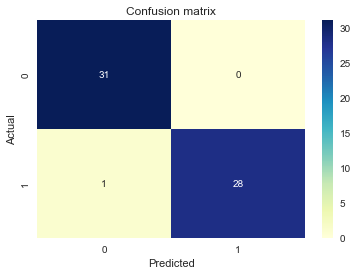

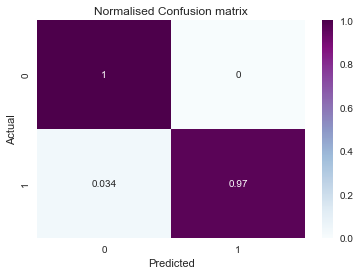

Accuracy score for predicting the test data: 98.33333333333333%
Balanced  Accuracy score for predicting the test data: 98.27586206896552%
AUC score for predicting the test data 98.27586206896552%
=================================CLIENT CRITERIA 1==============================================
Out of 29 malignant data total of 28 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 96.55172413793103%
=================================CLIENT CRITERIA 2==============================================
Out of 31 data total of 0 data are misclassified as Malignant instead of Benign


In [129]:
# performance report
df_best, a, ba, rs, ps, auc_, f1s, fbeta_10, fbeta_01, f1micro, f1macro  = getallmetric(ytest, pred_best)
print("Accuracy score for predicting the test data: {}%".format(a))
print("Balanced  Accuracy score for predicting the test data: {}%".format(ba))
print("AUC score for predicting the test data {}%".format(auc_))

# client requirements
c1_df_best, c1_best_acc, c1_best_actualmalig, c1_pred_malig_best = clientcriteria_1(ytest, pred_best)
c2_df_best, c2_malig_best, c2_benig_best =clientcriteria_2(ytest, pred_best)

* **From the above analysis, we can see that**
    - Our best model has predicted good on testing data. Therefore we cans ay that the our model is not underfitting or overfitting. INstead it is predicting good.
    - We know from earlier that, our validation score was around 95-96% and our baseline model score was about 93%. Here we can clearly see that our precition is 98.3% which is greater than our validation score and baseline model score. Therefore we could say that model is performing really good.
    - **<font color="purple">Client requirement 1</font>**
    - **From the above ananlysis, we can see that we had 29 malignant cases, and out of 29 cases our model has predicted 28 maliganant case and only one maliganant case was failed to detect, hence we have probablity of 96.55% for detecting the maliganant cases, when the malignant casesa are present. Therefore we can say that our model is supporting the client's first requirement**
    - **<font color="purple">Client requirement 2</font>**
    - **From ther above ananlysis, we can see that we had 31 total benign cases,, and out of 31 we have not misclassified any data as malignant. Since, we had requirement saying that we could only misclassify one data in benign as malignant, we have not done any misclassification. Therefore, we can say that our model is supporting the clients second requirement**

**Best model pipeline**

In [133]:
best_classifer_ = Pipeline(steps=[('standardscaler', scaler),
                          ("clf", clf_best)])

## 3. Decision Boundaries (15% = 4.5 marks)

### <font color="purple">3.1 Rank features [1 mark]</font>

<font color="purple">Although it is only possible to know the true usefulness of a feature when you've combined it with others in a machine learning method, it is still helpful to have some measure for how discriminative each feature is on its own.  One common method for doing this is to calculate a T-score (often used in statistics, and in the LDA machine learning method) for each feature.</font> 

<font color="purple">The formula for the T-score is (mean(x2) - mean(x1))/(0.5*(stddev(x2) + stddev(x1))), where x1 and x2 are the datasets corresponding to the two classes. Large values for the T-score (either positive or negative) indicate discriminative ability.</font>

**<font color="purple">Calculate the T-score for each feature and print out the best 4 features according to this score.</font>**

**Steps to solve the problem**

* Calculate the all T-score for features with each classes
* Sort the feature with high T scores
* Extarct the top 4 features with corresponding to it's feature name

**Here, I will use only the train data because, we should not involve any test data during the feature ranking, otherwise it is a data leakage**

**since class 1 is benign and class 2 is malignant, X2 is malignant data and x1 is benign data**

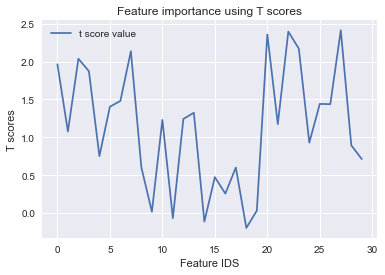

,Feature ID,feature name,T scores
27,27,worst concave points,2.414371
22,22,worst perimeter,2.396298
20,20,worst radius,2.358595
23,23,worst area,2.172233
7,7,mean concave points,2.137019
2,2,mean perimeter,2.038001
0,0,mean radius,1.964342
3,3,mean area,1.873033
6,6,mean concavity,1.480325
25,25,worst compactness,1.441100


In [134]:
# T scores

# save all t scores of features
tscores_ = []

# feature names
cols_name = data.columns[1:]
feats = xtrain.shape[1]

# looping the each feature
for i in range(feats):
    # extarct individual feature
    X_ = xtrain[:, i]
    # extract the benign data
    Xbenign = X_[ytrain==0]
    # extarct the maligannt data
    Xmalig = X_[ytrain==1]
    # mean values and standard deviation for t score
    benign_mu, malig_mu = np.mean(Xbenign), np.mean(Xmalig)
    std_benign, std_malig = np.std(Xbenign), np.std(Xmalig)
    # t score
    tscore = (malig_mu - benign_mu)/(0.5*(std_malig+std_benign))
    tscores_.append(tscore)
    
# data frame for t score 
df_tscore = pd.DataFrame()
df_tscore["Feature ID"] = [x for x in range(feats)]
df_tscore["feature name"] = cols_name
df_tscore["T scores"] = tscores_

# sort the data with heigh t score
df_tscore = df_tscore.sort_values(by="T scores", ascending=False)

# plot for t scores
plt.plot(tscores_, label="t score value")
plt.title("Feature importance using T scores")
plt.xlabel("Feature IDS")
plt.ylabel("T scores")
plt.legend()
plt.show()

df_tscore

**Extracting best 4 feature from the T score data**

In [135]:
df_tscore.iloc[:4, ]

,Feature ID,feature name,T scores
27,27,worst concave points,2.414371
22,22,worst perimeter,2.396298
20,20,worst radius,2.358595
23,23,worst area,2.172233


**From the above analysis, we can see that we have obtained 4 best features:**
- **Worst concave points** with 2.4143 as t score
- **Worst perimeter** with 2.396 as t score
- **Worst radius** with 2.3585 as t score
- **Worst areas** with 2.172 as t score

### <font color="purple">3.2 Visualise decision boundaries [2.5 marks]</font>

<font color="purple">**Display the decision boundaries** for each pair of features from the best 4 chosen above.  You can use the functions below to help (taken from workshop 6).</font>

<font color="purple">Instead of using the simple mean as the input for `xmean` in `plot_contours`, use the following: 0.5*(mean(x1) + mean(x2)), where x1 and x2 are the data associated with the two classes.  This way of calculating a "mean" point takes into account any imbalance between the classes.</font>

In [136]:
def make_meshgrid(x, y, ns=100):
    """Create a mesh of points to plot in

    Parameters
    ----------
    x: data to base x-axis meshgrid on (only min and max used)
    y: data to base y-axis meshgrid on (only min and max used)
    ns: number of steps in grid, optional

    Returns
    -------
    xx, yy : ndarray
    """
    x_min, x_max = x.min(), x.max()
    y_min, y_max = y.min(), y.max()
    hx = (x_max - x_min)/ns
    hy = (y_max - y_min)/ns
    xx, yy = np.meshgrid(np.arange(x_min, x_max + hx, hx), np.arange(y_min, y_max + hy, hy))
    return xx, yy

In [137]:
def plot_contours(clf, xx, yy, xmean, n1, n2, **params):
    """Plot the decision boundaries for a classifier.

    Parameters
    ----------
    clf: a classifier
    xx: meshgrid ndarray
    yy: meshgrid ndarray
    xmean : 1d array of mean values (to populate constant features with)
    n1, n2: index numbers of features that change (for xx and yy)
    params: dictionary of params to pass to contourf, optional
    """
    # The following lines makes an MxN matrix to pass to the classifier (# samples x # features)
    # It does this by multiplying Mx1 and 1xN matrices, where the former is filled with 1's
    #  where M is the number of grid points in xx and N is the number of features in xmean
    #  It is done in such a way that the xmean vector is replaced in each row
    fullx = np.ones((xx.ravel().shape[0],1)) * np.reshape(xmean, (1, -1)) #np.array(xmean.reshape(1,-2))
    fullx[:,n1] = xx.ravel()
    fullx[:,n2] = yy.ravel()
    Z = clf.predict(fullx)
    Z = Z.reshape(xx.shape)
    out = plt.contourf(xx, yy, Z, **params)
    return out

**Using the original data to avoid conufusion**

In [138]:
# original data
df_db = data.copy()
# labeling th etarget numerically
df_db["label"] = np.where(df_db["label"]=="malignant", 1, 0)
# X and Y values
X_feature = df_db.iloc[:, 1:].values 
Y_feature = df_db.iloc[:, 0].values

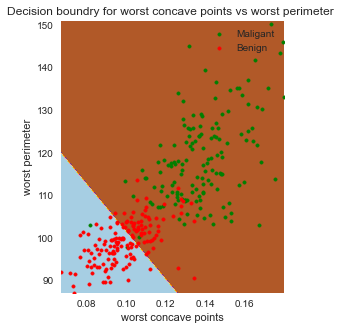

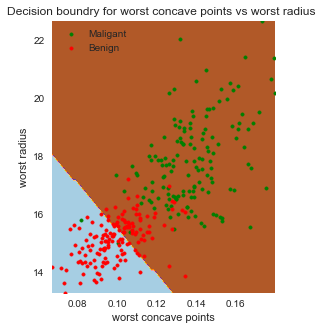

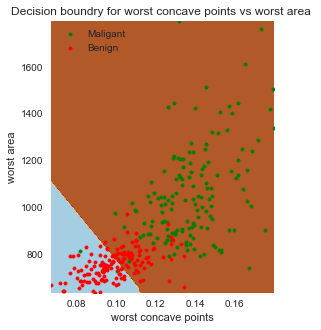

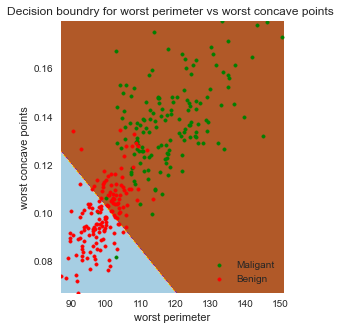

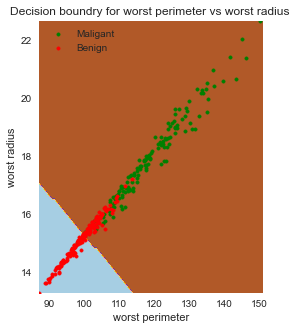

...

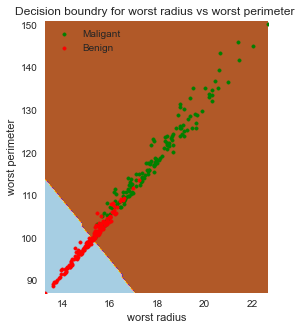

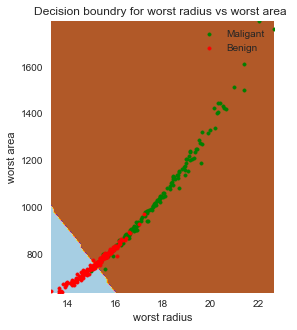

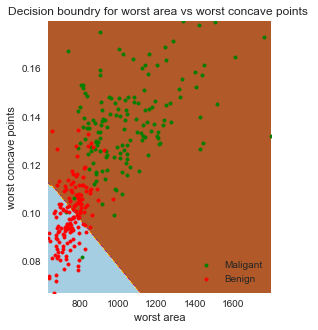

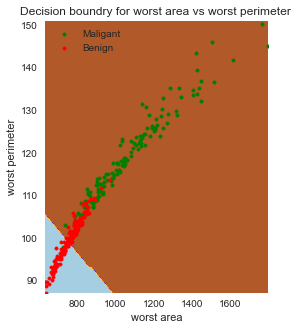

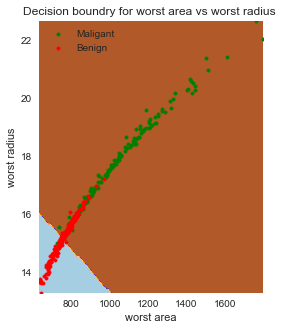

In [142]:
# Decision boudnry method

# extarct the feature id from the t score
best_features_id = list(df_tscore.iloc[:4, ]["Feature ID"])

# extarct the feature name accorindg the to best feature id
features_names_ = data.columns[1:]

# loop th best feature id
for ix in best_features_id:
    for iy in best_features_id:
        # do no select the same feature
        if ix!=iy:
            # x1 data
            x1 = X_feature[:, ix]
            # x2 data
            x2 = X_feature[:, iy]
            # minimum and maximum values for meshgrid
            x1_min, x1_max = np.min(x1), np.max(x1)
            x2_min, x2_max = np.min(x2), np.max(x2)
            xx, yy = make_meshgrid(np.array([x1_min, x1_max]),np.array([x2_min, x2_max]))
            # bening data
            benign = Y_feature==0
            # malignant data
            malig = Y_feature==1
            # extarct the rows of bening
            Xbenig = X_feature[benign,:]
            # extract the all the rows of maligannt
            Xmalig = X_feature[malig, :]
            # mean
            xmean = 0.5*(np.mean(Xbenig,axis=0) + np.mean(Xmalig,axis=0))
            # plotting
            plt.figure(figsize=(4, 5))
            plot_contours(best_classifer_, xx, yy, xmean, ix, iy, cmap=plt.cm.Paired)
            plt.scatter(x1[malig],x2[malig],color='green',marker='.', label="Maligant")
            plt.scatter(x1[benign],x2[benign],color='red',marker='.', label="Benign")
            plt.xlabel(features_names_[ix])
            plt.ylabel(features_names_[iy])
            plt.legend()
            plt.title("Decision boundry for {} vs {} ".format(features_names_[ix], features_names_[iy]))
            plt.show()

* **From the above analysis, we can see that:**
    - **Boudnries are linearly seperable** 
    - **In this analysis, we have Maligant as green and Benign as Red.**
    - **Due to the linear seperablity property, we can observe that these features has good information content, because there is not much randomness involved.**
    - **However, we can  see that few data points of Benign are away from the boundry, and these points are interseaction points of malignant.** 
    - **There is a intersection because, maliganant and benign are cancer cells and their radius has similar dimension, but malignant is bit larger than the benign. Hence some of the data are also seen in those areas.**
     

### <font color="purple">3.3 Interpretation [1 mark]</font>

 <font color="purple">From the decision boundaries displayed above, **would you expect the method to extrapolate well or not**?  Give reasons for your answer.</font>

**It is not possible to clearly use extrapolate**

Here are my possible reasons:

**From the decision boudry we can see that some of the benign (red) data is away from the boudnry line, and it is within the malignant data, hence there is a confusion while extrapoaltion to choose the classes. Because consider a case: Worst area vs Worst radius,
we can se ethat  if the values of worst area is away from the 1200 we can say that these are Maliganant but when the values are within the 800 and 1200 it is difficult because both the maliganant and benign is togetehr. Therefore it is not easy to exterapolation***

**From the above analysis, we can see that we have used Stochastic Gradient Descent model, and we know that during the gradient descent we find many local minima and very difficult to find global minima. Using extrapolation for further prediction using the given data is not possible because of many randomness involved**

**Consider, we are using KNN model, during this we cannot use extrapolation because, the model is lazy and has no parameter, and there could be a randoness imvolved. Hence it is not possible to use the deciosion boudry to extrpolate**

## 4. <font color="purple">Second Round (15% = 4.5 marks)</font>

<font color="purple">After presenting your initial results to the client they come back to you and say that they have done some financial analysis and it would save them a lot of time and money if they did not have to analyse every cell, which is needed to get the "worst" features. Instead, they can quickly get accurate estimates for the "mean" and "standard error" features from a much smaller, randomly selected set of cells.</font>

<font color="purple">They ask you to **give them a performance estimate for the same problem, but without using any of the "worst" features.**</font>



**<font color="purple">Understanding the client requirement</font>**

Here, client has financial situiation, and want's us to develop the model withouty consideribng the worst features.

**<font color="purple">Step to solve</font>**

0. worksflow for optimimzation similar to the optimimzation
1. Extarct the original data to avoid any confusion
2. Extract only 21 features with label data and do not include any features from worst
3. Divide the data into indendent feature and dependent feature
4. Split the data above from step 3 into train and test data
5. Split the data again for train data from step 4 into train and validation data
6. Scale the train data
7. Scale the validation data from the train data
8. Use the all models, list of parameters to get the best model parameter using Grid search CV
9. Select the model with the best validation score and it's corresponding client's requirement
10. After getting the best parameter and model, use those into train data and predict for test data.
11. Analayse the performance for scores and clients requirement

### <font color="purple">4.1 New estimate [3.5 marks]</font>

**<font color="purple">Calculate an unbiased performance estimate for this new problem, as requested by the client.**</font>

**<font color="darkgreen">To solve this unbiased performance metric we will use the best practise from the earlier sections</font>**

**<font color="darkgreen">The workflow for finding the best model is shown below:</font>**

**STEP 1: Extarct the original data to avoid any confusion**

In [143]:
# STEP 1: Extarct the original data to avoid any confusion 

df_all = data.copy()
df_all["label"] = np.where(df_all["label"]=="malignant", 1, 0)

# STEP 2:Extract only 21 features with label data and do not include any features from worst

df_all = df_all.iloc[:, :21]

In [144]:
# All the features name

df_all.columns

Index(['label', 'mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error', 'fractal dimension error'],
      dtype='object')

In [145]:
# STEP 3: Divide the data into indendent feature and dependent feature
X = df_all.iloc[:, 1:].values 
Y = df_all.iloc[:, 0].values 

print("Total features without worst group is: ", X.shape[1])

Total features without worst group is:  20


In [146]:
# STEP 4: Split the data above from step 3 into train and test data using stratify

xtrain, xtest, ytrain, ytest = train_test_split(X, Y, test_size=0.2, shuffle=True,
                                               random_state=11, stratify=Y)

-----------------------------------------------------------------------------------------------
======================Total class labels for train===================
Total class 1 (Malignant) are:   117
Total class 0 (Benign) are:   123
-----------------------------------------------------------------------------------------------

-----------------------------------------------------------------------------------------------
======================Total class labels for test===================
Total class 1 (Malignant) are:   29
Total class 0 (Benign) are:   31
-----------------------------------------------------------------------------------------------


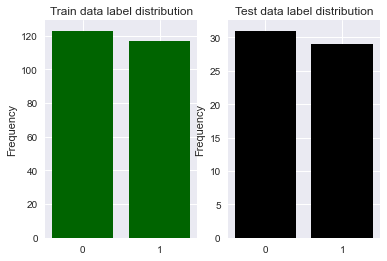

In [147]:
# DATA DISTRIBUTION FROM TEH TRAIN DATA

traincls, trainfreq = np.unique(ytrain, return_counts=True)
testcls, testfreq = np.unique(ytest, return_counts=True)
print("-----------------------------------------------------------------------------------------------")
print("======================Total class labels for train===================")
print("Total class 1 (Malignant) are:  ", trainfreq[1])
print("Total class 0 (Benign) are:  ", trainfreq[0])
print("-----------------------------------------------------------------------------------------------")
print()
print("-----------------------------------------------------------------------------------------------")
print("======================Total class labels for test===================")
print("Total class 1 (Malignant) are:  ", testfreq[1])
print("Total class 0 (Benign) are:  ", testfreq[0])
print("-----------------------------------------------------------------------------------------------")
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.bar(x=[str(x) for x in traincls], height=trainfreq, label="Train", color="darkgreen")
ax2.bar(x=[str(x) for x in testcls], height=testfreq, label="Test", color="black")
ax1.set_title("Train data label distribution")
ax2.set_title("Test data label distribution")
ax1.set_ylabel("Frequency")
ax2.set_ylabel("Frequency")
plt.show()

In [148]:
# STEP 5: Split the data again for train data from step 4 into train and validation data

trainx, validx, trainy, validy = train_test_split(xtrain, ytrain, shuffle=True,
                                                 test_size=0.2, random_state=10,
                                                 stratify=ytrain)

-----------------------------------------------------------------------------------------------
======================Total class labels for train===================
Total class 1 (Malignant) are:   94
Total class 0 (Benign) are:   98
-----------------------------------------------------------------------------------------------

-----------------------------------------------------------------------------------------------
======================Total class labels for test===================
Total class 1 (Malignant) are:   23
Total class 0 (Benign) are:   25
-----------------------------------------------------------------------------------------------


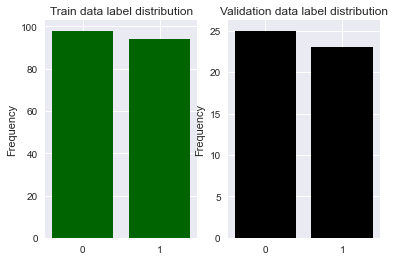

In [149]:
# DATA DISTRIBUTION FROM THE VALIDATION DATA


traincls, trainfreq = np.unique(trainy, return_counts=True)
testcls, testfreq = np.unique(validy, return_counts=True)
print("-----------------------------------------------------------------------------------------------")
print("======================Total class labels for train===================")
print("Total class 1 (Malignant) are:  ", trainfreq[1])
print("Total class 0 (Benign) are:  ", trainfreq[0])
print("-----------------------------------------------------------------------------------------------")
print()
print("-----------------------------------------------------------------------------------------------")
print("======================Total class labels for test===================")
print("Total class 1 (Malignant) are:  ", testfreq[1])
print("Total class 0 (Benign) are:  ", testfreq[0])
print("-----------------------------------------------------------------------------------------------")
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.bar(x=[str(x) for x in traincls], height=trainfreq, label="Train", color="darkgreen")
ax2.bar(x=[str(x) for x in testcls], height=testfreq, label="Validation", color="black")
ax1.set_title("Train data label distribution")
ax2.set_title("Validation data label distribution")
ax1.set_ylabel("Frequency")
ax2.set_ylabel("Frequency")
plt.show()

* For the validation data, we can see that we have 23 maligannt cases and 25 benign cases.
* Datasets are slightly imbalanced

In [150]:
# STEP 6: Scale the train data

scale = preprocesser(trainx, preprocess_pipeline)
scale_fit = scale.fit_scaling()
train_scaled = scale.tranform_scaling(trainx)

# STEP 7: Scale the validation data from the train data

valid_scaled = scale.tranform_scaling(validx)

Model name =  knn
Metric:  accuracy
Validation score: 95.83%
=================================CLIENT CRITERIA 1==============================================
Out of 23 malignant data total of 21 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 91.30434782608695%
=================================CLIENT CRITERIA 2==============================================
Out of 25 data total of 0 data are misclassified as Malignant instead of Benign


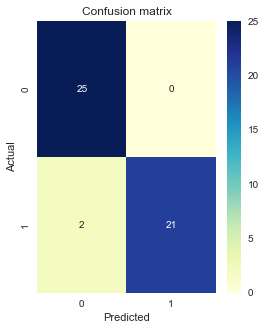

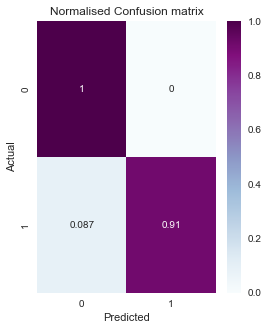

Best parameter:  {'algorithm': 'ball_tree', 'leaf_size': 30, 'n_neighbors': 15}
-------------------------------------------------------------------------------------
Model name =  knn
Metric:  balanced_accuracy
Validation score: 95.65%
=================================CLIENT CRITERIA 1==============================================
Out of 23 malignant data total of 21 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 91.30434782608695%
=================================CLIENT CRITERIA 2==============================================
Out of 25 data total of 0 data are misclassified as Malignant instead of Benign


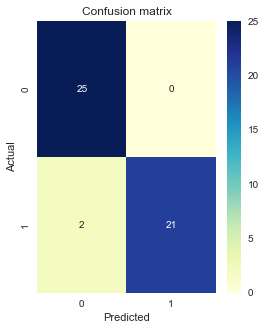

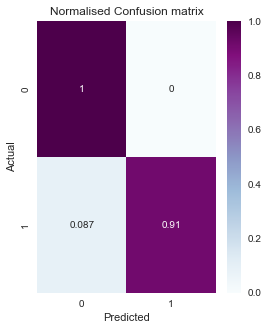

Best parameter:  {'algorithm': 'ball_tree', 'leaf_size': 30, 'n_neighbors': 15}
-------------------------------------------------------------------------------------
Model name =  knn
Metric:  roc_auc
Validation score: 95.65%
=================================CLIENT CRITERIA 1==============================================
Out of 23 malignant data total of 21 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 91.30434782608695%
=================================CLIENT CRITERIA 2==============================================
Out of 25 data total of 0 data are misclassified as Malignant instead of Benign


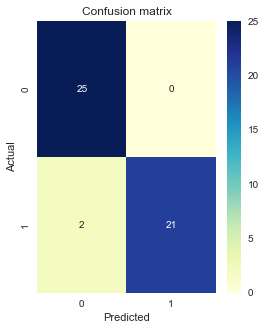

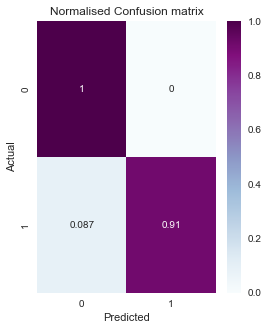

Best parameter:  {'algorithm': 'ball_tree', 'leaf_size': 30, 'n_neighbors': 15}
-------------------------------------------------------------------------------------
Model name =  svm
Metric:  accuracy
Validation score: 91.67%
=================================CLIENT CRITERIA 1==============================================
Out of 23 malignant data total of 21 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 91.30434782608695%
=================================CLIENT CRITERIA 2==============================================
Out of 25 data total of 2 data are misclassified as Malignant instead of Benign


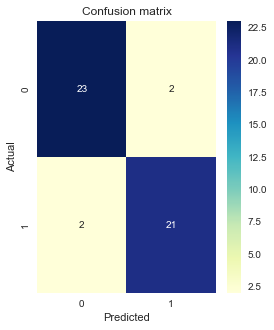

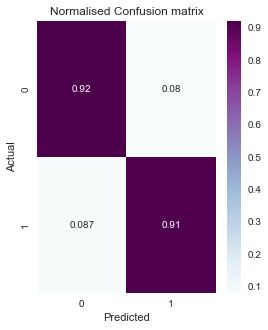

Best parameter:  {'C': 1.0, 'degree': 3, 'kernel': 'linear'}
-------------------------------------------------------------------------------------
Model name =  svm
Metric:  balanced_accuracy
Validation score: 91.65%
=================================CLIENT CRITERIA 1==============================================
Out of 23 malignant data total of 21 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 91.30434782608695%
=================================CLIENT CRITERIA 2==============================================
Out of 25 data total of 2 data are misclassified as Malignant instead of Benign


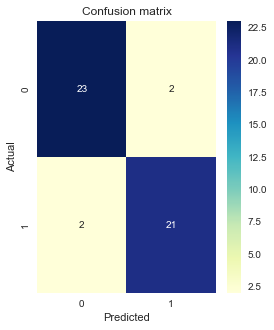

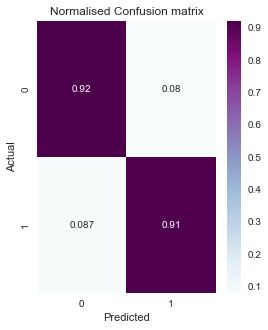

Best parameter:  {'C': 1.0, 'degree': 3, 'kernel': 'linear'}
-------------------------------------------------------------------------------------
Model name =  svm
Metric:  roc_auc
Validation score: 91.65%
=================================CLIENT CRITERIA 1==============================================
Out of 23 malignant data total of 21 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 91.30434782608695%
=================================CLIENT CRITERIA 2==============================================
Out of 25 data total of 2 data are misclassified as Malignant instead of Benign


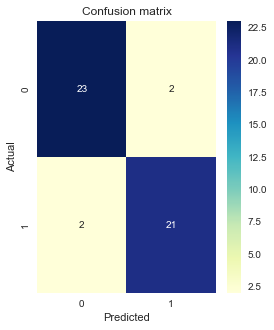

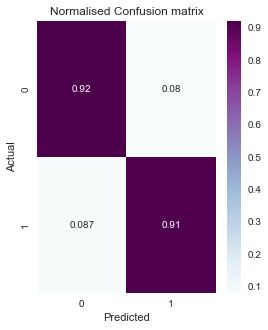

Best parameter:  {'C': 1.0, 'degree': 3, 'kernel': 'linear'}
-------------------------------------------------------------------------------------
Model name =  dtree
Metric:  accuracy
Validation score: 87.5%
=================================CLIENT CRITERIA 1==============================================
Out of 23 malignant data total of 20 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 86.95652173913044%
=================================CLIENT CRITERIA 2==============================================
Out of 25 data total of 3 data are misclassified as Malignant instead of Benign


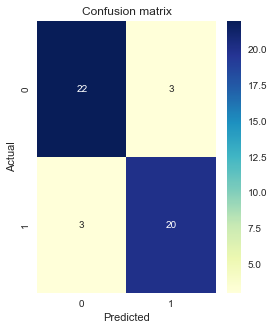

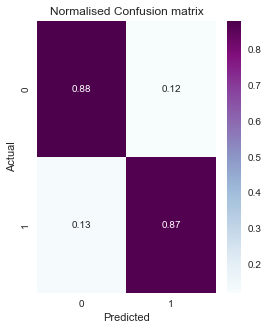

Best parameter:  {'criterion': 'gini', 'max_depth': 2, 'max_leaf_nodes': 2, 'min_samples_leaf': 2, 'min_samples_split': 2}
-------------------------------------------------------------------------------------
Model name =  dtree
Metric:  balanced_accuracy
Validation score: 87.48%
=================================CLIENT CRITERIA 1==============================================
Out of 23 malignant data total of 20 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 86.95652173913044%
=================================CLIENT CRITERIA 2==============================================
Out of 25 data total of 3 data are misclassified as Malignant instead of Benign


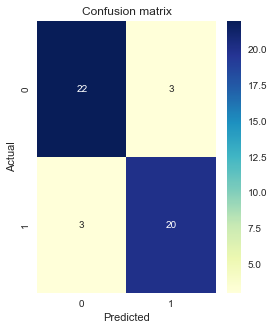

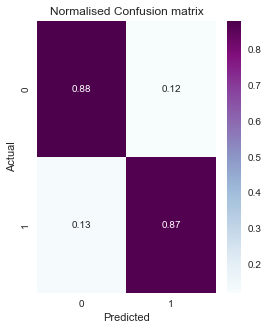

Best parameter:  {'criterion': 'gini', 'max_depth': 2, 'max_leaf_nodes': 2, 'min_samples_leaf': 2, 'min_samples_split': 2}
-------------------------------------------------------------------------------------
Model name =  dtree
Metric:  roc_auc
Validation score: 87.48%
=================================CLIENT CRITERIA 1==============================================
Out of 23 malignant data total of 20 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 86.95652173913044%
=================================CLIENT CRITERIA 2==============================================
Out of 25 data total of 3 data are misclassified as Malignant instead of Benign


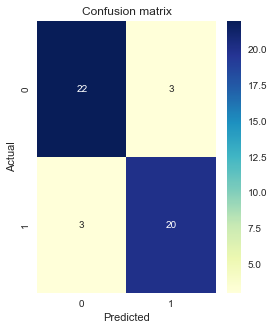

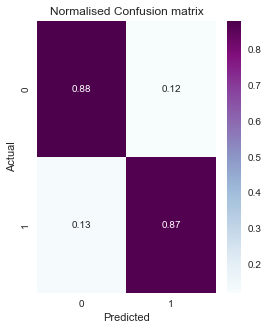

Best parameter:  {'criterion': 'entropy', 'max_depth': 2, 'max_leaf_nodes': 50, 'min_samples_leaf': 2, 'min_samples_split': 50}
-------------------------------------------------------------------------------------
Model name =  sgd
Metric:  accuracy
Validation score: 97.92%
=================================CLIENT CRITERIA 1==============================================
Out of 23 malignant data total of 22 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 95.65217391304348%
=================================CLIENT CRITERIA 2==============================================
Out of 25 data total of 0 data are misclassified as Malignant instead of Benign


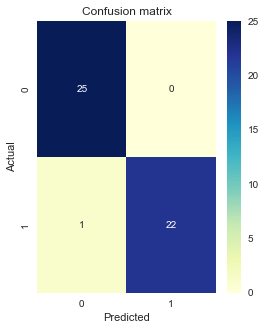

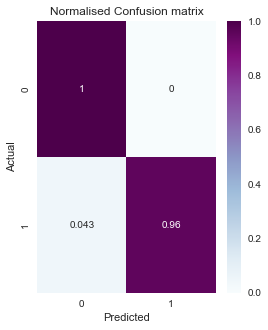

Best parameter:  {'alpha': 0.25, 'learning_rate': 'optimal', 'loss': 'log_loss', 'penalty': 'l2', 'random_state': 19}
-------------------------------------------------------------------------------------
Model name =  sgd
Metric:  balanced_accuracy
Validation score: 97.83%
=================================CLIENT CRITERIA 1==============================================
Out of 23 malignant data total of 22 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 95.65217391304348%
=================================CLIENT CRITERIA 2==============================================
Out of 25 data total of 0 data are misclassified as Malignant instead of Benign


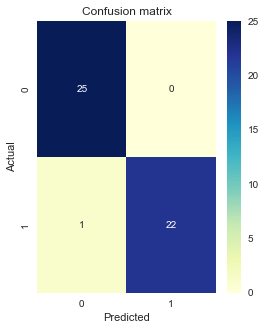

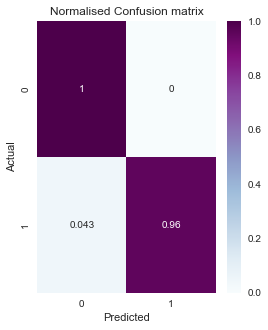

Best parameter:  {'alpha': 0.25, 'learning_rate': 'optimal', 'loss': 'log_loss', 'penalty': 'l2', 'random_state': 19}
-------------------------------------------------------------------------------------
Model name =  sgd
Metric:  roc_auc
Validation score: 97.83%
=================================CLIENT CRITERIA 1==============================================
Out of 23 malignant data total of 22 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 95.65217391304348%
=================================CLIENT CRITERIA 2==============================================
Out of 25 data total of 0 data are misclassified as Malignant instead of Benign


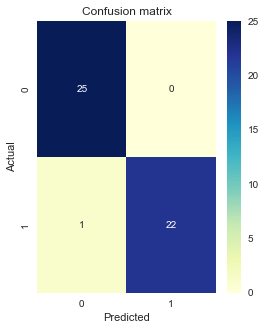

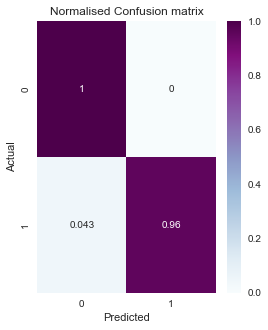

Best parameter:  {'alpha': 0.0625, 'learning_rate': 'optimal', 'loss': 'log_loss', 'penalty': 'l2', 'random_state': 19}
-------------------------------------------------------------------------------------


,Model,Metric,Parameters,Validation Score,Client_req_1,Client_req_2
9,sgd,accuracy,"{'alpha': 0.25, 'learning_rate': 'optimal', 'l...",97.916667,95.652174,0 of 25
10,sgd,balanced_accuracy,"{'alpha': 0.25, 'learning_rate': 'optimal', 'l...",97.826087,95.652174,0 of 25
11,sgd,roc_auc,"{'alpha': 0.0625, 'learning_rate': 'optimal', ...",97.826087,95.652174,0 of 25
0,knn,accuracy,"{'algorithm': 'ball_tree', 'leaf_size': 30, 'n...",95.833333,91.304348,0 of 25
1,knn,balanced_accuracy,"{'algorithm': 'ball_tree', 'leaf_size': 30, 'n...",95.652174,91.304348,0 of 25
2,knn,roc_auc,"{'algorithm': 'ball_tree', 'leaf_size': 30, 'n...",95.652174,91.304348,0 of 25
3,svm,accuracy,"{'C': 1.0, 'degree': 3, 'kernel': 'linear'}",91.666667,91.304348,2 of 25
4,svm,balanced_accuracy,"{'C': 1.0, 'degree': 3, 'kernel': 'linear'}",91.652174,91.304348,2 of 25
5,svm,roc_auc,"{'C': 1.0, 'degree': 3, 'kernel': 'linear'}",91.652174,91.304348,2 of 25
6,dtree,accuracy,"{'criterion': 'gini', 'max_depth': 2, 'max_lea...",87.500000,86.956522,3 of 25


In [151]:
# STEP 8: Use the all models, list of parameters to get the best model parameter using Grid search CV

report_ = []
for mname, modelpipeline, modelparameters in zip(["knn", "svm", "dtree", "sgd"],
                                                 [knn_pipeline, svc_pipeline, dtree_pipeline, sgd_pipeline],
                                                 [knn_parameters, svm_parameters, dtree_parameters, sgd_parameters]):
    # model
    model = modelpipeline[0]
    
    # looping all the performance metrics
    for perfmetric in scoringmetrics:
        
        # grid search cv for finding the best hyper parameter from the given set of parameters
        optim_ = GridSearchCV(model, modelparameters, scoring=perfmetric, n_jobs=1)
        optim_.fit(train_scaled, trainy)
        
        # Best parameter
        best_parameters = optim_.best_params_
        
        # prediction using the model from the for loop
        best_prediction = models_(mname, best_parameters, train_scaled, trainy, valid_scaled)
        
        # validation metric
        valid_metric = metrics_(perfmetric, validy, best_prediction)*100
        
        # report
        print("Model name = ", mname)
        print("Metric: ", perfmetric)
        print("Validation score: {}%".format(round(valid_metric,2)))
        
        # checking the client requirements
        c1_df, c1_acc_malig, c1_tot_act_malig, c1_tot_pred_malig = clientcriteria_1(validy, best_prediction)
        c2_df, c2_tot_malig, c2_tot_benign = clientcriteria_2(validy, best_prediction)
        c2_prop = str(c2_tot_malig)+" of "+str(c2_tot_benign)
        
        # confusion matrix heatmap
        confusionmatrix_heatmap(validy, best_prediction)
        print("Best parameter: ", best_parameters)
        print("-------------------------------------------------------------------------------------")
        report_.append([mname, perfmetric, best_parameters, valid_metric, c1_acc_malig, c2_prop])

        df_report = pd.DataFrame(data=report_, columns=["Model", "Metric", "Parameters", "Validation Score",
                                               "Client_req_1", "Client_req_2"])
# Model report - sorted
df_report = df_report.sort_values(by="Validation Score", ascending=False)
df_report

In [152]:
# STEP 8: Select the model with the best validation score and it's corresponding client's requirement

best_model_new = df_report.iloc[0]
best_model_new_para = best_model_new["Parameters"]
best_model_new_para

{'alpha': 0.25,
 'learning_rate': 'optimal',
 'loss': 'log_loss',
 'penalty': 'l2',
 'random_state': 19}

**From the above ananlysis, we can observe that:**
* -We have obtained the best model as Stochastic gradient descent SGD with the following metrics:
    - Total validation score is 97.91% whereas, the model shows that it has 95.652% probablity predicting the malignant cases and whereas "0 of 25" means that there as none misclassification on predicting malignant as benign.
    
    - <u>Overall, our best model follows the clients both requirements:</u>
        - **Client requirement 1:**
            * In this client reuqirement, we had to obtain the 95% probablity of predicting the malignant cases, and our best model has predicted all the malignant cases with the probablity of 95.65%. Hence we can say that, model follows the first client requirement.
        - **Client requirement 2:**
            * In this client requirement, we can only make a misclassification of 1 time out of 10 benign classes. In this model, we have made no misclassification, so we can say that model ha predicted correctly.
            
*  Our best model has following parameter:
    * alpha 0.25
    * learning rate 'optimal'
    * loss log-loss
    * penalty l2
    * random_state 19

In [153]:
# STEP 9: After getting the best parameter and model, use those into train data and predict for test data by using sclaing.
scale = preprocesser(xtrain, preprocess_pipeline)
scale_fit = scale.fit_scaling()

# sclaing the train data
train_scaled = scale.tranform_scaling(xtrain)

# scaling the test data fom train data
test_scaled = scale.tranform_scaling(xtest)

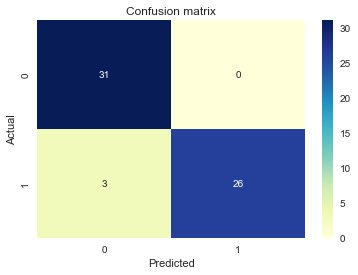

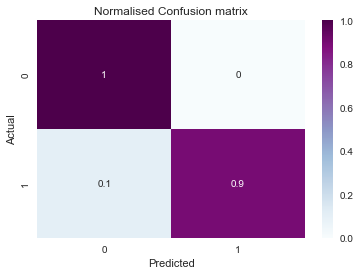

=================================CLIENT CRITERIA 1==============================================
Out of 29 malignant data total of 26 data are predicted as Malignant
Total probablity of predicting malignant when the malignant is present is: 89.65517241379311%
=================================CLIENT CRITERIA 2==============================================
Out of 31 data total of 0 data are misclassified as Malignant instead of Benign


In [154]:
# STEP 10: Analayse the performance for scores and clients requirement

# SGD model from pipeline
clf_new = sgd_pipeline[0]

# setting the best parameter
clf_new.set_params(**best_model_new_para)

# fitting the train data into model
clf_new.fit(train_scaled, ytrain)

# predicting
pred_new = clf_new.predict(test_scaled)

# performance metric
df_best, a, ba, rs, ps, auc_, f1s, fbeta_10, fbeta_01, f1micro, f1macro  = getallmetric(ytest, pred_new)

# client reuqirements
c1_df_best, c1_best_acc, c1_best_actualmalig, c1_pred_malig_best = clientcriteria_1(ytest, pred_new)
c2_df_best, c2_malig_best, c2_benig_best =clientcriteria_2(ytest, pred_new)

**Performance observation from the test data**

- Here we can see that, After removing the worst fetauire, our model has 89.65% probablity of predicting maliganant cases when the malignant cases are present. 

- We can observe that, our probablity is lesser than the clients requirement hence we can say that the model is not following the clients first requirement for obtaining the 95% probablity for predicting malignant cases.

- However, we cans see that, there were 31 benign cases, and we 0 misclassification for benign. Hence, we can say that the model is following the clients second requirement.

- Comparing the normalised confusion matrix we can see that, we have predicted all the true negative casses correctly and we do not have any false positive cases. However, we can see that we have 0.9 True positive preduction but there is 0.1 probablity that we have False negative prediction.

### 4.2 Performance difference [1 mark]

Do you think the new classifier, that does not use the "worst" features, is:
 - **as good as the previous classifier** (that uses all the features)
 - **better than the previous classifier**
 - **worse than the previous classifier**
 
Give reasons for your answer.

**Model with no worst data is not performing good as the model with the worst data**

* **We can see that, when the model is not having the worst data, it has 89.65% of probablity of predicting the malignant cases and whereas, when we had worst data, we had predicted the malignant cases with the 96.55%.** 

* **Our model with the worst data was supported for clients requirement whereas model with no wotrst data is not supporting the clients first requirement for having the 95% probabality of predicting the malignant cases.**

* **Whereas, our model with worst data and model with no worst data has still supported the second clients reuirement.**

* **Therefore, we can say that even though the model with no worst data was less in complex it did not perform well compared to the model with worst data. Hence we can say that MOdel with worst data is good.**

### MODEL INTERPRETATION USING SHAP ANALYSIS


* Here we can use SHAP analysis, for model interpretation.
* Reason for model pretation is because, many people consider machine learning models are black box. But it is not, we can undertand the prediction using teh SHAP analysis.
*  We can clearly see why do we have malignant case for particular patient and vice versa
* This is called explainable AI methods.


**I am still learning this SHAP method, I still have beginer knowledge on this and I want to learn more because it is very usefull. Therefore I thiough to use this method in the assignment because we have role of client and any develope or a data scientist need to explain the result for client**

In [166]:
import shap 

In [167]:
# ORIGINAL DATA WITH THE LABELS

df_shap = data.copy()
df_shap["label"] = np.where(df_shap["label"]=="malignant", 1, 0)
X = df_shap.iloc[:, 1:].values
Y = df_shap.iloc[:, 0].values

# divide the data into train and test
xtrain, xtest, ytrain, ytest = train_test_split(X, Y, test_size=0.2, shuffle=True, random_state=53,
                                               stratify=Y)

In [168]:
# function for analysing the shap values
def gettopshapvalues(shapvalues, indexval, featureset):
    df_shap_ = pd.DataFrame(shapvalues[0][indexval, :], 
                            index=featureset, columns=["Score"]).sort_values(by="Score", ascending=False)
    df_shap_["Rev score"] = [x for x in reversed(range(1, df_shap_.shape[0]+1))]
    df_shap_ = df_shap_.iloc[:10, :]
    effectivefeat = df_shap_.index 
    effectivescore = df_shap_["Rev score"]
    return effectivefeat, effectivescore

In [169]:
# SHAP analysis
clf_shap = DecisionTreeClassifier().fit(xtrain, ytrain)
explainer_clf = shap.TreeExplainer(clf_shap)
shap_vales = explainer_clf.shap_values(xtrain)

In [170]:
# supporting data for further analysis
df_train = pd.DataFrame(data=xtrain, columns=df_shap.columns[1:])
df_test = pd.DataFrame(data=xtest, columns=df_shap.columns[1:])

In [2]:
# shap initiate

shap.initjs()

Diagnosis is:  Malignant


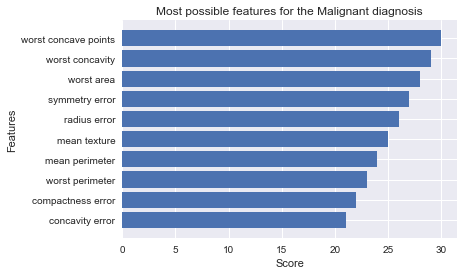

In [173]:
df_t = df_test.iloc[0, :]
pred_sh = clf_shap.predict(df_t.values.reshape(1,-1))[0]
if pred_sh==1:
    diag = "Malignant"
else:
    diag = "Benign"
print("Diagnosis is: ", diag)
effectfeat, featscore =gettopshapvalues(shap_vales, 0, data.columns[1:])
plt.barh(effectfeat[::-1], featscore[::-1])
plt.title("Most possible features for the "+diag+" diagnosis")
plt.xlabel("Score")
plt.ylabel("Features")
plt.show()

shap.force_plot(explainer_clf.expected_value[0], shap_vales[0][1, :], df_t)

From the above analysis, we can see that our prediction is **Malignant**. But to understand the reason, we can use the SHAP force plot.

From  the force plot we can see that features like 
* worst concave points
* worst concavity
* worst area
* worst tecture

are pushing the values for higher region (red) **malignant** prediction. Hence we say that the patient has *Maligannt* because of the above important features.

Diagnosis is:  Benign


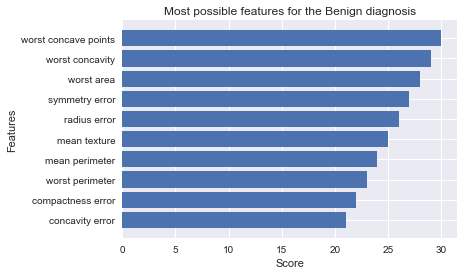

In [174]:
df_t = df_test.iloc[59,:]
pred_sh = clf_shap.predict(df_t.values.reshape(1,-1))[0]
if pred_sh==1:
    diag= "Malignant"
else:
    diag= "Benign"
print("Diagnosis is: ", diag)
effectfeat, featscore =gettopshapvalues(shap_vales, 0, data.columns[1:])
plt.barh(effectfeat[::-1], featscore[::-1])
plt.title("Most possible features for the "+diag+" diagnosis")
plt.xlabel("Score")
plt.ylabel("Features")
plt.show()

shap.force_plot(explainer_clf.expected_value[1], shap_vales[1][1, :], df_t)

From the above analysis, we can see that our prediction is **Benign**. But to understand the reason, we can use the SHAP force plot.

From  the force plot we can see that features like 
* worst concave points
* worst concavity
* worst area
* worst tecture

are pushing the values to the lower region (blue) for **benign** prediction. Hence we say that the patient has *benign* because of the above important features.

Diagnosis is:  Malignant


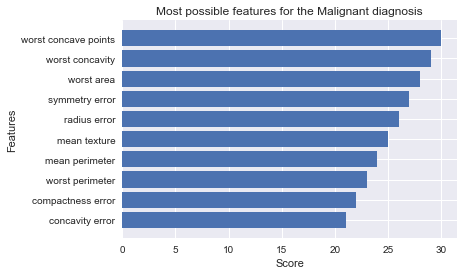

In [176]:
df_t = df_test.iloc[2, :]
pred_sh = clf_shap.predict(df_t.values.reshape(1,-1))[0]
if pred_sh==1:
    diag = "Malignant"
else:
    diag = "Benign"
print("Diagnosis is: ", diag)
effectfeat, featscore =gettopshapvalues(shap_vales, 0, data.columns[1:])
plt.barh(effectfeat[::-1], featscore[::-1])
plt.title("Most possible features for the "+diag+" diagnosis")
plt.xlabel("Score")
plt.ylabel("Features")
plt.show()

shap.force_plot(explainer_clf.expected_value[0], shap_vales[0][1, :], df_t)

From the above analysis, we can see that our prediction is **Malignant**. But to understand the reason, we can use the SHAP force plot.

From  the force plot we can see that features like 
* worst concave points
* worst concavity
* worst area
* worst tecture

are pushing the values to the higher region (red) for **Malignant** prediction. Hence we say that the patient has *Malignant* because of the above important features.